In [36]:
import sqlite3
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import datetime as dt

## MTA

In [37]:
mta_df = pd.read_sql_table('mta_data', 'sqlite:///G:\My Drive\Coding\Metis\EDA\Project\Data\mta_data.db')

In [38]:
mta_df['DATE'] = pd.to_datetime(mta_df.DATE)
mta_df['TIME'] = pd.to_datetime(mta_df.TIME)

In [39]:
mta_df.sort_values(["C/A", "UNIT", "SCP", "STATION", "DATE", "TIME"], 
                          inplace=True, ascending=False)
mta_df.drop_duplicates(subset=["C/A", "UNIT", "SCP", "STATION", "DATE", "TIME"], inplace=True)

In [40]:
mta_daily = (mta_df
          .groupby(["C/A", "UNIT", "SCP", "STATION", "DATE"],as_index=False)
          .ENTRIES.max())

In [41]:
mta_daily[["PREV_DATE", "PREV_ENTRIES"]] = (mta_df
                                         .groupby(["C/A", "UNIT", "SCP", "STATION"])["DATE", "ENTRIES"]
                                         .apply(lambda grp: grp.shift(1)))

C:\Users\Angus\AppData\Local\Temp\ipykernel_27588\3819289695.py:1: FutureWarning: Indexing with multiple keys (implicitly converted to a tuple of keys) will be deprecated, use a list instead.
  mta_daily[["PREV_DATE", "PREV_ENTRIES"]] = (mta_df


In [42]:
mta_daily.dropna(subset=["PREV_DATE"], axis=0, inplace=True)

In [43]:
mta_daily[mta_daily["ENTRIES"] < mta_daily["PREV_ENTRIES"]].head()

,C/A,UNIT,SCP,STATION,DATE,ENTRIES,PREV_DATE,PREV_ENTRIES
0,A002,R051,02-00-00,59 ST,2021-02-27,7537589,2021-05-22,7575515.0
1,A002,R051,02-00-00,59 ST,2021-02-28,7537852,2021-05-22,7575523.0
2,A002,R051,02-00-00,59 ST,2021-03-01,7538400,2021-05-22,7575557.0
3,A002,R051,02-00-00,59 ST,2021-03-02,7538926,2021-05-22,7575630.0
4,A002,R051,02-00-00,59 ST,2021-03-03,7539503,2021-05-22,7575643.0


In [44]:
def get_daily_counts(row, max_counter):
    counter = row["ENTRIES"] - row["PREV_ENTRIES"]
    if counter < 0:
        # Maybe counter is reversed?
        counter = -counter
    if counter > max_counter:
        # Maybe counter was reset to 0? 
        print(row["ENTRIES"], row["PREV_ENTRIES"])
        counter = min(row["ENTRIES"], row["PREV_ENTRIES"])
    if counter > max_counter:
        # Check it again to make sure we're not still giving a counter that's too big
        return 0
    return counter

mta_daily["DAILY_ENTRIES"] = mta_daily.apply(get_daily_counts, axis=1, max_counter=1000000)

7574811 1431153.0
7575406 1431154.0
7575643 1431162.0
7575645 1431199.0
7576141 1431201.0
7576809 1431201.0
7577394 1431201.0
7578003 1431201.0
7578660 1431207.0
6677049 1431217.0
6677237 1431221.0
6677608 1431223.0
6677990 1431223.0
6678380 1431228.0
6678754 1431257.0
6679159 1431325.0
6679428 1431426.0
6679598 1431456.0
6679927 1431457.0
6680308 1431463.0
6680661 1431493.0
6681049 1431566.0
6681432 1431666.0
6681728 1431697.0
6681895 1431701.0
6682238 1431706.0
6682579 1431721.0
6682962 1431776.0
6683296 1431887.0
6683688 1431933.0
6683959 1431935.0
6684168 1431939.0
6684523 1431953.0
6684831 1432007.0
6685190 1432114.0
6685570 1432149.0
6685992 1432152.0
6686637 1432158.0
6686929 1432181.0
6687318 1432304.0
6687751 1432402.0
6689128 1594674.0
6689878 1594687.0
6690499 1594734.0
6690908 1594832.0
6691320 1594845.0
6691749 1594845.0
6692163 1594845.0
6692594 1594873.0
6693017 1594901.0
6693330 1594906.0
6693535 1594915.0
6693882 1594917.0
6694265 1594936.0
6694703 1594985.0
6695082 15

119767733 349656.0
119768118 349707.0
119768545 349729.0
119768977 349737.0
119769447 349739.0
119769906 349750.0
119770139 349785.0
119770344 349828.0
119770763 349851.0
119771246 349857.0
119771727 349860.0
119772226 349878.0
119772669 349913.0
119772978 349956.0
119773241 349992.0
119773669 350000.0
119774014 350009.0
119774520 350025.0
119775000 350056.0
119775496 350090.0
119775535 29.0
119775966 64.0
119776456 75.0
119776962 80.0
119777459 101.0
119777943 118.0
5160702 160.0
5160780 185.0
5160920 186.0
5161080 191.0
5161267 217.0
5161415 259.0
5161584 337.0
5161773 372.0
5161941 377.0
5162090 385.0
5162277 404.0
5162428 461.0
5162652 541.0
5162867 585.0
5163111 595.0
5163269 599.0
5163394 615.0
5163555 667.0
5163728 754.0
5163851 780.0
5164044 789.0
5164330 799.0
5164560 828.0
5164724 873.0
5164923 953.0
5165065 1014.0
5165255 1025.0
5165492 1033.0
5165833 1049.0
5165915 1115.0
5166124 1189.0
5166549 614208.0
5166727 614214.0
5166896 614247.0
5167164 614333.0
5167414 614417.0
516

885604382 9041006.0
885604124 9041346.0
885603817 9041492.0
885603515 9041508.0
885603271 9041603.0
885603108 9041776.0
885603005 9042052.0
885602771 9042408.0
885602248 8509143.0
885601993 8509158.0
60264 8509217.0
60431 8509352.0
60686 8509539.0
60999 8509676.0
61297 8509719.0
61576 8509732.0
61847 8509802.0
62055 8509907.0
62206 8510036.0
62471 8510171.0
62778 8510181.0
63116 8510274.0
63420 8510401.0
63707 8510566.0
63942 8510850.0
64107 8510957.0
64365 8510964.0
64658 8511061.0
64974 8511201.0
65274 8511379.0
65568 8511701.0
65782 8511808.0
65929 8511814.0
66182 8511909.0
66453 8512052.0
66794 8512251.0
67070 8512563.0
67372 8512692.0
67588 8512706.0
67740 8512791.0
67944 8512924.0
68233 8513106.0
68525 8513432.0
68829 8513576.0
69124 8513594.0
69322 8513666.0
69500 8513797.0
69797 8514046.0
70098 8514377.0
84035 2390714.0
84433 2390727.0
84685 2390813.0
84865 2391029.0
85151 2391381.0
85497 2391659.0
85848 2391746.0
86182 2391763.0
86498 2391819.0
47802 2392013.0
47932 2392262.0


7556741 1171395.0
7556922 1171526.0
7557119 1171615.0
7557318 1171641.0
7557531 1171643.0
7557706 1171668.0
7557869 1171699.0
7558067 1171843.0
7558292 1171939.0
7558527 1171983.0
7558764 1171985.0
7559012 1172010.0
7559273 1172046.0
7559489 1172182.0
7559706 1172276.0
7559934 1172330.0
7560188 1172332.0
7560263 1172348.0
7560540 1172395.0
7560801 1172547.0
7560966 1172653.0
7561170 1172699.0
7561356 1172700.0
7561542 1172720.0
7561757 1172758.0
202101 4780274.0
202200 4780289.0
202337 4780350.0
202467 4780458.0
202609 4780536.0
202721 4780596.0
202822 4780603.0
202918 4780617.0
203016 4780661.0
203132 4780730.0
203263 4780786.0
203420 4780832.0
203520 4780833.0
203648 4780878.0
203778 4780944.0
203911 4781161.0
204030 4781322.0
204258 4781381.0
204442 4781385.0
204594 4781443.0
204806 4781513.0
205038 4781730.0
205287 4781919.0
205536 4781986.0
205747 4781990.0
205919 4782057.0
206034 4782141.0
206239 4782402.0
206507 4782603.0
206747 4782666.0
206979 4782667.0
207186 4782712.0
207383

5533082 9085771.0
5533946 9085771.0
5534842 9085790.0
5535444 9085840.0
5535933 9085942.0
5536829 9086040.0
5537746 9086063.0
5538672 9086066.0
5539596 9086081.0
5540509 9086124.0
5541140 9086244.0
5541537 9086359.0
5542418 9086380.0
5543393 9086380.0
5544413 9086388.0
5545315 9086447.0
5546227 9086590.0
5546870 9086698.0
5547428 9086736.0
5548364 9086736.0
5549315 9086753.0
5550205 9086794.0
5551163 9086917.0
5552169 9087016.0
5553300 9901636.0
5554184 9901663.0
5555154 9901743.0
5556157 9901923.0
5557137 9902051.0
5558137 9902113.0
5558807 9902123.0
5559399 9902137.0
5560284 9902204.0
5561267 9902337.0
5562334 9902448.0
5563351 9902475.0
5564402 9902477.0
5565154 9902508.0
5565722 9902604.0
5566698 9902775.0
5567793 9902948.0
5568815 9902992.0
5569887 9902995.0
5570806 9903028.0
14111930 9903129.0
14112470 9903305.0
14113618 9903479.0
14114888 9903539.0
14116209 9903541.0
14117420 9903576.0
14118607 9903672.0
14119414 9903859.0
14119993 9904026.0
14121232 9904073.0
14122473 9904075.0

8104767 638058496.0
8105087 638058496.0
8105423 638058496.0
8105755 638058496.0
8106312 638058496.0
8106823 638058496.0
8107198 638058496.0
8107771 638058496.0
8108518 638058496.0
8109340 638058496.0
8109769 638058496.0
8110157 638058496.0
8110512 638058496.0
8110784 638058496.0
8111114 638058496.0
8111463 638058496.0
8111815 638058496.0
8112160 638058496.0
8112569 638058496.0
8112948 638058496.0
8113210 638058496.0
8113500 638058496.0
8113886 638058496.0
8114290 638058496.0
8114677 638058496.0
8115062 638058496.0
8115452 638058496.0
8115766 638058496.0
8116128 638058496.0
8116496 638058496.0
8116886 638058496.0
8117274 638058496.0
8117693 638058496.0
5098788 638058496.0
5099009 638058496.0
5099425 638058496.0
5099828 638058496.0
5100249 638058496.0
5101101 3031.0
5101362 3034.0
5101583 3044.0
5101971 3058.0
5102400 3075.0
5102803 3080.0
5103216 3080.0
5103594 3081.0
5103798 3089.0
5103959 3105.0
5104339 3116.0
5104691 3119.0
5105142 3119.0
5105634 3122.0
5106089 3127.0
5106503 3136.0


18379921 179332.0
18381682 179342.0
18383418 179344.0
18386862 5337720.0
18387897 5337848.0
18389445 5338045.0
18391213 5338345.0
18393070 5338610.0
18394806 5338697.0
18396608 5338721.0
18398229 5338815.0
18398491 5338951.0
2403 5339189.0
3639 5339421.0
5377 5339490.0
7210 5339504.0
9109 5339847.0
10862 5340053.0
12058 5340284.0
13873 5340457.0
15659 5340510.0
17512 5340523.0
19242 5340891.0
21213 5341094.0
22942 5341336.0
24201 5341542.0
25876 5341618.0
27716 5341633.0
29649 5341997.0
31634 5342207.0
33687 5342431.0
35316 5342625.0
36487 5342677.0
38200 5342696.0
40184 5343059.0
42250 5343270.0
44270 5343462.0
46410 5343696.0
48248 5343776.0
49633 5343791.0
51499 5344087.0
53282 5344309.0
55510 5344534.0
57673 5344737.0
61619 4164411.0
63016 4164474.0
64869 4164594.0
66816 4164787.0
68903 4164948.0
70997 4164997.0
73101 4165006.0
786303 4165057.0
786310 4165142.0
786321 4165310.0
786331 4165455.0
786343 4165503.0
786355 4165514.0
786365 4165735.0
786372 4165876.0
786377 4166019.0
786

26547816 1.0
26548432 1.0
26549254 1.0
26550136 1.0
26550997 1.0
26551790 1.0
26552763 1.0
26553753 1.0
26554433 1.0
26555220 1.0
26555906 1.0
26556668 1.0
26557469 1.0
26558439 1.0
26559427 1.0
26560082 1.0
26560933 1.0
26561784 1.0
26562715 1.0
26563577 1.0
26564515 1.0
26565432 1.0
26566108 1.0
26566942 1.0
26567795 1.0
26569537 33554932.0
26570505 33554932.0
26571287 33554932.0
26571902 33554932.0
26572717 33554932.0
26573607 33554932.0
26574442 33554932.0
26575365 33554932.0
26576359 33554932.0
26577392 33554932.0
26578120 33554932.0
26578907 33554932.0
26579811 33554932.0
26580755 33554932.0
26581616 33554932.0
26582514 33554932.0
26583317 33554932.0
26584000 33554932.0
26584976 33554932.0
26585914 33554932.0
26586889 33554932.0
26587796 33554932.0
26588812 33554932.0
4036777 33554932.0
4036942 33554932.0
4037121 33554932.0
4037315 33554932.0
4037520 33554932.0
4037721 33554932.0
4037963 33554932.0
4038187 33554932.0
4038385 33554932.0
4038564 33554932.0
4038768 33554932.0
403897

1398481 7308056.0
1398543 7308185.0
1398626 7308256.0
1398767 8687034.0
1398848 8687059.0
1398926 8687147.0
1398972 8687269.0
1399042 8687341.0
1399110 8687370.0
1399173 8687375.0
1399233 8687401.0
1399294 8687493.0
1399386 8687596.0
1399456 8687649.0
1399516 8687672.0
1399582 8687674.0
1399639 8687859.0
1399699 8688017.0
1399774 8688139.0
1399887 8688250.0
1400004 8688268.0
1400077 8688272.0
1400136 8688431.0
1400183 8688606.0
1400254 8688719.0
1400321 8688838.0
1400480 8688862.0
1400600 8688864.0
1400668 8689012.0
1400734 8689201.0
1400811 8689333.0
1400881 8689432.0
1400954 8689452.0
1401065 8689453.0
1401149 8689599.0
1401196 8689795.0
1401258 8689905.0
1401331 8690020.0
1401381 8690046.0
1401451 8690048.0
1401567 8690182.0
1401683 8690355.0
1401738 8690517.0
1401814 8690601.0
1401986 234742.0
1402088 234754.0
1402222 234850.0
1402336 234940.0
1402409 234985.0
1402509 235012.0
1402613 235017.0
1402702 235040.0
1402807 235104.0
1402936 235185.0
1403026 235243.0
1403121 235261.0
1403

9583922 601856.0
9584169 601857.0
9584501 601891.0
9584817 601964.0
9585119 602025.0
9585425 602089.0
9585806 602108.0
9586144 602108.0
9586393 602132.0
9586713 602202.0
9587050 602270.0
9587350 602312.0
9587987 96.0
9588435 96.0
9588751 96.0
9589043 96.0
9589354 96.0
9589688 96.0
9590000 96.0
9590379 96.0
9590814 97.0
9591121 97.0
9591436 97.0
9591789 97.0
9592131 97.0
9592436 97.0
9592854 97.0
9593207 97.0
9593514 97.0
9593875 97.0
9594198 97.0
9594523 97.0
9594838 97.0
9595238 97.0
9595538 97.0
9595779 97.0
9596096 97.0
9596408 97.0
9596730 97.0
9597056 97.0
9597398 97.0
9597789 97.0
9598108 97.0
9598447 97.0
9598817 97.0
9599151 97.0
9599523 97.0
9599892 97.0
9600270 97.0
9600506 97.0
9600891 97.0
9601250 97.0
9602052 10.0
9602499 10.0
13255615 10.0
13255985 10.0
13256495 10.0
13256984 10.0
13257537 10.0
13258038 10.0
13258547 10.0
13259057 10.0
13259442 10.0
13259960 10.0
13260510 10.0
13261042 10.0
13261564 10.0
13262113 10.0
13262685 10.0
13263083 10.0
13263579 10.0
13264091 10.

902307 4293447.0
902377 4293548.0
902532 12220868.0
902595 12220933.0
902647 12221034.0
902710 12221138.0
902783 12221228.0
902856 12221246.0
902930 12221248.0
903005 12221296.0
903092 12221371.0
903163 12221474.0
903251 12221565.0
903318 12221586.0
903406 12221591.0
903487 12221832.0
903573 12221983.0
903676 12222159.0
903724 12222294.0
903803 12222310.0
903875 12222316.0
903969 12222545.0
904068 12222705.0
904181 12222902.0
904309 12223027.0
904356 12223041.0
904452 12223055.0
904536 12223345.0
904601 12223512.0
904693 12223705.0
904788 12223838.0
904891 12223865.0
904974 12223876.0
905039 12224132.0
905103 12224304.0
905188 12224478.0
905279 12224620.0
905379 12224645.0
905500 12224654.0
905560 12224886.0
905618 12225057.0
905692 12225250.0
905755 12225349.0
905943 11618086.0
906028 11618148.0
906103 11618225.0
906180 11618334.0
906236 11618379.0
906306 11618396.0
906381 11618400.0
906506 11618428.0
906686 11618511.0
906776 11618600.0
906848 11618650.0
906916 11618678.0
906986 11618

179003 7118360.0
179052 7118526.0
179107 7118594.0
179150 7118598.0
179193 7118639.0
179261 7118713.0
179308 7118838.0
179368 7119046.0
179431 7119117.0
179487 7119128.0
179524 7119169.0
179550 7119254.0
179619 7119385.0
179673 7119551.0
179730 7119597.0
179783 7119604.0
179843 7119653.0
179909 7119738.0
179945 7119856.0
179995 7120048.0
180058 7120097.0
180104 7120111.0
180169 7120141.0
180218 7120221.0
180262 7120407.0
180326 7120594.0
180448 4089382.0
180520 4089399.0
180580 4089461.0
180661 4089617.0
180710 4089771.0
180756 4089872.0
180811 4089891.0
180874 4089899.0
180933 4089957.0
180992 4090064.0
181090 4090165.0
6024 4090217.0
6049 4090222.0
6105 4090251.0
6166 4090340.0
6220 4090465.0
6274 4090650.0
6281 4090707.0
40 4090712.0
59 4090758.0
107 4090859.0
156 4090987.0
216 4091143.0
273 4091231.0
324 4091237.0
365 4091276.0
398 4091370.0
459 4091483.0
510 4091667.0
578 4091722.0
629 4091730.0
712 4091786.0
747 4091877.0
801 4091985.0
869 4092168.0
940 4092229.0
999 4092235.0
10

117775542 5939006.0
117775596 5939305.0
117775652 5939402.0
117775698 5939412.0
117775730 5939798.0
117775760 5940235.0
117775805 5940526.0
117775859 5940848.0
117775925 5940924.0
117775994 5940935.0
117776063 5941332.0
3320724 5941768.0
3320745 5942105.0
3320817 5942388.0
3320885 5942470.0
3320957 5942481.0
3321027 5942865.0
3321092 5943271.0
3321117 5943618.0
3321147 5943903.0
3321285 11486270.0
3321361 11486417.0
3321429 11486640.0
3321500 11486841.0
3321530 11486996.0
3321553 11487052.0
3321616 11487061.0
3321675 11487147.0
3321737 11487341.0
3321805 11487505.0
3321877 11487619.0
3321908 11487659.0
3321930 11487661.0
3322007 11487920.0
3322078 11488198.0
3322138 11488392.0
3322210 11488581.0
3322291 11488631.0
3322316 11488635.0
3322336 11488970.0
3322409 11489250.0
3322475 11489485.0
3322541 11489708.0
3322613 11489760.0
3322658 11489760.0
3322686 11490026.0
3322705 11490336.0
3322762 11490574.0
3322829 11490795.0
3322900 11490845.0
3322980 11490848.0
3323068 11491182.0
3323108 11

2826122 8326481.0
2826244 8326618.0
2826353 8326773.0
2826453 8326895.0
2826590 8327016.0
2826720 8327047.0
2826884 8327055.0
2827029 8327177.0
2827171 8327320.0
2827279 8327420.0
2827370 8327522.0
2827646 1331.0
2827778 1331.0
2827912 1331.0
2828060 1331.0
2828155 1331.0
2828235 1331.0
2828355 1331.0
2828474 1331.0
2828622 1331.0
2828738 1331.0
2828840 1331.0
2828935 1331.0
2829009 1331.0
2829134 1331.0
2829250 1331.0
2829380 1331.0
2829527 1331.0
2829668 1331.0
2829777 1331.0
2829856 1331.0
2829988 1331.0
2830262 1331.0
2830577 1331.0
2830869 1331.0
2831168 1331.0
2831413 1331.0
2831611 1331.0
2831899 1331.0
2832044 1332.0
2832192 1332.0
2832336 1332.0
2832500 1332.0
2832631 1332.0
2832726 1332.0
2832859 1332.0
2833008 1332.0
2833176 1332.0
2833324 1332.0
2833497 1332.0
2833627 1332.0
2833718 1332.0
2834017 117440512.0
2834173 117440512.0
2834358 117440512.0
2834537 117440512.0
2834671 117440512.0
2834758 117440512.0
2834922 117440512.0
2835080 117440512.0
2835244 117440512.0
2835410

14729 1740379.0
14837 1740457.0
14963 1740558.0
15067 1740633.0
15173 1740678.0
15280 1740686.0
15340 1740687.0
15380 1740750.0
15503 1740842.0
15624 1740905.0
15739 1740948.0
15862 1740961.0
15986 1740969.0
16050 1741167.0
16115 1741265.0
16220 1741355.0
16346 1741402.0
16471 1741409.0
16584 1741413.0
16694 1741605.0
16732 1741698.0
16763 1741767.0
16865 1741824.0
16979 1741830.0
17099 1741838.0
17234 1741994.0
17384 1742132.0
17479 1742225.0
17551 1742292.0
17678 1742301.0
17806 1742306.0
17926 1742481.0
18046 1742587.0
18160 1742665.0
1662532860 1742735.0
1662532870 1742744.0
1662532895 1742749.0
1662532923 1742909.0
1662532946 1743011.0
1662532965 1743083.0
1662532991 1743122.0
1662533017 781629.0
1662533038 781693.0
1662533068 781775.0
1662533098 781847.0
1662533130 781908.0
1662533149 781913.0
1662533175 781913.0
1662533187 781966.0
1662533200 782058.0
1662533229 782125.0
1662533256 782178.0
1662533289 782186.0
1662533320 782190.0
1662533348 782327.0
1662533363 782416.0
166253338

13135005 275977.0
13135484 276003.0
13135999 276020.0
13136345 276025.0
13136609 276025.0
13136979 276044.0
13137435 276078.0
13137915 276104.0
13138417 276127.0
13138969 276130.0
13139544 276130.0
13139864 276146.0
13140322 276178.0
13140749 276211.0
13141261 276239.0
13141758 276247.0
13142310 276247.0
13142738 276262.0
13143078 276297.0
13143535 276335.0
13144003 276369.0
13144567 276378.0
13145046 276378.0
13145541 276396.0
12232891 276428.0
12233088 276454.0
12233383 276485.0
12233706 276488.0
12234029 276488.0
12234372 276505.0
12234716 276541.0
12234902 276575.0
12235158 276606.0
12235723 15646696.0
12236075 15646847.0
12236445 15647134.0
12237668 15647347.0
12238617 15647509.0
12238936 15647579.0
12239291 15647590.0
12239602 15647710.0
12239912 15647951.0
12240231 15648154.0
12240653 15648309.0
12240966 15648369.0
12241211 15648377.0
12241546 15648798.0
12241911 15649171.0
12242252 15649402.0
12242594 15649614.0
12243023 15649683.0
12243342 15649686.0
12243506 15650093.0
122438

10909353 1409176.0
10909875 1409321.0
10910405 1409553.0
10910936 1409625.0
10911522 1409626.0
10912012 1409647.0
10912363 1409705.0
10912850 1409770.0
10913360 1409860.0
10913864 1409878.0
10914349 1409880.0
10914855 1409911.0
10915305 1409961.0
10915690 1410044.0
10916516 1410135.0
10917079 1410147.0
10917583 1410147.0
10917939 1410178.0
10918502 1410230.0
10918969 1410307.0
10919188 1410440.0
10919703 1410456.0
10920278 1410458.0
10920762 1410487.0
10921271 1410536.0
10921799 1410646.0
10922268 1410798.0
10922653 1410846.0
10923256 1410847.0
10923803 1410878.0
10924387 1410946.0
10924972 1411102.0
10925673 1411186.0
10926658 1405.0
10927172 1405.0
10927744 1405.0
10928282 1405.0
10928834 1405.0
10929406 1405.0
10929874 1405.0
10930250 1405.0
10930757 1405.0
10931358 1405.0
10931897 1405.0
10932417 1405.0
10933052 1405.0
10933599 1405.0
10933922 1405.0
10934456 1405.0
10934992 1405.0
10935663 1405.0
10936250 1405.0
10937028 1405.0
10937536 1405.0
10937975 1405.0
10938545 1405.0
10939

5770523 166142.0
5770908 166177.0
5771310 166181.0
5771664 166191.0
5771922 166219.0
5772320 166257.0
5772704 166319.0
5773103 166347.0
5773504 166348.0
5773946 166358.0
5774271 166373.0
5774565 166433.0
5774963 166520.0
5775413 166554.0
5775803 166571.0
5776225 166583.0
5776672 166613.0
5777016 166669.0
5777284 166739.0
5778126 234665.0
5778556 234673.0
5778952 234695.0
5779384 234790.0
5779727 234903.0
5780001 234992.0
5780395 235024.0
5780788 235029.0
5781245 235068.0
5781709 235130.0
5782139 235250.0
5782506 235322.0
5782833 235335.0
5783268 235347.0
5783686 235404.0
5784171 235490.0
5784623 235616.0
5785102 235671.0
6435041 235678.0
17381456 235699.0
3480024 262196.0
3480370 262196.0
3480908 262196.0
3481467 262196.0
3482097 262196.0
3482723 262196.0
3483364 262197.0
3483813 262197.0
3484219 262197.0
3484805 262197.0
3485338 262197.0
3485978 262198.0
3486594 262198.0
3487241 262198.0
3488134 524311.0
3488696 524311.0
3489278 524311.0
3489880 524311.0
3490493 524311.0
3491136 52431

2134143 95635.0
2134488 95652.0
2134780 95722.0
2135216 95853.0
2135661 95943.0
2136091 95943.0
2136281 95945.0
2136487 95987.0
2136822 96101.0
2137207 96204.0
2137637 96328.0
2138069 96375.0
2138365 96376.0
2138574 96421.0
2138908 96516.0
2139384 96649.0
2139891 96800.0
2140357 96845.0
2140802 96851.0
2141217 96903.0
2141477 97013.0
2141627 97154.0
2141957 97310.0
2142365 97359.0
2142762 97368.0
2143187 97403.0
2143443 97502.0
2143724 97608.0
2143942 97749.0
2144386 97813.0
2144881 97823.0
2145404 97860.0
2145925 97966.0
2146390 98110.0
2146707 98270.0
2147384 64224.0
2147888 64236.0
2148421 64301.0
2148911 64384.0
2149371 64483.0
2149692 64557.0
2150014 64592.0
2150527 64603.0
2151063 64646.0
2151581 64727.0
2151921 64806.0
2152170 64891.0
2152318 64905.0
2152455 64929.0
2152792 65008.0
2153307 65079.0
2153766 65186.0
2154271 65232.0
2154732 65235.0
2154989 65263.0
2155310 65334.0
2155826 65437.0
2156363 65542.0
2156849 65587.0
2157363 65592.0
2157834 65616.0
2158108 65685.0
2158386 

756230635 550965.0
756230937 550966.0
756231505 550991.0
756232104 551002.0
756232753 551017.0
756233397 551035.0
756234317 467693.0
756234613 467739.0
756235227 467777.0
756235841 467819.0
756236510 467870.0
756237158 467898.0
756237799 467904.0
756238157 467942.0
756238477 467968.0
756239095 468002.0
756239682 468027.0
756240335 468047.0
756240993 468051.0
756241621 468128.0
756242021 468196.0
756242396 468286.0
756243062 468351.0
756243672 468376.0
756244328 468383.0
756244986 468463.0
756245610 468521.0
756245955 468610.0
756246220 468670.0
756246742 468697.0
756247350 468699.0
756247958 468796.0
756248518 468852.0
756249062 468921.0
756249419 468986.0
756249667 469003.0
756250310 469005.0
756251042 469098.0
756251775 469144.0
756252493 469227.0
756253122 469300.0
756253493 469320.0
756253828 469322.0
756254562 469408.0
756255309 469461.0
756256102 469526.0
756256760 469587.0
756257799 101995.0
756258164 102121.0
756258842 102228.0
756259541 102347.0
756260215 102416.0
756260918 10

5309746 53993.0
5309746 54242.0
5309746 26347.0
5309746 26347.0
5309746 26347.0
5309746 26347.0
5309746 26347.0
5309746 26347.0
5309746 26347.0
5309746 26347.0
5309746 26347.0
5309746 26347.0
5309746 26347.0
67108864 26347.0
67108864 26347.0
67108864 26347.0
67108864 26347.0
67108864 26347.0
67108864 26347.0
67108864 26347.0
67108864 26347.0
67108864 26347.0
67108864 26347.0
67108864 26347.0
67108864 26347.0
67108864 26347.0
67108864 26347.0
67108864 26347.0
67108864 26347.0
67108864 26347.0
67108864 26347.0
67108864 26347.0
67108864 28318.0
67108864 28318.0
67108864 28318.0
67108864 28318.0
67108864 28318.0
67108864 28318.0
67108864 28318.0
67108864 28318.0
67108864 28318.0
67108864 28318.0
67108864 28318.0
67108864 28318.0
67108864 28318.0
67108864 28318.0
67108864 28318.0
67108864 28318.0
67108864 28318.0
67108864 28318.0
67108864 28318.0
67108864 28318.0
67108864 28318.0
67108864 28318.0
67108864 28318.0
67108864 28318.0
67108864 28318.0
67108864 28318.0
67108864 28318.0
67108864 2

6461759 159966.0
6462112 160073.0
6462300 160215.0
6462494 160307.0
6462845 160323.0
6463207 160335.0
6463521 160540.0
6463906 160671.0
6464291 160847.0
6464497 160965.0
6464692 160993.0
6465011 161002.0
6465306 161200.0
6465615 161326.0
6465891 161492.0
6466259 161591.0
6466495 161611.0
6466676 161624.0
6467042 161822.0
6467389 161949.0
6467739 162108.0
6468096 162224.0
6468448 162250.0
6468688 162256.0
6468861 162414.0
6469170 162544.0
6469535 162711.0
6469828 162814.0
6470475 451334.0
6470709 451412.0
6470877 451546.0
6471247 451691.0
6471534 451778.0
6471900 451812.0
6472297 451817.0
6472615 451873.0
6472848 451979.0
6473003 452092.0
6473383 452161.0
6473655 452192.0
6474010 452199.0
6474323 452435.0
6474727 452606.0
6474952 452830.0
6475146 452982.0
6475472 453010.0
6475846 453019.0
6476181 453288.0
6476519 453461.0
6476889 453684.0
6477121 453871.0
6477305 453905.0
6477645 453914.0
6477999 454172.0
6478390 454363.0
6478764 454604.0
6479139 454783.0
6479344 454809.0
6479540 454817

170584571 3376463.0
170584701 3376499.0
170584809 3376529.0
170584928 3376533.0
170585058 3376533.0
170585185 3376573.0
170585258 3376612.0
170585315 3376638.0
170585437 3376661.0
170585580 3376666.0
170585710 3376668.0
170585832 3376713.0
170585954 3376742.0
170586029 3376774.0
170586081 3376797.0
170586194 3376807.0
170586308 3376807.0
170586437 3376845.0
170586573 3376874.0
170586690 3376905.0
170586760 3376932.0
170586821 3376936.0
170586957 3376937.0
170587099 3376971.0
170587218 3377015.0
170587350 3377051.0
170587485 3377078.0
170587630 3926555.0
170587765 3926580.0
170587881 3926607.0
170588002 3926635.0
170588125 3926663.0
170588255 3926686.0
170588360 3926689.0
170588443 3926703.0
170588565 3926723.0
170588701 3926746.0
170588824 3926768.0
170588957 3926778.0
170589094 3926780.0
170589212 3926832.0
170589253 3926875.0
170589378 3926902.0
170589489 3926928.0
170589626 3926935.0
170589753 3926937.0
170589886 3926998.0
170589988 3927035.0
170590058 3927068.0
170590187 3927085.0


302023 12238846.0
303254 12238846.0
304347 12238846.0
305212 12238846.0
306325 12238846.0
307481 12238846.0
308421 12238846.0
309679 12238846.0
310921 12238846.0
311925 12238849.0
312698 12238850.0
313858 12239281.0
315055 12239527.0
316270 12239799.0
317477 12239959.0
318705 12239997.0
319679 12240007.0
320598 12240391.0
321409 12240638.0
322327 12240923.0
323455 12241140.0
324618 12241179.0
325915 12241196.0
678955 12241595.0
679398 12241822.0
680070 12242108.0
680791 12242293.0
681530 12242348.0
682195 12242367.0
682883 12242780.0
683419 12243082.0
683884 12243391.0
684555 12243594.0
685264 12243651.0
685908 12243662.0
686627 12244019.0
687407 12244310.0
687991 12244676.0
688400 12244861.0
689773 13542424.0
690453 13542424.0
691120 13542424.0
691853 13542424.0
692487 13542424.0
692991 13542424.0
693732 13542424.0
694547 13542424.0
695262 13542424.0
696040 13542424.0
696730 13542424.0
697295 13542424.0
697732 13542424.0
698436 13542584.0
699182 13542650.0
699868 13542837.0
700641 135

7617928 1590831.0
7618108 1590844.0
7618315 1590847.0
7618520 1590849.0
7618753 1590900.0
7618888 1590932.0
7618956 1590978.0
7619135 1590998.0
7619310 1591004.0
7619487 1591008.0
7619678 1591060.0
7619869 1591087.0
7619989 1591128.0
7620090 1591151.0
7620267 1591155.0
7620481 1591161.0
7620673 1591204.0
7620907 1591215.0
7621131 1591246.0
7621281 1591274.0
7621425 1591277.0
7621627 1591287.0
7621837 1591349.0
7622053 1591387.0
7622276 1591433.0
7622520 1591457.0
7622688 1591477.0
7622821 1591479.0
7623027 1591519.0
7623242 1591552.0
7623475 1591599.0
7623714 1591627.0
7624135 2015.0
7624234 2027.0
7624427 2053.0
7624799 2086.0
7625069 2103.0
7625319 2109.0
7625583 2110.0
7625762 2114.0
7625881 2142.0
7626094 2167.0
7626365 2171.0
7626604 2174.0
7626878 2175.0
7627179 2211.0
7627342 2238.0
7627484 2283.0
7627680 2300.0
7627921 2301.0
7628167 2303.0
7628401 2341.0
7628631 2364.0
7628798 2399.0
7628941 2418.0
7629141 2422.0
7629372 2424.0
7629610 2467.0
7629856 2480.0
7630113 2522.0
7630

9202215 26466.0
9202458 26485.0
9202930 26486.0
9203505 26579.0
9204071 26678.0
9204651 26856.0
9205225 26992.0
9205575 27010.0
9205844 27017.0
9206355 27101.0
9206870 27210.0
9207425 27379.0
9207981 27506.0
9208873 14293047.0
9209169 14293088.0
9209706 14293198.0
9210307 14293340.0
9210846 14293434.0
9211428 14293465.0
9212003 14293470.0
9212411 14293509.0
9212682 14293621.0
9213219 14293744.0
9213794 14293807.0
9214393 14293840.0
9214962 14293844.0
9215577 14294017.0
12963593 14294144.0
12963984 14294330.0
12964719 14294448.0
12965496 14294475.0
12966289 14294481.0
12967311 14294657.0
12968129 14294814.0
12968603 14295005.0
12969033 14295147.0
12969715 14295170.0
12970522 14295176.0
12971311 14295353.0
12972105 14295477.0
12972913 14295645.0
12973460 14295782.0
12973845 14295816.0
12974599 14295822.0
12975370 14296006.0
12976123 14296153.0
12976893 14296364.0
12977684 14296508.0
12978171 14296555.0
12978560 14296560.0
12979293 14296741.0
12980009 14296886.0
12980817 14297096.0
129815

389432 10733467.0
389640 10733471.0
389827 10733510.0
390188 10733590.0
390538 10733723.0
390640 10733763.0
390846 10733764.0
391074 10733770.0
391222 10733799.0
391422 10733881.0
391790 10734013.0
392143 10734042.0
392555 10734046.0
393050 10734052.0
393586 10734089.0
393957 10734172.0
394199 10734287.0
394745 10734334.0
395288 10734335.0
395782 10734342.0
396254 10734372.0
396776 10734501.0
397272 10734595.0
398182 507185055.0
398663 507185064.0
399141 507185115.0
399650 507185265.0
400190 507185479.0
400509 507185569.0
400738 507185580.0
401166 507185588.0
401606 507185639.0
402133 507185751.0
402667 507185935.0
403251 507186002.0
403750 507186007.0
404181 507186018.0
404722 507186089.0
405256 507186241.0
405832 507186452.0
406491 507186524.0
407011 507186530.0
407311 507186546.0
407650 507186622.0
408171 507186772.0
408570 507186989.0
408918 507187069.0
409314 507187073.0
409593 507187089.0
409593 507187143.0
409675 507187289.0
410037 507187518.0
410383 507187580.0
410737 507187585

458807 15533402.0
458810 15533402.0
458810 15533413.0
458810 15533470.0
458810 15533531.0
458810 15533610.0
458810 15533621.0
458810 15533621.0
458810 15533727.0
458810 15533817.0
458810 15533885.0
458810 15533959.0
458810 15533961.0
458810 15533961.0
458810 15534066.0
458810 15534147.0
458810 15534210.0
458810 15534275.0
458811 15534277.0
458811 15534277.0
458811 15534379.0
458811 15534475.0
458811 15534548.0
458811 15534625.0
458811 15534626.0
458811 15534626.0
458811 15534720.0
458811 15534813.0
458811 15534874.0
458811 15534955.0
458824 15534991.0
458824 15534996.0
458825 15535099.0
458826 15535185.0
458826 15535275.0
458826 15535398.0
458827 5459431.0
458827 5459454.0
458827 5459509.0
458827 5459570.0
458827 5459639.0
458827 5459639.0
458827 5459639.0
458827 5459644.0
458827 5459694.0
458827 5459753.0
458827 5459823.0
458827 5459828.0
458827 5459828.0
458827 5459957.0
458827 5460039.0
458827 5460115.0
458827 5460199.0
458827 5460199.0
458827 5460199.0
458827 5460304.0
458827 54603

5601540 1694886.0
5602075 1694983.0
5602517 1694988.0
5602974 1695134.0
5603437 1695325.0
5603794 1695516.0
5604116 1695738.0
5604588 1695801.0
5605072 1695803.0
5605574 1695938.0
5606023 1696128.0
5606439 1696322.0
5606831 1696562.0
331902 5259901.0
332275 5260052.0
332883 5260104.0
333347 5260107.0
333996 5260193.0
334579 5260304.0
335213 5260412.0
335649 5260564.0
335989 5260602.0
336540 5260605.0
337131 5260674.0
337713 5260784.0
338336 5260918.0
338827 5261084.0
3369320 1102416.0
3369516 1102549.0
3369822 1102759.0
3370186 1102972.0
3370528 1103218.0
3371236 740673.0
3371504 740701.0
3371721 740820.0
3371908 740999.0
3372272 741157.0
3372352 741235.0
3372582 741243.0
3372952 741259.0
3373226 741358.0
3373394 741496.0
3373555 741666.0
3373893 741779.0
3374284 741784.0
3374472 742053.0
3374723 742185.0
3375042 742338.0
3375309 742400.0
3375688 742406.0
3375982 742517.0
3376169 742648.0
3376464 742783.0
3376847 742949.0
3377142 743010.0
3377294 743014.0
3377532 743123.0
3377960 74327

262805 2143202.0
262805 2143307.0
262805 2143367.0
262805 2143433.0
262807 2143486.0
262847 5701783.0
262847 5701802.0
262847 5701841.0
262847 5701892.0
262847 5701938.0
262847 5701960.0
262847 5701961.0
262847 5701972.0
262848 5702018.0
262848 5702063.0
262848 5702128.0
262848 5702163.0
262848 5702168.0
262848 5702254.0
262848 5702333.0
262848 5702388.0
262848 5702452.0
262848 5702481.0
262848 5702485.0
262848 5702574.0
262848 5702643.0
262848 5702694.0
262848 5702755.0
262144 5702778.0
262144 5702787.0
262144 5702879.0
262144 5702962.0
262144 5703022.0
262144 5703100.0
262144 5703133.0
262144 5703143.0
262144 5703228.0
262144 5703296.0
262144 5703336.0
262144 5703417.0
262144 5703439.0
262144 5703448.0
262144 5703523.0
262144 5703592.0
262144 5703645.0
262144 5703715.0
262144 2562986.0
262144 2562998.0
262144 2563031.0
262144 2563075.0
262144 2563127.0
262144 2563142.0
262144 2563143.0
262144 2563153.0
262144 2563183.0
262144 2563207.0
262144 2563255.0
262144 2563279.0
262144 2563284

575996162 55371.0
575996162 55654.0
575996162 55977.0
575996162 56401.0
575996162 56483.0
575996162 56505.0
575996162 56589.0
575996162 56845.0
575996163 57150.0
575996163 57382.0
575996163 57399.0
575996163 57444.0
575996164 57535.0
575996164 57832.0
575996164 58135.0
575996165 58334.0
575996165 58351.0
575996165 58400.0
575996165 58499.0
575996165 58819.0
575996165 59159.0
575996165 59423.0
575996165 59446.0
575996165 59500.0
575996165 59587.0
575996165 59922.0
575996166 60251.0
575996166 60504.0
575996166 60519.0
575996166 60578.0
575996167 60665.0
575996167 60993.0
575996169 61329.0
575996170 61632.0
575996170 61667.0
575996170 61701.0
575996170 61832.0
575996172 62208.0
575996173 62487.0
575996173 55438.0
575996173 55488.0
575996173 55699.0
575996173 56134.0
575996173 56599.0
575996173 57037.0
575996173 57079.0
575996173 57109.0
575996173 57255.0
575996173 57590.0
575996173 57919.0
575996173 58163.0
575996173 58189.0
575996173 58308.0
575996173 58513.0
575996173 58962.0
575996173 

4612055 8127588.0
4612511 8127605.0
4612979 8127669.0
4613478 8127764.0
4613950 8127865.0
590712 8127928.0
590746 8127930.0
590789 8127944.0
590852 8127980.0
590939 8128044.0
591066 8128109.0
591152 8128165.0
591312 8128169.0
591461 8128224.0
591592 8128298.0
591728 8128408.0
591880 8128589.0
592004 8128637.0
592158 8128649.0
592299 8128702.0
592458 8128782.0
592569 8128883.0
592660 8129109.0
592785 8129169.0
592918 8129177.0
593066 8129231.0
593193 8129313.0
593291 8129419.0
593439 8129632.0
593623 8129671.0
593801 8129682.0
593949 8129727.0
594057 8129804.0
594174 8129918.0
594244 8130113.0
594374 8130172.0
594524 8130179.0
594639 8130226.0
594779 8130298.0
594921 8130407.0
595025 8130564.0
602386 10284794.0
602536 10284801.0
602723 10284813.0
602931 10284863.0
603113 10284920.0
603306 10284952.0
603462 10284957.0
603673 10284961.0
603859 10284975.0
604070 10285010.0
604301 10285051.0
604515 10285062.0
9018964 10285064.0
9019028 10285070.0
9019216 10285101.0
9019414 10285151.0
901958

2564050 730376.0
2564433 730550.0
2564565 730615.0
2564723 730700.0
2565049 730804.0
2565398 730818.0
2565736 730822.0
2566091 731009.0
2566473 731079.0
2566598 731170.0
2566753 731266.0
2567099 731302.0
2567461 731305.0
2567826 731444.0
2568193 731540.0
2568542 731637.0
2568673 731749.0
2569218 1398606.0
2569586 1398646.0
2569970 1398722.0
2570354 1398828.0
2570692 1398900.0
2570793 1398933.0
2570978 1398933.0
2571296 1398963.0
2571664 1399031.0
2571996 1399101.0
2572375 1399154.0
2572765 1399185.0
2572906 1399187.0
2573063 1399340.0
2573245 1399416.0
2573435 1399542.0
2573788 1399609.0
2574150 1399631.0
2574485 1399631.0
2574612 1399779.0
2574811 1399850.0
2575166 1399952.0
2575545 1400070.0
2575872 1400092.0
2576282 1400093.0
2576638 1400225.0
8540455 1400294.0
8540683 1400396.0
8541161 1400501.0
8541636 1400529.0
8542184 1400530.0
8542676 1400681.0
8543121 1400742.0
8543411 1400836.0
8543625 1400949.0
8544087 1400976.0
8544589 1400977.0
8545087 1401094.0
8545591 1401182.0
8546102 1

11316895 461700.0
11317389 461700.0
11317917 461700.0
11318388 461700.0
11318852 461700.0
11319270 461700.0
11319589 461701.0
11319861 461701.0
11320366 461701.0
11320955 461701.0
11321454 461701.0
11321958 461702.0
11322160 461702.0
11322541 461702.0
11322770 461702.0
11323207 461702.0
11323696 461702.0
11324174 461702.0
11324693 461702.0
11325245 461702.0
11325557 461703.0
11325858 461703.0
11326312 461703.0
11326809 461703.0
11327299 461704.0
11327787 461704.0
11328338 461704.0
11328685 461704.0
11328984 461704.0
11329457 461704.0
11329921 461704.0
11330398 461704.0
11330940 461704.0
11331422 461704.0
11331779 461704.0
11332092 461705.0
11332565 461707.0
11333090 461707.0
11334111 117440512.0
11334647 117440512.0
3054755 117440512.0
3055136 117440512.0
3055897 117440512.0
3056677 117440512.0
3057435 117440512.0
3058229 117440512.0
3058972 117440512.0
3059425 117440512.0
3059816 117440512.0
3060443 117440512.0
3060944 117440512.0
3061458 117440512.0
3062004 117440512.0
3062573 117440

17273198 29349.0
17273564 29354.0
17273827 29369.0
17274082 29419.0
17274258 29469.0
17274406 29511.0
17274672 29538.0
17274947 29539.0
17275357 29600.0
17275592 29676.0
17275602 29749.0
1027243 12674.0
1027333 12674.0
1027508 12695.0
1027699 12727.0
1027903 12755.0
1028095 12838.0
1028303 12848.0
1028411 12850.0
1028488 12863.0
1028649 12899.0
1028869 12925.0
1029079 12987.0
1029256 13003.0
1029417 13003.0
1029510 13018.0
1029601 13061.0
1029764 13096.0
1029939 13148.0
1030277 8749.0
1030465 8759.0
1030579 8775.0
1030655 8791.0
1030857 8810.0
1031052 8815.0
1031227 8816.0
1031386 8823.0
1031577 8840.0
1031706 8858.0
1031794 8866.0
1031957 8873.0
1032140 8875.0
1032293 8884.0
1032489 8900.0
1032673 8930.0
1032792 8967.0
1032881 8971.0
1033068 8971.0
1033287 8982.0
1033490 9008.0
1033732 9030.0
1034357 9079.0
1034602 9087.0
1034693 9090.0
1034900 9103.0
1035124 9125.0
1035351 9158.0
1035545 9191.0
1035787 9202.0
1035920 9203.0
1036037 9215.0
1036281 9237.0
1036533 9257.0
1036739 9297.0


16649752 108213.0
16650713 108322.0
16651840 108413.0
16652952 108433.0
11743042 108749.0
11743268 109044.0
11743590 109268.0
11743919 109457.0
11744304 109539.0
11744653 109562.0
11745070 109868.0
11745392 110155.0
11745627 110402.0
11745948 110596.0
11746329 110691.0
11746719 110707.0
11747124 110985.0
11747728 111288.0
11748096 111491.0
11748352 111676.0
11748708 111745.0
11749085 111765.0
11749452 112042.0
11749867 112321.0
11750303 112533.0
11750676 112719.0
11750975 112800.0
11751349 112814.0
11751731 113063.0
11752101 113319.0
11752514 113522.0
11752959 113681.0
11753585 21986887.0
11753978 21987117.0
11754376 21987417.0
11754800 21987766.0
11755175 21988045.0
11755608 21988202.0
11755944 21988258.0
11756216 21988414.0
11756581 21988656.0
11756962 21988917.0
11757386 21989073.0
11757913 21989201.0
11758403 21989239.0
11758785 21989553.0
11759051 21989891.0
11759420 21990161.0
11759822 21990415.0
11760226 21990520.0
11760565 21990542.0
11760962 21990863.0
11761339 21991243.0
1176

15534847 3200600.0
15535381 3200625.0
15535698 3200642.0
15535929 3200651.0
15536383 3200653.0
15536828 3200735.0
15537251 3200780.0
15537689 3200805.0
15538109 3200817.0
15538608 5614451.0
15539032 5614451.0
15539460 5614453.0
15539899 5614457.0
15540410 5614459.0
15540836 5614459.0
15541151 5614459.0
15541405 5614459.0
15541788 5614460.0
15542246 5614461.0
15542677 5614462.0
15543090 5614462.0
15543444 5614462.0
15543748 5614463.0
15543960 5614464.0
15544356 5614472.0
15544787 5614474.0
15545226 5614474.0
15545646 5614474.0
15546082 5614475.0
15546361 5614478.0
15546600 5614483.0
15546979 5614485.0
15547395 5614485.0
15547834 5614485.0
15548300 5614486.0
15548768 5614489.0
15549068 5614494.0
15549317 5614497.0
15549756 5614498.0
15550183 5614501.0
15550636 5614503.0
15551123 5614506.0
15551609 5614508.0
15551907 5614509.0
15552157 5614511.0
15552601 5614512.0
15553058 5614512.0
15553501 5614514.0
15554023 5614516.0
15554541 5614521.0
15555117 1681053040.0
15555556 1681053036.0
155560

81779 3086665.0
82035 3086785.0
82375 3086881.0
82767 3086997.0
83187 3087077.0
83505 3087110.0
83758 3087113.0
84032 3087234.0
84314 3087323.0
84643 3087453.0
85095 3087553.0
85343 3087595.0
85591 3087599.0
85900 3087715.0
86187 3087811.0
86508 3087915.0
86818 3087966.0
87508 4237229.0
87816 4237263.0
88133 4237306.0
88462 4237367.0
88775 4237428.0
89142 4237461.0
89602 4237465.0
89898 4237484.0
90173 4237528.0
90525 4237625.0
90879 4237783.0
91207 4237820.0
91575 4237824.0
91994 4237906.0
92403 4237964.0
92695 4238039.0
93046 4238077.0
93364 4238098.0
93695 4238104.0
94098 4238192.0
94584 4238255.0
94911 4238323.0
95222 4238366.0
95527 4238381.0
95910 4238385.0
96237 4238475.0
96594 4238550.0
97102 4238637.0
97514 4238702.0
97824 4238728.0
98167 4238731.0
98491 4238820.0
98848 4238898.0
99272 4239010.0
99739 4239109.0
100137 4239143.0
100449 4239149.0
100767 4239221.0
101132 4239294.0
101574 4239384.0
102034 4239425.0
103154 5592447.0
103481 5592492.0
103834 5592564.0
104227 5592652.

414005 1827901101.0
414113 1827900971.0
414215 1827900744.0
414338 1827900548.0
414475 1827900401.0
414606 1827900335.0
414757 1827900326.0
414914 1827900216.0
415008 1827900018.0
415093 1827899835.0
415226 1827899739.0
415381 1827899696.0
415529 1827899687.0
415661 1827899420.0
415795 1827899153.0
415916 1827898927.0
416010 1827898764.0
416142 1827898710.0
416263 1827898699.0
416415 1827898427.0
416562 1827898177.0
416717 1827897961.0
416859 1827897780.0
416964 1827897711.0
417104 1827897702.0
417228 1827897421.0
417368 1827897127.0
417531 1827896885.0
417687 1827896722.0
1680021 1827896661.0
1680196 1827896648.0
1680512 1827896334.0
1680840 1827896036.0
1681168 1827895750.0
1681486 1827895545.0
1681785 1827895457.0
1682001 1827895449.0
1682164 1827895164.0
1682475 1827894877.0
1682808 1827894645.0
1683137 1827894454.0
1683798 9414668.0
1684021 9414737.0
1684163 9414867.0
1684476 9414964.0
1684790 9415045.0
1684983 9415082.0
1685243 9415084.0
1685561 9415125.0
1685804 9415220.0
168599

1136635845 352611935.0
1136635354 352612003.0
1136634970 352612021.0
1136634770 352612025.0
1136634298 352612191.0
1136633846 352612261.0
1136633349 352612350.0
1136632874 352612411.0
1136632336 352612427.0
1136631963 352612434.0
1136631721 352612608.0
1136631222 352612673.0
1136630709 352612753.0
1136630238 352612814.0
1136629247 2069.0
1136628922 2069.0
1136628680 2069.0
1136628196 2069.0
1136627711 2069.0
1136627216 2069.0
1136626723 2069.0
1136626193 2069.0
1136625810 2069.0
1136625503 2069.0
1136625042 2069.0
1136624546 2069.0
1136624097 2069.0
1136623590 2069.0
1136623072 2069.0
1136622664 2069.0
1136622413 2069.0
1136621925 2069.0
1136621432 2069.0
1136620906 2069.0
1136620409 2069.0
2020434 2069.0
2020955 2069.0
2021931 2070.0
2022885 2070.0
2023916 2070.0
2024887 2070.0
2025891 2072.0
2026575 2072.0
2027040 2072.0
2028017 2072.0
2029005 2072.0
2030003 2072.0
2030989 2072.0
2032071 2072.0
2032792 2072.0
2033307 2072.0
2034284 2072.0
2035227 2072.0
2036268 2072.0
2036835 2072.0


728667 1982144.0
729211 1982145.0
729576 1982147.0
730400 1982155.0
731317 1982175.0
732250 1982265.0
733124 1982291.0
734595 5708806.0
735008 5708806.0
735858 5708806.0
736739 5708807.0
737666 5708807.0
738546 5708807.0
739440 5708807.0
740015 5708807.0
740461 5708807.0
741224 5708807.0
742060 5708807.0
742970 5708807.0
743839 5708807.0
744739 5708808.0
745347 5708811.0
745789 5708841.0
746590 5708849.0
747438 5708849.0
748233 5708849.0
749163 5708850.0
750080 5708853.0
750629 5708873.0
751086 5708883.0
751880 5708883.0
752752 5708883.0
753651 5708883.0
754554 5708885.0
755457 5708910.0
756082 5708921.0
756579 5708921.0
757360 5708921.0
758241 5708925.0
759173 5708930.0
760134 5708960.0
761032 5708965.0
761646 5708965.0
762018 5708965.0
762884 5708965.0
763801 5708970.0
764633 5708985.0
765536 5708990.0
74163526 280006.0
74163593 280006.0
74163750 280009.0
74163886 280013.0
74164039 280017.0
74164197 280017.0
74164359 280017.0
74164450 280017.0
74164511 280017.0
74164666 280017.0
7416

172331639 6199882.0
172332212 6199978.0
172332745 6200092.0
172333263 6200247.0
172333580 6200375.0
172333844 6200411.0
172334445 6200415.0
172335094 6200504.0
172335701 6200609.0
172336354 6200784.0
172336930 6200925.0
172337255 6200953.0
172337493 6200960.0
172338067 6201042.0
172338734 6201140.0
172339391 6201312.0
172340007 6201416.0
172340953 3273321.0
172341195 3273331.0
172341822 3273349.0
172342498 3273384.0
172343115 3273418.0
172343768 3273428.0
172344388 3273429.0
172344755 3273437.0
172345010 3273451.0
172345566 3273478.0
172346188 3273490.0
172346952 3273501.0
172347607 3273504.0
172348230 3273540.0
172348556 3273567.0
172348807 3273631.0
172349511 3273681.0
172350213 3273696.0
172350867 3273698.0
172351537 3273724.0
172352169 3273761.0
172352522 3273839.0
172352796 3273904.0
172353356 3273926.0
172354129 3273931.0
172354753 3273960.0
172355326 3274005.0
172355976 3274066.0
172356342 3274123.0
172356614 3274138.0
172357221 3274141.0
172357871 3274166.0
172358553 3274205.0


9686561 961130.0
9686900 961134.0
9687117 961138.0
9687239 961138.0
9687518 961142.0
9687865 961150.0
9688252 961157.0
9688580 961159.0
9688919 961160.0
9689119 961161.0
9689230 961203.0
9689645 961214.0
9690022 961230.0
9690427 961235.0
9691003 961238.0
9691576 961239.0
9691815 961275.0
9691996 961302.0
9692372 961315.0
9692801 961323.0
9693264 961327.0
9693640 961328.0
9694051 961376.0
9694284 961395.0
9694515 961407.0
9694942 961416.0
9695383 961420.0
9695803 961420.0
9696230 961466.0
9696583 961481.0
9696796 961499.0
9696996 961503.0
9697372 961509.0
9697781 961509.0
9698190 961535.0
9698601 961558.0
9699031 961571.0
9699308 961583.0
9699868 885508.0
9700731 885538.0
9701219 885627.0
9701611 885715.0
9702003 885793.0
9702197 885820.0
9702392 885822.0
9702774 885847.0
9703137 885919.0
9703553 886031.0
9703573 886107.0
9703784 886125.0
9703803 886129.0
9703803 886192.0
9704122 886270.0
9704428 886359.0
9704844 886470.0
9705273 886503.0
9705715 886508.0
9705943 886575.0
9706157 886641

17301765 1757657.0
17302739 1757675.0
17303700 1757695.0
17304344 1757701.0
17304824 1757701.0
17305735 1757719.0
17306614 1757741.0
17307602 1757778.0
17308519 1757811.0
17310153 1438160.0
17310614 1438196.0
17311533 1438252.0
17312502 1438308.0
17313469 1438354.0
17314508 1438364.0
17315461 1438366.0
17316199 1438382.0
17316635 1438433.0
17317592 1438482.0
17318467 1438530.0
17319392 1438538.0
17320319 1438541.0
17321203 1438599.0
17321852 1438682.0
17322250 1438778.0
17323201 1438839.0
17324174 1438855.0
17325189 1438856.0
17326236 1438928.0
17327378 1439008.0
17328103 1439102.0
17328534 1439184.0
17329574 1439201.0
17330682 1439202.0
17331771 1439266.0
17332844 1439345.0
17334025 1439412.0
17334720 1439500.0
17335208 1439520.0
17336243 1439523.0
17337288 1439578.0
17338227 1439671.0
17339240 1439774.0
17340361 1439859.0
17341014 1439883.0
17341382 1439887.0
17342405 1439946.0
17343486 1440030.0
17344506 1440131.0
17345517 1440208.0
17347286 2188567.0
17347736 2188670.0
17348822 218

2184355 173898.0
2184450 173964.0
2184513 174052.0
2184695 174110.0
2184843 174124.0
2185026 174127.0
2185172 174181.0
2185257 174232.0
2185356 174311.0
2185423 174347.0
2185721 449980.0
2185845 450063.0
2185962 450189.0
2186118 450333.0
2186203 450413.0
2186277 450432.0
2186446 450433.0
2186607 450472.0
2186784 450586.0
2186949 450706.0
2187105 450765.0
2187209 450782.0
2187284 450785.0
2187442 451036.0
2187632 451212.0
2187786 451375.0
2187982 451504.0
2188128 451526.0
2188242 451527.0
2188321 451802.0
2188482 451977.0
2188631 452175.0
2188889 452319.0
2189045 452346.0
2189222 452351.0
2189323 452630.0
2189395 452815.0
2189552 453016.0
2189705 453141.0
2189870 453160.0
2190033 453162.0
2190219 453431.0
2190311 453637.0
2190397 453840.0
2190567 453990.0
2190739 454015.0
2190919 454020.0
2191061 454244.0
2191207 454423.0
631579 2792273.0
631888 2792348.0
632170 2792475.0
632468 2792644.0
632645 2792727.0
632798 2792783.0
633047 2792787.0
633353 2792832.0
633606 2792939.0
633909 2793059

4443084 4.0
4443277 4.0
4443385 4.0
4443648 4.0
4443920 4.0
4444175 4.0
4444456 4.0
4444721 4.0
1219715 12494062.0
1219764 12494082.0
1219812 12494113.0
1219922 12494146.0
1220067 12494171.0
1220256 12494175.0
1220403 12494176.0
1220551 12494180.0
1220642 12494204.0
1220702 12494230.0
1220863 12494238.0
1221046 12494241.0
1221187 12494241.0
1221357 12494293.0
1221532 12494349.0
1221619 12494386.0
1221686 12494409.0
1221862 12494413.0
1222016 12494413.0
1222207 12494457.0
1222377 12494503.0
1222544 12494539.0
1222651 12494565.0
1222721 12494571.0
1222911 12494573.0
1223093 12494615.0
1223287 12494656.0
1223450 12494696.0
1223631 12494714.0
1223719 12494715.0
1223784 12494715.0
1223977 12494757.0
1224161 12494802.0
1224339 12494834.0
1224505 12494855.0
1224677 12494862.0
1224764 12494864.0
1224842 12494904.0
1225011 12494908.0
1225198 12494938.0
1225378 12494974.0
1225568 12495000.0
1225844 2885409.0
1225921 2885423.0
1226084 2885485.0
1226293 2885535.0
1226490 2885576.0
1226674 2885586.

7098373 1292994.0
7098815 1915913.0
7099192 1915928.0
7099574 1915946.0
7099937 1915962.0
7100287 1915976.0
7100624 1915981.0
7100903 1915982.0
7101113 1915995.0
7101494 1916003.0
7101894 1916010.0
7102294 1916020.0
7102688 1916026.0
7103076 1916027.0
7103378 1916066.0
7103597 1916090.0
7104017 1916103.0
7104425 1916121.0
7104817 1916126.0
7105238 1916127.0
7105682 1916177.0
7106005 1916210.0
7106220 1916232.0
7106665 1916253.0
7107110 1916258.0
7107525 1916259.0
7107939 1916316.0
7108349 1916350.0
7108650 1916374.0
7108879 1916396.0
7109343 1916401.0
7109766 1916402.0
7110210 1916446.0
7110655 1916480.0
7111077 1916501.0
7111376 1916515.0
7111592 1916518.0
7112046 1916518.0
7112505 1916570.0
7112969 1916596.0
7113446 1916621.0
7113924 1916631.0
7114445 1291019903.0
7114935 1291019880.0
7115362 1291019864.0
7115820 1291019843.0
7116246 1291019832.0
7116673 1291019827.0
7116986 1291019826.0
7117194 1291019816.0
7117634 1291019801.0
7118105 1291019780.0
7118596 1291019772.0
7119067 12910

3010841 13369.0
3011298 13382.0
3011826 13400.0
3012376 13419.0
3012986 13435.0
3013568 13437.0
3013851 13437.0
3014067 13447.0
3014548 13469.0
3015067 13485.0
3015622 13513.0
3016229 13523.0
3016777 13525.0
1579910 13538.0
1579960 13562.0
1580126 13580.0
1580316 13611.0
1580530 13618.0
1580741 13618.0
1580929 13621.0
1581042 13622.0
1581111 13643.0
1581291 13665.0
1581492 13685.0
1581679 13687.0
1581882 13688.0
1582095 13696.0
1582188 13718.0
1582248 13746.0
1582386 13769.0
1582766 187278.0
1582957 187281.0
1583162 187293.0
1583260 187318.0
1583351 187340.0
1583537 187346.0
1583758 187347.0
1583965 187349.0
1584198 187355.0
1584397 187371.0
1584515 187392.0
1584581 187397.0
1584732 187398.0
1584894 187423.0
1585062 187445.0
1585222 187471.0
1585370 187506.0
1585471 187519.0
1585535 187521.0
1585673 187534.0
1585883 187561.0
1586072 187593.0
1586310 187639.0
1586544 187651.0
1586641 187652.0
1586693 187675.0
1586895 187711.0
1587088 187739.0
1587320 187778.0
1587523 187786.0
1587739 18

33349 36771561.0
33553 36771563.0
33741 36771630.0
33946 36771751.0
34151 36771854.0
34399 36771999.0
34487 36772035.0
34558 36772040.0
34806 36772111.0
34993 36772252.0
35201 36772364.0
35418 36772522.0
35629 36772574.0
35706 36772577.0
35787 36772645.0
35999 36772771.0
36225 36772885.0
36443 36773068.0
36667 36773116.0
36913 36773121.0
37014 36773189.0
37095 36773307.0
37341 36773441.0
37566 36773575.0
38041 10789239.0
38266 10789275.0
38398 10789419.0
38476 10789609.0
38696 10789756.0
38916 10789853.0
39123 10789873.0
39334 10789898.0
39566 10790002.0
39674 10790189.0
39743 10790321.0
39919 10790372.0
40147 10790375.0
40383 10790476.0
40622 10790687.0
40863 10790837.0
40966 10791054.0
41045 10791117.0
41280 10791121.0
41511 10791211.0
41740 10791400.0
42079 10791549.0
42403 10791776.0
42506 10791825.0
42575 10791831.0
42773 10791938.0
43011 10792145.0
43214 10792283.0
43442 10792512.0
43666 10792570.0
3367849 10792576.0
3367929 10792688.0
3368238 10792916.0
3368569 10793086.0
336890

1441602442 4050023.0
1441601876 4050029.0
1441601265 4050029.0
1441600790 4050030.0
1441600223 4050038.0
1441599652 4050059.0
1441599106 4050098.0
1441598585 4050109.0
1441598045 4050110.0
1441597420 4050111.0
1441596918 4050124.0
1441596351 4050153.0
1441595745 4050209.0
1441595204 4050217.0
1441594598 4050218.0
1441594058 4050218.0
1441593551 4050231.0
1441593253 4050250.0
1441592726 4050307.0
1441592137 4050321.0
1441591569 4050321.0
1441591030 4050321.0
1441590492 4050331.0
1441590044 4050352.0
1441589733 4050412.0
1441589155 4050425.0
1441588534 4050427.0
1441587924 4050428.0
1441587310 4050441.0
1441586663 4050476.0
1441586170 4050522.0
1441585327 473375.0
1441584651 473379.0
1441583976 473394.0
1441583411 473426.0
1441582772 473494.0
1441582321 473514.0
1441581953 473515.0
1441581268 473518.0
1441580636 473522.0
1441580003 473543.0
1441579326 473578.0
1441578662 473592.0
1441578158 473594.0
1441577865 473595.0
1441577209 473603.0
1441576567 473656.0
1441575898 473745.0
144157526

2547887 615238.0
2548264 615760.0
2548642 615913.0
2548846 615930.0
2548939 616093.0
2548971 616365.0
2548972 616754.0
2548977 617309.0
2549109 617506.0
2549432 617527.0
2549669 617676.0
2549885 617917.0
2550222 618304.0
2550551 618872.0
2550882 619116.0
2551202 619143.0
2551489 619322.0
2551734 619595.0
2551895 620002.0
2552192 620559.0
2552496 620755.0
2552808 620783.0
2553107 620898.0
2553348 621138.0
2553570 621598.0
2553744 622094.0
2567153 552545040.0
2567524 552545040.0
2567912 552545040.0
2568316 552545042.0
2568367 552545044.0
2568371 552545044.0
2568744 552545044.0
2569161 552545044.0
2569556 552545044.0
2569968 552545044.0
2570362 552545044.0
14 552545046.0
4 552545046.0
5 552545047.0
5 552545048.0
5 552545049.0
5 552545050.0
5 552545050.0
6 552545050.0
6 552545050.0
6 552545050.0
7 552545050.0
7 552545050.0
7 552545050.0
7 552545050.0
1 552545050.0
1 552545050.0
1 552545050.0
2 552545050.0
3 552545050.0
3 552545050.0
3 552545050.0
3 552545050.0
3 552545050.0
4 552545050.0
4

10630318 1970464.0
10631013 1970513.0
10631649 1970585.0
10632456 1970606.0
10633037 1970607.0
10633829 1970619.0
10634389 1970639.0
10634943 1970716.0
10635537 1970779.0
10636173 1970800.0
10636696 1970802.0
10637082 1970806.0
10637699 1970829.0
10638257 1970896.0
10638853 1970963.0
10640034 375130.0
10640501 375143.0
10640803 375195.0
10641330 375333.0
10641936 375423.0
10642503 375471.0
10643079 375472.0
10643715 375475.0
10644156 375500.0
10644483 375574.0
10645010 375651.0
10645602 375683.0
10646219 375684.0
10646828 375698.0
10647460 375725.0
10647963 375812.0
10648274 375931.0
10648804 375965.0
10649372 375966.0
10649973 375985.0
10650611 376019.0
10651229 376135.0
10651705 376251.0
10652035 376286.0
10653078 376287.0
10653641 376303.0
10654248 376343.0
10654881 376456.0
10655524 376585.0
10655943 376634.0
10656288 376636.0
10656885 376672.0
10657471 376718.0
10658087 376876.0
10658690 377041.0
10659301 377083.0
10659767 377087.0
10660096 377107.0
10660635 377149.0
10661254 3772

287226 7896315.0
287824 7896413.0
288381 7896534.0
288788 7896738.0
289068 7896777.0
289596 7896781.0
290165 7896813.0
290723 7896919.0
291261 7897044.0
291858 7897240.0
292238 7897278.0
292556 7897280.0
293109 7897311.0
293668 7897398.0
294180 7897532.0
294720 7897710.0
295336 7897767.0
295727 7897779.0
295996 7897809.0
296500 7897918.0
297055 7898064.0
297607 7898225.0
6504383 590122.0
6504601 590122.0
6505037 590122.0
6505429 590122.0
6505811 590122.0
6506206 590122.0
6506647 590122.0
6506952 590122.0
6507193 590122.0
6507601 590122.0
6508051 590122.0
6508457 590122.0
6508905 590122.0
6509310 590122.0
6509606 590122.0
6509833 590122.0
6510205 590122.0
6510641 590122.0
6511044 590122.0
6511463 590122.0
6511851 590122.0
6512149 590122.0
6512401 590122.0
6512793 590122.0
6513170 590122.0
6513549 590122.0
6514399 720896.0
6514770 720896.0
6514992 720896.0
6515472 720896.0
6515857 720896.0
6516230 720896.0
6516571 720896.0
6516913 720896.0
6517211 720896.0
6517425 720896.0
6517810 720896

2400801 1054129.0
2401313 1054210.0
2401787 1054232.0
2402260 1054234.0
2402617 1054246.0
2402874 1054289.0
2403310 1054366.0
2403788 1054474.0
2404259 1054496.0
2404752 1054497.0
2405248 1054509.0
2405600 1054559.0
2405845 1054627.0
2406277 1054724.0
2406711 1054751.0
2407162 1054754.0
2407591 1054774.0
2408074 1054821.0
2408389 1054886.0
2408628 1054969.0
2409557 7535464.0
2410043 7535481.0
2410635 7535525.0
2411122 7535598.0
2411488 7535667.0
2411712 7535727.0
2412152 7535737.0
2412584 7535744.0
2413012 7535779.0
2413477 7535844.0
2413949 7535898.0
2414314 7535931.0
2414350 7535940.0
2414780 7535971.0
2415297 7536025.0
2415809 7536085.0
2416326 7536212.0
2416856 7536241.0
2417262 7536243.0
2417511 7536266.0
2418001 7536322.0
2418534 7536400.0
2419037 7536543.0
2419524 7536579.0
2420067 7536583.0
2420437 7536607.0
2420739 7536670.0
2421227 7536759.0
2421768 7536895.0
2422274 7536936.0
2422806 7536943.0
2423371 7536972.0
2423780 7537043.0
2424061 7537116.0
2424582 7537228.0
2425140 75

16938599 2992945.0
16938840 2993041.0
16939098 2993058.0
16939579 2993064.0
16939720 2993187.0
16939885 2993278.0
16940133 2993382.0
16940379 2993479.0
16940645 2993497.0
16940919 2993503.0
16941179 2993640.0
16941396 2993735.0
16941555 2993841.0
16941832 2993955.0
16942059 2993975.0
16942320 2993982.0
16942630 2994109.0
16942923 2994195.0
16943100 2994301.0
16943242 2994372.0
16943766 3156866.0
16944030 3156866.0
16944318 3156866.0
16944613 3156866.0
297757 3156866.0
297797 3156866.0
297922 3156866.0
298067 3156866.0
298349 3156866.0
298615 3156866.0
298890 3156866.0
299069 3156866.0
299219 3156872.0
299443 3156960.0
299723 3157019.0
300035 3157096.0
300346 3157161.0
300512 3157175.0
300619 3157181.0
300674 3157276.0
300813 3157335.0
300957 3157420.0
301093 3157494.0
301233 3157512.0
301378 3157514.0
301582 3157597.0
301810 3157672.0
302147 3157755.0
302333 3157825.0
302793 3157836.0
303105 3157843.0
303399 3157938.0
303664 3157985.0
303813 3158065.0
304053 3158133.0
304324 3158144.0


38150 6424418.0
38451 6424430.0
38735 6424431.0
39049 6424437.0
39370 6424457.0
39642 6424536.0
39888 6424623.0
40171 6424639.0
40465 6424641.0
40793 6424645.0
41112 6424664.0
41364 6424746.0
41570 6424826.0
42135 5252250.0
42498 5252251.0
42988 5252263.0
43554 5252315.0
44132 5252357.0
44472 5252368.0
44760 5252369.0
45090 5252370.0
45431 5252388.0
45830 5252421.0
46214 5252457.0
46568 5252469.0
46841 5252471.0
47177 5252473.0
47534 5252489.0
47944 5252550.0
48354 5252586.0
48753 5252598.0
9755317 5252598.0
9755382 5252599.0
9755528 5252611.0
9755679 5252676.0
9755836 5252711.0
9755988 5252725.0
9756175 5252726.0
9756308 5252728.0
9756398 5252757.0
9756539 5252824.0
9756720 5252868.0
9756928 5252876.0
9757114 5252877.0
9757333 5252885.0
9757483 5252902.0
9757599 5252970.0
9757744 5253011.0
9757905 5253030.0
9758091 5253030.0
9758258 5253036.0
9758455 5253052.0
9758621 5253107.0
9758783 5253150.0
9759255 4708279.0
9759436 4708283.0
9759608 4708301.0
9759804 4708343.0
9760023 4708374.0


967570 4018489.0
968903 4018531.0
970244 4018560.0
971124 4018569.0
971883 4018576.0
973167 4018697.0
974486 4018755.0
975936 4018825.0
977314 4018895.0
978696 4018911.0
979657 4018916.0
980267 4019057.0
981508 4019104.0
982840 4019177.0
984152 4019248.0
985443 4019259.0
986748 4019265.0
987599 4019404.0
988310 4019473.0
989569 4019576.0
990971 4019652.0
992367 4019658.0
993807 4019663.0
995240 4019809.0
996149 4019886.0
996832 4019963.0
998150 4020034.0
999582 4020045.0
1000998 4020052.0
1002405 4020170.0
1003841 4020231.0
1004796 4020331.0
1005541 4020388.0
26045677 115045.0
26046054 115100.0
26047944 1389898.0
26048994 1389907.0
26049996 1389922.0
26051097 1389949.0
26051640 1389973.0
26052007 1389980.0
26052824 1389980.0
26053725 1389984.0
26054585 1389989.0
26054610 1390003.0
26055382 1390008.0
26055959 1390009.0
26056330 1390010.0
26057214 1390040.0
26058164 1390056.0
26059158 1390082.0
26060170 1390104.0
26061225 1390110.0
26061874 1390112.0
26062409 1390152.0
26063434 1390165.0

1125248 3225474.0
1125297 3225476.0
1125342 3225583.0
1125396 3225735.0
1125431 3226052.0
1125484 3226369.0
1125532 3226454.0
1125588 3226456.0
1125656 3226534.0
1125718 3226673.0
1125764 3227013.0
1125807 3227289.0
1125905 5205453.0
1125964 5205536.0
1126024 5205810.0
1126072 5206198.0
1126099 5206509.0
1126129 5206635.0
1126170 5206640.0
1126216 5206684.0
1126269 5206848.0
1126338 5207030.0
1126393 5207035.0
1126449 5207035.0
1126481 5207035.0
1126547 5207035.0
1126594 5207035.0
1126644 5207541.0
1126692 5207665.0
1126747 5207671.0
1126818 5207941.0
1126861 5208272.0
1126907 5208848.0
1126961 5209429.0
1127015 5209556.0
1127064 5209561.0
1127123 5209842.0
1127177 5210115.0
1127230 5210703.0
1127276 5211311.0
1127322 5211454.0
1127366 5211463.0
1127421 5211732.0
1127481 5212074.0
1127540 5212683.0
1127573 5213254.0
1127629 5213420.0
1127683 5213424.0
1127734 5213654.0
1127801 5213985.0
1127883 5214662.0
1127999 5215148.0
1128114 117442864.0
1128165 117442864.0
1128229 117442864.0
1128

5454652 1636.0
5455005 1636.0
5455326 1636.0
5455507 1636.0
5455674 1636.0
5456050 1636.0
5456378 1636.0
5456709 1636.0
5457067 1636.0
5457393 1636.0
5457608 1636.0
5457780 1636.0
5458096 1636.0
5458416 1636.0
5458751 1636.0
5459092 1636.0
5459431 1636.0
5459639 1636.0
5459823 1636.0
5460199 1636.0
5460516 1636.0
5460862 1636.0
5461224 1636.0
5461602 1636.0
14373064 1636.0
14373159 1636.0
14373640 19007.0
14373881 19007.0
14374085 19007.0
14374331 19007.0
14374446 19007.0
14374542 19007.0
14374785 19007.0
14374987 19007.0
14375202 19007.0
14375381 19007.0
14375573 19007.0
14375683 19007.0
14375788 19007.0
14376045 19007.0
14376311 19007.0
14376538 19007.0
14376726 19007.0
14376973 19007.0
14377098 19007.0
14377209 19007.0
14377413 19007.0
14377595 19007.0
14377788 19007.0
14377964 19007.0
14378155 19007.0
14378247 19007.0
14378311 19007.0
14378511 19007.0
14378695 19007.0
14378887 19007.0
14379068 19007.0
14379243 19008.0
14379357 19008.0
14379446 19008.0
14379679 19008.0
14379939 1900

8964450 76970.0
8965319 76974.0
8967331 77051.0
8968941 77190.0
8969821 77280.0
8970322 77325.0
8971548 453393.0
8972458 453446.0
8973336 453564.0
8974268 453669.0
8975154 453729.0
8975594 453740.0
8975854 453743.0
8976786 453785.0
8977707 453859.0
8978611 453904.0
8979468 453948.0
8980431 453955.0
8980972 454062.0
8981384 454327.0
8982361 454432.0
8983449 454516.0
8984577 454544.0
8985486 454547.0
8986338 454762.0
8986777 454939.0
8987111 455044.0
8988002 455119.0
8988886 455138.0
8989821 455153.0
8990785 455442.0
8991696 455555.0
23585222 455612.0
23585741 455645.0
23587168 455651.0
23588663 455707.0
23590168 455934.0
23591661 456030.0
23593164 456117.0
23593906 456148.0
23594450 456153.0
23595847 456287.0
23597320 456490.0
23598873 456605.0
23600446 456685.0
23602789 608688.0
23603298 608761.0
23604758 608908.0
23606311 609043.0
23607876 609138.0
23609359 609155.0
23610882 609164.0
23611774 609232.0
23612444 609375.0
23613937 609479.0
23615410 609526.0
23616987 609533.0
23618506 609

5243604 68490.0
5243866 68490.0
5244271 68493.0
5244645 68496.0
5245421 68499.0
5245989 68500.0
5246789 8047.0
5247095 8052.0
5247472 8063.0
5247853 8072.0
5248275 8079.0
5248664 8081.0
5249067 8081.0
5249359 8091.0
5249637 8102.0
5250059 8111.0
5250477 8113.0
5250897 8113.0
5251256 8137.0
5251845 8147.0
5252154 8153.0
5252499 8164.0
5253020 8165.0
5253458 8166.0
5253894 8182.0
5254373 8190.0
5254845 8202.0
5255268 8205.0
5255645 8205.0
5256109 8212.0
5256551 8228.0
5256968 8239.0
5257395 8252.0
5257885 8254.0
5258312 8254.0
5258684 8265.0
5259183 8268.0
5259588 8270.0
5260052 8279.0
5260564 8283.0
5261084 8284.0
9232672 36975.0
9232997 36981.0
9233511 36986.0
9233998 36990.0
9234490 36990.0
9234957 36990.0
9235545 36994.0
9235948 36997.0
9236436 37002.0
9236949 37004.0
9238031 111147.0
9238515 111156.0
9239145 111169.0
9239638 111176.0
9239938 111180.0
9240484 111180.0
9240920 111181.0
9241321 111195.0
9241922 111202.0
9242465 111203.0
9242982 111203.0
9243354 111203.0
9243926 111238.

7213569 29353.0
7213665 29354.0
7213849 29356.0
7214133 29360.0
7214437 29361.0
7214744 29362.0
7214977 29362.0
7215105 29363.0
7215216 29363.0
7215446 29368.0
7215669 29372.0
7215941 29372.0
7216224 29374.0
7216513 29374.0
7216663 29379.0
7216751 29384.0
7216949 29390.0
7217195 29390.0
7217429 29390.0
7217715 29393.0
7217996 29399.0
7218147 29405.0
7218261 29406.0
7218514 29406.0
7218767 29406.0
7219029 29407.0
7219300 29416.0
7219569 29425.0
7219696 29427.0
7219762 29427.0
7219961 29429.0
7220226 29431.0
7220500 29440.0
7220764 29446.0
7221139 19.0
7221203 19.0
7221419 19.0
7221656 19.0
7221966 19.0
7222232 19.0
7222502 20.0
7222605 21.0
7222667 22.0
7222875 22.0
7223119 22.0
7223374 22.0
7223611 22.0
7223880 22.0
7224065 26.0
7224242 26.0
7224483 26.0
7224754 26.0
7225037 28.0
7225301 28.0
7225568 31.0
7225779 31.0
7225922 31.0
7226165 33.0
7226412 33.0
7226700 33.0
7227001 37.0
7227284 37.0
7227404 37.0
7227508 37.0
7227752 37.0
7228038 42.0
7228312 42.0
7228608 42.0
7228873 42.0
7

4511301 552086.0
4511581 552152.0
4512326 552268.0
4513097 552429.0
4513928 552540.0
4514692 552550.0
4515402 552594.0
4515732 552663.0
4516024 552828.0
4516752 553016.0
4517522 553093.0
4518323 553107.0
4519102 553171.0
4519807 553243.0
4520218 553519.0
4520461 553707.0
4521176 553750.0
4521960 553770.0
4522800 553823.0
4523602 553916.0
4524353 554238.0
4524818 554392.0
4525152 554421.0
4525889 554458.0
4526703 554527.0
4527525 554689.0
4528338 554758.0
4529162 21698.0
4529162 21730.0
4529703 21807.0
4530451 21869.0
4531211 21913.0
4532009 21940.0
4532707 21948.0
4532758 22005.0
4532758 22084.0
4533440 22153.0
4534224 22192.0
4535021 22213.0
4535873 22263.0
4536717 22332.0
4536771 22394.0
4536771 22445.0
4537535 22484.0
4538382 22489.0
4539303 22573.0
4540169 22633.0
4541009 22692.0
4541505 22735.0
4541972 22753.0
4542490 22755.0
4543180 22863.0
4544016 22931.0
4544830 22989.0
4545310 23031.0
4545655 23045.0
4546435 23067.0
4547252 23162.0
4548117 23223.0
4548968 23268.0
4549781 23313

9255423 45768.0
9255829 45768.0
9256350 45869.0
9256883 45999.0
9257500 46034.0
9258175 46041.0
9258782 46080.0
9259292 46161.0
9259679 46294.0
9260220 46374.0
9260819 46387.0
9261440 46421.0
9262062 46456.0
9262699 46652.0
9262944 46885.0
9262946 46919.0
9263473 46923.0
9264027 46976.0
9264634 47045.0
9265240 47336.0
9265878 47543.0
9266413 47569.0
9266917 47579.0
9267495 47622.0
9268120 47714.0
9268715 48104.0
9269347 48293.0
9269939 48302.0
9270518 48354.0
9271035 48419.0
9271592 48560.0
9272200 48895.0
9272828 48947.0
9273447 48957.0
9274075 49002.0
9274678 49073.0
9275180 49349.0
9275761 49546.0
9276770 292385.0
9277455 292425.0
9278191 292542.0
9278821 292734.0
9279352 292843.0
9279936 292892.0
9281141 292894.0
9282038 292928.0
9282762 293015.0
9283462 293127.0
9284057 293204.0
9284602 293213.0
9285284 293252.0
9285994 293293.0
9286682 293467.0
9287377 293706.0
9288098 293727.0
9288734 293730.0
9289243 293775.0
9289889 293827.0
9290602 294132.0
9291275 294300.0
9292034 294321.0
9

2048051 57685.0
2048271 57726.0
2048548 57732.0
2048770 57734.0
2048952 57734.0
2049166 57743.0
2049413 57773.0
2049632 57807.0
2049907 57813.0
2050216 57815.0
2050686 57819.0
2051114 57825.0
2051875 57844.0
2052159 57891.0
2052454 57892.0
2052743 57894.0
2053008 57897.0
2053246 57902.0
2053412 57940.0
2053663 57973.0
3004914 1196541.0
3004957 1196554.0
3005128 1196619.0
3005300 1196728.0
3005454 1196841.0
3005583 1196856.0
3005733 1196858.0
3005830 1196874.0
3005896 1196936.0
3006033 1197039.0
3006177 1197178.0
3006332 1197201.0
3006504 1197202.0
3006664 1197214.0
3006782 1197279.0
3006853 1197396.0
3007021 1197482.0
3007420 620008.0
3007565 620011.0
3007708 620045.0
3007801 620086.0
3007898 620143.0
3008029 620163.0
3008170 620167.0
3008302 620171.0
3008478 620200.0
3008623 620232.0
3008757 620272.0
3008853 620283.0
3008995 620284.0
3009145 620304.0
3009278 620356.0
3009429 620462.0
3009587 620569.0
3009705 620594.0
3009791 620598.0
3009917 620617.0
3010055 620683.0
3010188 620812.0


98971 8266833.0
99190 8266867.0
99383 8266870.0
99563 8266877.0
99682 8266904.0
99758 8266949.0
99958 8267043.0
100169 8267074.0
100394 8267078.0
100599 8267083.0
100819 8267110.0
100942 8267183.0
101014 8267261.0
110025 5982051.0
110292 5982051.0
110549 5982051.0
110789 5982051.0
13958080 5982051.0
13958193 5982051.0
13958353 5982051.0
13958531 5982051.0
13958724 5982051.0
13958936 5982051.0
13959095 5982051.0
13959287 5982051.0
13959408 5982051.0
13959589 5982051.0
13959797 5982052.0
13959994 5982052.0
13960166 5982052.0
13960339 5982052.0
13960564 5982052.0
13960660 5982052.0
13960835 5982052.0
13961041 5982052.0
13961235 5982052.0
13961435 5982052.0
13961603 5982052.0
13961787 5982052.0
13961927 5982052.0
13962108 5982052.0
13962330 5982052.0
13962530 5982052.0
13962724 5982052.0
13962908 5982052.0
13963125 5982052.0
13963254 5982052.0
13963438 5982052.0
13963643 5982052.0
13963831 5982052.0
13964006 5982052.0
13964169 5982052.0
13964304 5982052.0
13964406 5982052.0
13964755 841766

434558 3145141.0
434558 3145258.0
434673 3145346.0
434796 3145382.0
434936 3145384.0
435046 3145401.0
435169 3145433.0
435218 3145557.0
435218 3145635.0
435335 3145680.0
435465 3145680.0
435576 3145694.0
435709 3145756.0
435842 3145891.0
435851 3145950.0
1105004 11665752.0
1105320 11665757.0
1105625 11665779.0
1105927 11665849.0
1106206 11665907.0
1106340 11665948.0
1106451 11665950.0
1106744 11665955.0
1107051 11665982.0
1107394 11666035.0
1107739 11666107.0
1108069 11666134.0
1108269 11666135.0
1108469 11666149.0
1108756 11666190.0
1109101 11666300.0
1109448 11666400.0
1109836 11666431.0
1110172 11666434.0
1110361 11666450.0
1110530 11666494.0
1110633 11666637.0
1110634 11666752.0
1110948 11666794.0
1111303 11666797.0
1111316 11666818.0
2161 11666868.0
2161 11667004.0
2409 11667126.0
2645 11667168.0
2907 11667174.0
3178 11667191.0
3438 11667244.0
3438 11667394.0
3438 11667515.0
3692 11667560.0
3960 11667568.0
4255 11667585.0
4570 11667643.0
4869 11667774.0
4869 11667867.0
4431199 327

2608044 102508708.0
2608064 102508709.0
2608064 102508717.0
2608315 102508726.0
2608856 102508746.0
2609485 102508751.0
2609924 102508751.0
2610233 102508756.0
2610808 102508761.0
2611430 102508772.0
2612062 102508792.0
2612650 102508795.0
2613243 102508795.0
383395 102508795.0
383592 102508802.0
383962 102508818.0
384371 102508833.0
403804 3027428.0
404401 3027460.0
404802 3027644.0
405081 3028021.0
405596 3028342.0
406166 3028535.0
406708 3028555.0
407260 3028585.0
407849 3028700.0
408269 3028966.0
408527 3029210.0
409057 3029311.0
409817 3029320.0
410483 3029401.0
411112 3029551.0
411737 3030009.0
412215 3030386.0
412580 3030510.0
413211 3030517.0
413823 3030608.0
414420 3030804.0
415060 3031287.0
415729 3031672.0
416161 3031799.0
416522 3031807.0
417090 3031914.0
417698 3032126.0
418392 3032570.0
418741 3033002.0
419371 3033137.0
419875 3033148.0
420322 3033248.0
421147 3033444.0
422040 3033930.0
422816 3034335.0
423485 3034490.0
424212 3034504.0
424733 3034585.0
425087 3034804.0
4

3844666 977088.0
1293513 13071177.0
1293793 13071194.0
1294048 13071232.0
1294335 13071309.0
1294486 13071379.0
1294618 13071440.0
1294852 13071465.0
1295051 13071478.0
1295210 13071504.0
1295507 13071547.0
1295795 13071588.0
1296000 13071637.0
1296173 13071641.0
1296432 13071688.0
1296711 13071746.0
1297020 13071820.0
1297416 13071911.0
1298012 13071941.0
1298379 13071952.0
1298527 13072002.0
1298806 13072079.0
1299120 13072155.0
1299422 13072261.0
1299756 13072293.0
1300109 13072303.0
1300369 13072347.0
1300577 13072425.0
1300877 13072497.0
1301166 13072615.0
1301488 13072674.0
1301795 13072691.0
1302090 13072753.0
6121787 13072812.0
6121998 13072898.0
6122267 13072998.0
6122537 13073049.0
6122820 13073067.0
6123107 13073112.0
6123348 13073155.0
6123707 13073242.0
6123970 13073331.0
6124533 1680840.0
6124839 1680853.0
6125148 1680891.0
6125466 1680980.0
6125863 1681074.0
6126118 1681137.0
6126401 1681166.0
6126676 1681183.0
6126978 1681224.0
6127269 1681287.0
6127591 1681351.0
612798

51232 3509434.0
461690 2092975.0
461690 2092976.0
461690 2092991.0
461690 2093019.0
461690 2093041.0
461690 2093059.0
461690 2093062.0
461690 2093063.0
461690 2093074.0
461690 2093089.0
461690 2093104.0
461690 2093109.0
461690 2093109.0
461690 2093115.0
461690 2093135.0
461690 2093182.0
461690 2093213.0
461690 2093219.0
461690 2093219.0
461690 2093222.0
461690 2093235.0
461690 2093261.0
461690 2093302.0
461691 2093310.0
461691 2093310.0
461691 2093314.0
461691 2093335.0
461691 2093359.0
461691 2093408.0
461691 2093413.0
461691 2093414.0
461691 2093418.0
461691 2093428.0
461691 2093464.0
461691 2093501.0
461691 2093519.0
461697 2093519.0
461697 2093521.0
461698 2093532.0
461700 2093565.0
461700 2093623.0
117440512 124663.0
117440512 124664.0
117440512 124667.0
117440512 124680.0
117440512 124719.0
117440512 124737.0
117440512 124751.0
117440512 124752.0
117440512 124757.0
117440512 124778.0
117440512 124819.0
117440512 124851.0
117440512 124865.0
117440512 124866.0
117440512 124870.0
11

3959359 260887.0
3959520 260905.0
3959666 260972.0
3959819 261102.0
3959973 261230.0
3960075 261296.0
3960137 261300.0
3960276 261313.0
3960427 261372.0
3960557 261501.0
3960709 261630.0
3960889 261676.0
3961007 261678.0
3961088 261699.0
3961248 261737.0
3961392 261857.0
3961566 261989.0
3961737 262016.0
3961904 262020.0
3962012 262049.0
3962073 262095.0
3962209 262213.0
3962351 262328.0
3962495 262364.0
3962655 262365.0
3962801 262384.0
3962907 262437.0
3962973 262569.0
3963122 262683.0
3963295 262713.0
3963475 262716.0
3963667 262739.0
3963836 262810.0
3963962 262980.0
3964048 263106.0
3964192 263146.0
3964367 263149.0
3964542 263173.0
3964695 263226.0
3964858 263373.0
3964975 263523.0
3965234 284979.0
3965404 285000.0
3965557 285089.0
3965748 285222.0
3965952 285396.0
3966097 285476.0
3966190 285482.0
3966368 285494.0
3966521 285566.0
3966700 285692.0
3966897 285808.0
3967100 285876.0
3967235 285879.0
3967363 285898.0
3967551 285955.0
3967732 286109.0
3967921 286272.0
3968112 286305

15233 4337859.0
15518 4337955.0
15746 4337960.0
16061 4338043.0
16312 4338176.0
16507 4338411.0
16848 4338567.0
17577 12424770.0
17933 12424822.0
18315 12424979.0
18688 12425207.0
18931 12425371.0
19388 12425477.0
19866 12425482.0
20401 12425532.0
20900 12425670.0
21456 12425836.0
21837 12425989.0
22127 12426082.0
22619 12426085.0
23143 12426278.0
23613 12426437.0
24122 12426810.0
24646 12427087.0
24967 12427182.0
25156 12427184.0
25509 12427411.0
25862 12427617.0
26240 12428040.0
26595 12428314.0
26935 12428425.0
27195 12428433.0
27387 12428648.0
27690 12428840.0
28016 12429083.0
28364 12429196.0
28731 12429307.0
29072 12429309.0
29316 12429517.0
29511 12429702.0
29844 12430111.0
30209 12430369.0
30551 12430482.0
30900 12430485.0
31250 12430618.0
2043 12430842.0
2090 12431234.0
2205 12431471.0
2441 1877206.0
2573 1877231.0
2695 1877281.0
2758 1877339.0
2806 1877389.0
2899 1877412.0
3020 1877415.0
3167 1877436.0
3280 1877486.0
3406 1877559.0
3475 1877604.0
3528 1877620.0
3630 1877622.0

5414527 18077110.0
5414819 18077340.0
5415143 18077620.0
5415459 18077783.0
5415779 18077831.0
5416098 18077854.0
5416266 18078166.0
5416415 18078405.0
5416677 18078658.0
5416993 18078792.0
5417243 18078828.0
5417546 18078842.0
5417794 18079184.0
5417984 18079413.0
5418143 18079669.0
5418429 18079807.0
5418747 18079848.0
5419081 18079863.0
5419408 18080184.0
5419738 18080449.0
5419944 18080764.0
5420132 18080909.0
5420780 9770280.0
5421105 9770410.0
5421512 9770671.0
5421863 9770884.0
5422084 9771024.0
5422252 9771079.0
5422551 9771091.0
5422900 9771176.0
5423114 9771374.0
5423421 9771566.0
5423758 9771675.0
5423988 9771710.0
5424130 9771716.0
5424417 9772025.0
5424753 9772223.0
5425115 9772477.0
5425464 9772582.0
5425810 9772619.0
5425995 9772626.0
5426152 9772943.0
5426444 9773134.0
5426790 9773400.0
5427145 9773543.0
5427502 9773573.0
5427847 9773582.0
262165 9773858.0
262165 9774074.0
262165 9774322.0
262165 9774479.0
262165 9774510.0
262165 9774525.0
262165 9774845.0
262165 977509

7372417 685428.0
7373075 685430.0
7373683 685439.0
6936755 685463.0
6937009 685484.0
6938002 8949449.0
6938496 8949523.0
6939010 8949696.0
6939532 8949911.0
6939862 8950078.0
6940110 8950144.0
6940594 8950155.0
6941116 8950224.0
6941652 8950370.0
6942211 8950536.0
6942756 8950666.0
6943111 8950706.0
6943378 8950989.0
6943887 8951234.0
6944398 8951452.0
6944897 8951657.0
6945385 8951720.0
6945885 8951724.0
6946241 8952010.0
6946545 8952260.0
6947051 8952480.0
6947585 8952708.0
6948081 8952768.0
6948636 8952773.0
6949183 8953061.0
6949545 8953341.0
6949768 8953585.0
6950248 8953799.0
6950765 8953862.0
6951231 8953870.0
6951726 8954169.0
6952162 8954428.0
6952508 8954676.0
6952787 8954918.0
6953298 8954983.0
6953831 8954990.0
6954357 8955256.0
6954878 8955517.0
6955404 8955747.0
6955750 8955953.0
6956512 14017307.0
6957029 14017375.0
6957577 14017494.0
6958045 14017642.0
6958560 14017736.0
6958926 14017775.0
6959222 14017783.0
6959729 14017819.0
6960250 14017902.0
6960759 14018003.0
69612

5625714 817194.0
5626140 817298.0
5626434 817397.0
5626682 817516.0
5627085 817714.0
5627531 817756.0
5627943 817766.0
5628397 817865.0
5628831 817977.0
5629133 818129.0
5629346 818303.0
5629770 818349.0
5630212 818361.0
5630640 818447.0
5631038 818589.0
5631435 818773.0
5631783 818911.0
5632429 350465.0
5632859 350466.0
5633306 350475.0
5633768 350524.0
5634198 350562.0
5634476 350572.0
5634693 350574.0
5635142 350575.0
5635608 350580.0
5636065 350617.0
5636540 350654.0
5636972 350663.0
3616474 350664.0
3616580 350679.0
3616813 350688.0
3617054 350707.0
3617314 350735.0
3617576 350742.0
3617852 350743.0
3618010 350759.0
3618148 350780.0
3618408 350811.0
3618683 350851.0
3618957 350859.0
3619270 350861.0
3619555 350874.0
3619726 350897.0
3619857 350915.0
3620114 350955.0
3620399 350959.0
3620696 350960.0
3620942 350977.0
3621251 350991.0
3621450 351022.0
3621595 351078.0
3621890 351090.0
3622188 351093.0
3622465 351101.0
3622770 351121.0
3623078 351169.0
3623253 351206.0
3623638 431345

2811088 15756.0
2515646 8980.0
2515747 8980.0
2516020 8984.0
2516304 8985.0
2516624 8986.0
2516953 8987.0
2517243 8988.0
2517411 8992.0
2517522 8996.0
2517791 9018.0
2518082 9031.0
2518386 9032.0
2518674 9032.0
2518986 9036.0
2519144 9040.0
2519260 9057.0
2519532 9076.0
2519819 9078.0
2520112 9078.0
2520387 9080.0
2520664 9082.0
2520817 9108.0
2520923 9125.0
2521206 9132.0
2521514 9133.0
2521801 9134.0
2522103 9141.0
2522404 9163.0
2522565 9183.0
2522667 9192.0
2522919 9192.0
2523195 9194.0
2523466 9204.0
2523737 9225.0
2524006 9232.0
5065504 3244776.0
5065559 3244793.0
5065754 3244820.0
5065922 3244850.0
5066110 3244863.0
5066277 3244863.0
5066461 3244869.0
5066554 3244883.0
5066623 3244914.0
5066799 3244963.0
5066988 3244976.0
5067151 3244977.0
5067317 3244985.0
5067495 3244999.0
5067586 3245041.0
5067649 3245088.0
5067813 3245095.0
5067996 3245095.0
5068176 3245100.0
5068336 3245109.0
5068515 3245149.0
5068614 3245198.0
5068685 3245211.0
5068854 3245211.0
5069013 3245218.0
5069165 3

689154 1874658.0
689453 1874869.0
689759 1874892.0
690018 1874932.0
690361 1875053.0
690702 1875317.0
691020 1875528.0
691340 1875660.0
691639 1875674.0
691881 1875768.0
692133 1875914.0
692497 1876054.0
692839 1876236.0
693201 1876601.0
693529 1876759.0
693842 1876773.0
694104 1876934.0
694359 1877109.0
694709 1877504.0
695085 1877914.0
695413 1878070.0
695752 1878091.0
696076 1878215.0
696340 1878413.0
696583 1878831.0
696966 1879089.0
697326 1879237.0
697655 1879254.0
698014 1879389.0
698387 1879569.0
698686 1879990.0
698965 1880402.0
699352 1880590.0
699697 1880614.0
700049 1880744.0
700400 1880930.0
700735 1881407.0
700992 1881732.0
701710 17391796.0
702077 17391846.0
702444 17391979.0
702818 17392228.0
703210 17392487.0
703527 17392671.0
703832 17392694.0
704286 17392730.0
704714 17392819.0
705125 17392992.0
705500 17393183.0
705894 17393285.0
706312 17393299.0
706689 17393437.0
707132 17393612.0
707558 17393762.0
707995 17394007.0
708468 17394348.0
708915 17394461.0
709294 17394

100664139 61514.0
100664139 61549.0
100664139 61580.0
100664139 61597.0
100664140 61599.0
100664140 61645.0
100664140 61702.0
100664140 61817.0
100664140 61939.0
100664140 61964.0
100664140 61965.0
100664140 62002.0
100664140 62047.0
100664140 62192.0
100664140 62305.0
100664140 62341.0
100664140 62344.0
100664140 62380.0
100664140 62427.0
100664140 62566.0
100664140 62701.0
100664140 62731.0
100664140 62732.0
100664140 62771.0
100664140 62848.0
100664140 62995.0
100664140 63116.0
100664140 63141.0
100664140 63142.0
100664140 63180.0
100664140 63235.0
100664140 63380.0
100664140 63481.0
100664140 143948.0
100664140 143963.0
3057982 144008.0
3058136 144079.0
3058489 144148.0
3058830 144191.0
3059077 144195.0
3059323 144208.0
3059569 144237.0
3059571 144282.0
3059571 144337.0
3059854 144365.0
3060172 144368.0
3060433 144427.0
3060680 144509.0
3060995 144689.0
3060997 144879.0
3060997 144922.0
3061270 144923.0
3061585 144988.0
3061935 145066.0
3062057 145288.0
3062373 145488.0
3062730 145

2421351 230356.0
2421434 230612.0
2421639 230653.0
2421840 230656.0
2422064 230683.0
2422279 230778.0
2422486 231075.0
2422625 231353.0
2422703 231390.0
2422926 231395.0
2423163 231437.0
2423396 231524.0
2423580 231819.0
2423795 232085.0
2423924 232116.0
2424026 232120.0
2424256 232144.0
2424497 232254.0
2424714 232536.0
2424915 232774.0
2425113 232807.0
2425224 232808.0
2425298 232837.0
2425511 232917.0
2425742 233236.0
2425984 233385.0
2426410 113401.0
2426550 113415.0
2426647 113484.0
2426869 113609.0
2427114 113683.0
2427353 113725.0
2427588 113730.0
2427814 113742.0
2427954 113802.0
2428065 113878.0
2428299 113930.0
2428549 113966.0
2428795 113971.0
2429000 114028.0
2429223 114189.0
2429369 114476.0
2429481 114728.0
2429708 114777.0
2429966 114781.0
2430219 114859.0
2430472 115004.0
2430680 115310.0
2430809 115575.0
2430917 115609.0
2431146 115612.0
2431408 115663.0
2431637 115793.0
2431878 116010.0
2432100 116283.0
410 2015946.0
410 2015968.0
410 2016078.0
410 2016197.0
410 20162

721549056 421545.0
721549206 421545.0
721549295 421565.0
721549352 421593.0
721549484 421702.0
721549627 421874.0
721549792 421897.0
721549946 421897.0
721550148 421924.0
721550245 421960.0
721550313 422078.0
721550468 422246.0
721550659 422253.0
721550808 422253.0
721550971 422262.0
721551123 422282.0
721551227 422360.0
721551302 422430.0
721551605 922832.0
721551764 922833.0
721551914 922838.0
721552102 922843.0
721552227 922849.0
721552300 922852.0
721552453 922852.0
721552603 922854.0
721552756 922855.0
721552932 922862.0
721553113 922867.0
721553223 922869.0
721553295 922869.0
721553447 922876.0
721553604 922881.0
721553751 922906.0
721553900 922936.0
721554069 922938.0
721554159 922938.0
721554216 922942.0
721554336 922947.0
721554470 922986.0
721554639 923033.0
721554803 923035.0
721554952 923035.0
721555080 923040.0
721555154 923045.0
721555322 923082.0
721555485 923137.0
721555691 923144.0
721555828 923144.0
721555991 923152.0
721556087 923158.0
721556151 923200.0
721556311 92

653822 6236845.0
654463 6236850.0
654859 6236855.0
655229 6236874.0
655836 6236918.0
656454 6236969.0
657056 6236989.0
657661 6236994.0
658284 6237003.0
658695 6237020.0
659000 6237060.0
659591 6237145.0
660176 6237166.0
660776 6237174.0
661307 6237185.0
661889 6237202.0
662315 6237239.0
662644 6237310.0
663859 1040916403.0
664462 1040916411.0
665038 1040916431.0
665658 1040916481.0
666129 1040916555.0
666399 1040916600.0
666984 1040916607.0
667606 1040916618.0
668183 1040916636.0
668800 1040916665.0
669379 1040916707.0
669870 1040916729.0
670210 1040916734.0
670807 1040916743.0
671400 1040916760.0
672009 1040916802.0
672614 1040916856.0
673247 1040916876.0
673664 1040916879.0
673962 1040916889.0
674529 1040916905.0
675154 1040916946.0
675813 1040917016.0
676387 1040917033.0
677031 1040917036.0
677435 1040917047.0
677734 1040917060.0
678365 1040917090.0
679016 1040917152.0
679648 1040917173.0
680260 1040917175.0
680848 1040917187.0
681246 1040917205.0
681508 1040917240.0
682127 1040917

1645850 2986790.0
1646154 2986989.0
1646462 2987283.0
1646954 2987378.0
1647443 2987386.0
1647941 2987435.0
1648432 2987508.0
1648717 2987711.0
1649245 2988029.0
1649544 2988130.0
1649981 2988149.0
1650493 2988194.0
1651009 2988271.0
1651456 2988479.0
1651974 2988801.0
1652363 2988880.0
1652612 2988887.0
1653113 2988919.0
1653559 2989007.0
1654113 2989245.0
1654644 2989585.0
1655113 2989694.0
1655453 2989710.0
1655726 2989755.0
1656166 2989849.0
1656696 2990083.0
1657210 2990351.0
1658177 8927989.0
1475279272 8928005.0
1475278714 8928067.0
1475278237 8928201.0
1475277327 8928338.0
1475276431 8928388.0
1475275552 8928407.0
1475274644 8928420.0
1475273813 8928459.0
1475273177 8928556.0
1475272629 8928666.0
1475271755 8928743.0
1475270785 8928755.0
1475269744 8928793.0
1475268804 8928871.0
1475267869 8929058.0
1475267168 8929336.0
1475266686 8929413.0
1475265717 8929419.0
1475264824 8929449.0
1475263849 8929528.0
1475263019 8929731.0
1475262132 8930010.0
1475261521 8930086.0
1475261036 89

5665737 370285.0
5665892 370388.0
5666192 370498.0
5666493 370556.0
5666734 370559.0
5667022 370664.0
5667300 370760.0
184783300 370971.0
184783429 371194.0
184783660 371240.0
184783877 371244.0
184784091 371344.0
184784288 371460.0
184784463 371726.0
184784561 371944.0
184784641 371986.0
184784783 371993.0
184784921 372119.0
184785086 372224.0
184785238 372436.0
184785394 372641.0
184785497 372701.0
184785584 372703.0
184785757 372815.0
184785946 372944.0
184786138 373184.0
184786389 373396.0
184786622 373461.0
184786768 373468.0
184786889 373565.0
184787095 373665.0
184787315 373896.0
184787564 374096.0
184787975 425484.0
184788123 425512.0
184788183 425580.0
184788376 425659.0
184788608 425744.0
184788832 425791.0
184789028 425798.0
184789239 425819.0
184789384 425856.0
184789488 425931.0
184789711 425996.0
184789947 426010.0
184790189 426014.0
184790411 426081.0
184790637 426145.0
184790846 426285.0
184790991 426404.0
184791281 426438.0
184791555 426443.0
184791845 426512.0
1847921

10604 3970637.0
10875 3970874.0
11160 3971120.0
11441 3971283.0
11747 3971335.0
12041 3971342.0
12206 3971620.0
12336 3971859.0
12624 3972083.0
12899 3972211.0
13457 16376700.0
13740 16376827.0
13913 16377005.0
14068 16377188.0
14340 16377317.0
14631 16377374.0
14946 16377383.0
15257 16377454.0
15534 16377577.0
15726 16377732.0
15880 16377827.0
16163 16377877.0
16425 16377880.0
16723 16378166.0
17037 16378425.0
17371 16378619.0
17536 16378802.0
17641 16378854.0
17903 16378864.0
18188 16379147.0
18514 16379404.0
18824 16379654.0
19109 16379812.0
19266 16379878.0
19341 16379893.0
19596 16380168.0
19852 16380432.0
20149 16380652.0
20492 16380824.0
20868 16380881.0
21024 16380885.0
21129 16381169.0
21491 16381445.0
21855 16381679.0
22220 16381877.0
22629 16381942.0
23010 16381953.0
23224 16382215.0
23385 16382471.0
23685 16382740.0
24000 16382940.0
24650 1480141.0
25013 1480339.0
25206 1480654.0
25358 1480961.0
25679 1481180.0
26016 1481285.0
26359 1481302.0
26717 1481440.0
27079 1481669.0

5707251 206284.0
5707307 1482718.0
5707342 1482805.0
5707382 1482910.0
5707415 1483024.0
5707418 1483124.0
5707418 1483165.0
5707450 1483170.0
5707481 1483231.0
5707521 1483291.0
5707551 1483385.0
5707577 1483460.0
5707579 1483491.0
5707579 1483497.0
5707608 1483690.0
5707648 1483827.0
5707691 1483941.0
5707722 1484048.0
5707754 1484088.0
5707754 1484092.0
5707754 1484295.0
5707795 1484419.0
5707834 1484534.0
5707870 1484651.0
5707921 1484687.0
5707952 1484694.0
5707958 1484874.0
5707958 1485022.0
5707989 1485151.0
5708033 1485271.0
5708065 1485310.0
5708106 1485318.0
5708141 1485522.0
5708145 1485648.0
5708145 1485790.0
5708171 1485919.0
5708210 1485957.0
5708238 1485960.0
5708276 1486138.0
5708307 1486275.0
5708311 1486401.0
5708311 1486490.0
5708382 2085050.0
5708414 2085165.0
5708444 2085323.0
5708479 2085497.0
5708481 2085617.0
5708482 2085682.0
5708509 2085690.0
5708551 2085772.0
5708576 2085917.0
5708611 2086061.0
5708634 2086163.0
5708635 2086215.0
5708635 2086227.0
5708662 208

4437090 13967.0
4437199 13967.0
4437313 13967.0
4437428 13968.0
4437544 13969.0
4437635 13969.0
4437667 13969.0
4437700 13969.0
4437805 13969.0
4437922 13969.0
4438050 13969.0
4438147 13969.0
4438241 13969.0
4438278 13969.0
4438298 13969.0
4438397 13969.0
4438498 13971.0
4438614 13971.0
4438723 13971.0
4438810 13971.0
4438837 13971.0
4438861 13971.0
4438972 13971.0
4439073 13971.0
4439204 13971.0
4439324 13971.0
4439411 13971.0
4439462 13971.0
4439482 13971.0
4439601 13971.0
4439720 13971.0
4439857 13971.0
4439998 13971.0
4440125 13971.0
4440158 13971.0
4440182 13971.0
4440383 71.0
4440520 71.0
4440639 71.0
4440764 71.0
4440811 71.0
4440841 71.0
4440943 71.0
4441074 71.0
4441195 71.0
4441327 71.0
4441445 71.0
4441546 71.0
4441604 71.0
4441723 71.0
4441834 71.0
4441965 71.0
4442094 71.0
4442196 71.0
4442239 71.0
4442268 71.0
4442368 71.0
4442502 71.0
4442634 71.0
4442775 71.0
4442894 71.0
4442940 71.0
4442974 71.0
4443086 71.0
4443240 71.0
4443358 71.0
4443502 71.0
4443613 71.0
4443672 

133464 5396201.0
133828 5396216.0
134060 5396218.0
134611 5396298.0
135227 5396364.0
135838 5396477.0
136450 5396562.0
137078 5396576.0
137626 5396578.0
138076 5396660.0
138690 5396714.0
139282 5396847.0
139924 5396939.0
140544 5396951.0
141185 5396954.0
141638 5397017.0
141951 5397080.0
142568 5397189.0
143217 5397266.0
143840 5397280.0
144518 5397282.0
145162 5397363.0
145598 5397426.0
145882 5397550.0
146465 5397631.0
147115 5397649.0
147800 5397650.0
148489 5397715.0
149151 5397790.0
149518 5397922.0
149791 5397982.0
151010 2215225.0
151702 2215290.0
152370 2215373.0
153071 2215478.0
4935355 2215562.0
4935475 2215589.0
4935781 2215592.0
4936119 2215645.0
4936514 2215720.0
4936935 2215816.0
4937267 2215880.0
4937443 2215899.0
4937566 2215907.0
4937879 2216039.0
4938191 2216155.0
4938559 2216348.0
4938880 2216461.0
4939188 2216490.0
4939366 2216497.0
4939462 2216644.0
4939773 2216764.0
4940108 2216963.0
4940412 2217067.0
4940613 2217096.0
4940937 2217105.0
4941150 2217251.0
4941283 2

154784 6274302.0
154797 6274478.0
154807 6274726.0
154823 6274892.0
154843 6274947.0
154852 6274959.0
154862 6275235.0
154867 6275424.0
154875 6275673.0
154886 6275837.0
154894 6275875.0
154903 6275888.0
154917 6276136.0
154930 6276339.0
154934 6276569.0
154948 6276781.0
154971 6276829.0
154978 6276843.0
154988 6277103.0
155000 6277300.0
155010 6277561.0
155013 6277694.0
155029 268826325.0
155037 268826420.0
155047 268826569.0
155058 268826757.0
155060 268826872.0
155062 268826904.0
155072 268826908.0
155087 268826967.0
155101 268827078.0
155111 268827193.0
155122 268827269.0
155127 268827304.0
155132 268827316.0
155137 268827499.0
155146 268827602.0
155160 268827771.0
155201 268827892.0
155223 268827917.0
155261 268827931.0
155278 268828120.0
155297 268828227.0
155308 268828395.0
155318 268828540.0
155335 268828573.0
155348 268828587.0
155361 268828784.0
155369 268828936.0
155383 268829095.0
155399 268829226.0
155414 268829254.0
155423 268829268.0
155436 268829467.0
155444 268829613.0

1027814 3152402.0
1027875 3152518.0
1028039 3152567.0
1028197 3152659.0
1028356 3152720.0
1028506 3152726.0
1028651 3152728.0
1028718 3152868.0
1028788 3152934.0
1028963 3153037.0
1029191 3153093.0
1029380 3153098.0
1029588 3153101.0
1029795 3153225.0
1029893 3153297.0
1029971 3153421.0
1030167 3153481.0
1030346 3153485.0
1030543 3153485.0
1030755 3153625.0
1030933 3153684.0
1031009 3153812.0
1031077 3153870.0
1031233 3153878.0
1031423 3153879.0
1031656 3153994.0
1031862 3154049.0
1032081 3154168.0
1032089 3154216.0
1039199 184680437.0
1039428 184680450.0
1039645 184680458.0
1039835 184680474.0
1040043 184680489.0
17551 184680490.0
17581 184680490.0
17659 184680493.0
17727 184680500.0
17813 184680510.0
17890 184680522.0
17973 184680524.0
18028 184680524.0
18065 184680530.0
18145 184680534.0
18219 184680561.0
18307 184680577.0
18367 184680580.0
18389 184680580.0
18389 184680584.0
18404 184680591.0
18473 184680608.0
18550 184680619.0
18637 184680622.0
18720 184680624.0
18815 184680633.0


386747 5570482.0
386749 5570649.0
386778 5570798.0
386807 5570907.0
386834 5570975.0
386870 5570999.0
386908 5571002.0
386953 5571185.0
386976 5571330.0
387010 5571461.0
387041 5571531.0
387071 5571551.0
387105 5571561.0
387144 5571760.0
387181 5571923.0
387202 5572082.0
387232 5572144.0
387292 1006909390.0
387331 1006909485.0
387358 1006909623.0
387441 1006909717.0
387482 1006909771.0
387521 1006909805.0
387562 1006909814.0
387594 1006909887.0
387627 1006909995.0
387664 1006910076.0
387704 1006910130.0
387720 1006910158.0
387759 1006910169.0
387797 1006910388.0
387824 1006910576.0
387855 1006910705.0
387892 1006910786.0
387898 1006910814.0
387899 1006910823.0
387939 1006911075.0
387979 1006911273.0
388019 1006911353.0
388054 1006911428.0
388100 1006911454.0
388141 1006911463.0
388174 1006911715.0
388213 1006911906.0
388248 1006912057.0
388284 1006912136.0
388331 1006912166.0
388382 1006912173.0
388420 1006912440.0
388425 1006912640.0
388466 1006912786.0
388507 1006912883.0
388552 1006

10128448 3809452.0
10129444 3809461.0
10130512 3809528.0
10131182 3809587.0
10131695 3809663.0
10132706 3809717.0
10134744 1936060.0
10135784 1936105.0
10137020 1936184.0
10137765 1936298.0
10138247 1936453.0
10139338 1936529.0
10140595 1936540.0
10141771 1936567.0
10142909 1936628.0
10144079 1936733.0
10144830 1936871.0
10145367 1936950.0
10146403 1936961.0
10147541 1937177.0
10148595 1937293.0
10149717 1937435.0
10150805 1937571.0
10151488 1937616.0
10151992 1937621.0
10153027 1937841.0
10154152 1937978.0
10154211 1938118.0
10155238 1938284.0
10156373 1938337.0
10157096 1938341.0
10157647 1938487.0
10158693 1938575.0
10159777 1938681.0
10160876 1938778.0
10161979 1938819.0
10162989 1938823.0
10163582 1938972.0
10164218 1939073.0
10165253 1939194.0
10166382 1939297.0
10167481 1939343.0
10168613 1939348.0
10169752 1939462.0
2516961 18407240.0
2518381 18407375.0
2519633 18407567.0
2520461 18407866.0
2521093 18408161.0
2522473 18408313.0
2523827 18408343.0
2525107 18408427.0
2526447 1840

41107 1573006.0
41424 1573033.0
41733 1573052.0
42047 1573059.0
42217 1573060.0
42378 1573060.0
42651 1573075.0
42949 1573093.0
43281 1573107.0
43590 1573111.0
43895 1573111.0
355331 1573120.0
355492 1573137.0
355874 1573164.0
356256 1573209.0
356593 1573214.0
356915 1573215.0
357269 1573220.0
357498 1573252.0
357680 1573284.0
358049 1573336.0
358400 1573339.0
358745 1573339.0
359066 1573343.0
359389 1573364.0
359573 1573405.0
359705 1573440.0
360043 1573442.0
360352 1573442.0
360683 1573448.0
360970 1573475.0
361285 1573510.0
361511 1573563.0
361648 1573572.0
361993 1573572.0
362277 1573572.0
362565 1573583.0
362856 1573638.0
363162 1573662.0
363508 2574692.0
363817 2574700.0
364153 2574721.0
364482 2574748.0
364782 2574782.0
365060 2574793.0
365247 2574794.0
365381 2574796.0
365757 2574807.0
366069 2574822.0
366406 2574841.0
366645 2574849.0
366911 2574851.0
367092 2574859.0
367250 2574873.0
367632 2574897.0
367944 2574940.0
368252 2574951.0
368554 2574952.0
368881 2574961.0
369077 2

1101593 11548150.0
1102065 11548459.0
1102395 11548655.0
1102606 11548817.0
1103101 11548898.0
1103598 11548910.0
1104035 11549134.0
1104518 11549436.0
1105045 11549616.0
1105368 11549812.0
1105591 11549901.0
1106087 11549914.0
1106554 11550111.0
1107061 11550366.0
1107516 11550590.0
1107955 11550750.0
1108531 7235656.0
1109006 7235688.0
1109524 7235791.0
1109984 7235940.0
1110494 7236043.0
1110928 7236103.0
1657978 7236115.0
419 7236127.0
868 7236203.0
1380 7236315.0
1907 7236400.0
2371 7236444.0
2849 7236448.0
3178 7236566.0
3416 7236757.0
3872 7236883.0
4361 7237036.0
4844 7237077.0
5313 7237082.0
5812 7237214.0
6178 7237399.0
6459 7237532.0
6952 7237676.0
7492 7237729.0
8021 7237733.0
8612 7237846.0
9143 7238038.0
4778488 7238185.0
4778820 7238316.0
4779444 7238362.0
4780040 7238367.0
4780722 7238482.0
4781441 7238673.0
4782114 7238819.0
4782553 7238976.0
4782903 7239033.0
4783652 7239037.0
4784365 7239140.0
4785086 7239332.0
4785847 7239480.0
4786561 7239624.0
4787442 7832890.0
47

9075741 4139.0
9075972 4139.0
9076181 4139.0
9076390 4139.0
9076578 4139.0
9076714 4139.0
9076784 4139.0
9077214 16.0
9077424 16.0
9077636 16.0
9077825 16.0
9077955 16.0
9078056 16.0
9078274 16.0
9078525 16.0
9078752 16.0
9078978 16.0
9079191 16.0
9079310 16.0
9079393 16.0
9079653 16.0
9079899 16.0
9080132 16.0
9080374 16.0
9080620 16.0
9080741 16.0
9080838 16.0
9081032 16.0
9081239 16.0
9081458 16.0
9081672 16.0
9081895 16.0
9082020 16.0
9082114 16.0
9082307 16.0
9082506 16.0
9082757 16.0
9082995 16.0
9083209 16.0
9083372 16.0
9083482 16.0
9083738 16.0
9083992 16.0
9084251 16.0
9084528 16.0
9084828 16.0
9084954 16.0
9085301 1760431.0
9085614 1760445.0
9085895 1760458.0
9086173 1760476.0
9086417 1760500.0
9086596 1760513.0
9086705 1760514.0
9086990 1760522.0
9087246 1760548.0
9087555 1760561.0
9087838 1760587.0
9088096 1760597.0
9088259 1760600.0
9088384 1760668.0
9088693 1760690.0
9089043 1760711.0
9089332 1760735.0
9089648 1760743.0
9089920 1760744.0
6236869 1760824.0
6236957 1760837

9663138 18137773.0
9664374 18138254.0
9665534 18138537.0
9666128 18138730.0
9666621 18138817.0
9667772 18138829.0
9668969 18139598.0
9670245 18140116.0
9671400 18140443.0
9672577 18140593.0
9673720 16824012.0
9674910 16824273.0
9676223 16824614.0
9677482 16824837.0
9678721 16824986.0
9679886 16825048.0
9680565 16825060.0
9681001 16825189.0
9682121 16825443.0
9683359 16825671.0
9684619 16825775.0
9685862 16825827.0
9687015 16825834.0
9687639 16826381.0
9688111 16826687.0
9689226 16826888.0
9690392 16827101.0
9691512 16827143.0
9692722 16827147.0
9693915 16827686.0
9694530 16828022.0
9695017 16828250.0
9696216 16828400.0
9697493 16828442.0
9698766 16828449.0
9700042 16829054.0
9701345 16829433.0
9702012 16829633.0
9702506 16829797.0
9703648 16829832.0
9704872 16829841.0
9706145 16830446.0
9707454 16830814.0
9708729 16831012.0
9709433 16831155.0
9709950 16831216.0
9711205 16831224.0
9712533 16831790.0
9713838 16832141.0
9715203 16832356.0
9716446 16832503.0
2058203 12894464.0
2058561 1289

5403798 17518095.0
5403843 17518116.0
5403993 17518850.0
5404142 17519564.0
5404309 17519985.0
5404464 17520420.0
5409892 654411.0
5409921 654537.0
5410077 654853.0
5410251 655143.0
5410429 655458.0
5410586 655591.0
5410750 655598.0
5410805 655647.0
5410840 655887.0
5411012 656138.0
5411185 656354.0
5411361 656451.0
5411538 656458.0
5411697 656814.0
5411745 657243.0
5411783 657506.0
5411937 657830.0
5412097 657910.0
5412278 657921.0
5412458 658269.0
5412614 658744.0
5412677 659062.0
5412718 659440.0
5412864 659544.0
5413046 659550.0
5413224 659990.0
5413400 660412.0
5413496 660707.0
5413606 661036.0
5413648 661131.0
5413816 661140.0
5413984 661521.0
5414143 662019.0
5414312 662311.0
5414477 662639.0
501613 3611893.0
501628 3611976.0
501678 3612179.0
501732 3612369.0
501784 3612618.0
501844 3612704.0
501900 3612709.0
501920 3612745.0
501941 3612871.0
501992 3613084.0
502035 3613265.0
502084 3613348.0
502128 3613356.0
502176 3613569.0
502196 3613850.0
502211 3614043.0
502260 3614329.0
50

84414870 2683879.0
84415080 2683903.0
84415295 2683905.0
84415430 2683907.0
84415524 2683930.0
84415771 2683953.0
84416013 2683986.0
84416087 2684003.0
84416258 2684004.0
84416459 2684009.0
84416531 2684059.0
84416618 2684127.0
84416849 2684240.0
84417063 2684258.0
84417289 2684258.0
84417500 2684266.0
84417683 2684304.0
84417810 2684393.0
84417889 2684510.0
84418100 2684529.0
84418329 2684531.0
84418568 2684540.0
84418809 2684589.0
84419017 2684670.0
5838783 2684780.0
5838946 2684797.0
5839312 2684798.0
5839653 2684805.0
5840046 2684846.0
5840413 2684910.0
5840788 2685030.0
5841006 2685051.0
5841184 2685056.0
5841551 2685063.0
5841918 2685109.0
5842290 2685208.0
5842685 2685281.0
5843311 435565.0
5843493 435574.0
5843844 435594.0
5844170 435652.0
5844526 435694.0
5844880 435716.0
5845253 435717.0
5845488 435720.0
5845682 435735.0
5846057 435767.0
5846419 435798.0
5846749 435814.0
5847154 435815.0
5847550 435822.0
5847805 435872.0
5847980 435919.0
5848342 436011.0
5848742 436027.0
5849

1697111 6554.0
1697240 6587.0
1697394 6600.0
1697509 6603.0
1697579 6690.0
1697720 6747.0
1697874 6781.0
1698014 6818.0
1698157 6834.0
1698327 6837.0
1698443 6929.0
1698527 6992.0
1698670 7019.0
1698809 7066.0
1698959 7084.0
1699130 7085.0
1699294 7166.0
1703579 14973.0
1703586 14999.0
1703615 17354.0
1703636 17359.0
1703645 17363.0
1703658 17375.0
1703667 17387.0
1703674 17391.0
1703685 17392.0
1703704 17396.0
1703720 17406.0
1703729 17423.0
1703740 17436.0
1703747 17442.0
1703754 17442.0
1703769 17463.0
1703783 17479.0
1703798 17483.0
1703807 17497.0
1703818 17507.0
1703836 17507.0
1703840 17523.0
1703848 17539.0
1703860 17541.0
1703879 17554.0
1703899 17557.0
1703922 17557.0
1703930 17576.0
1703936 17593.0
1703954 17599.0
1703971 17610.0
1703987 17617.0
1703998 17617.0
1704008 17638.0
1704023 17655.0
1704033 17660.0
1704047 17674.0
1704071 17678.0
1704098 17678.0
1704128 17693.0
1704148 17702.0
1704159 17709.0
1704168 17727.0
1704208 18836.0
1704227 18838.0
1704250 18848.0
1704273 1

3305049 5949102.0
3305155 5949163.0
3305236 5949237.0
3305326 5949285.0
3305355 5949305.0
3305385 5949305.0
3305472 5949371.0
3305581 5949477.0
3305671 5949561.0
3305772 5949646.0
3305872 5949670.0
3305913 5949671.0
3305932 5949733.0
3306027 5949843.0
3306143 5949915.0
3306256 5949993.0
3306356 5950017.0
3306445 5950017.0
3306490 5950084.0
3306512 5950207.0
3306600 5950289.0
3306698 5950377.0
3306795 5950402.0
3306893 5950402.0
3306955 5950472.0
3307002 5950616.0
3307024 5950688.0
3307113 5950790.0
3307221 5950819.0
3307313 5950822.0
3307414 5950884.0
3307513 5950986.0
3307553 5951081.0
3307575 5951187.0
3307759 6142541.0
3307867 6142546.0
3307952 6142603.0
3308033 6142661.0
3308066 6142707.0
3308093 6142733.0
3308180 6142738.0
3308281 6142741.0
3308364 6142770.0
3308447 6142809.0
3308522 6142847.0
3308573 6142860.0
3308604 6142861.0
3308691 6142892.0
3308795 6142945.0
3308911 6142987.0
3309000 6143041.0
3309068 6143059.0
3309114 6143062.0
3309139 6143102.0
3309225 6143165.0
3309379 61

714744 7230129.0
714985 7230149.0
715254 7230151.0
715488 7230312.0
715588 7230416.0
715667 7230496.0
715908 7230559.0
716162 7230592.0
716404 7230596.0
716662 7230741.0
716893 7230836.0
717036 7230912.0
717122 7230954.0
717563 6475757.0
717798 6475766.0
718044 6475777.0
718305 6475790.0
718438 6475795.0
718523 6475797.0
718748 6475798.0
719000 6475805.0
719253 6475811.0
719510 6475825.0
719756 6475828.0
520704 6475831.0
520774 6475831.0
520896 6475855.0
521006 6475882.0
521115 6475901.0
521226 6475916.0
521328 6475920.0
521411 6475921.0
521466 6475953.0
521546 6475976.0
521661 6476001.0
521774 6476021.0
521893 6476023.0
522006 6476023.0
522084 6476055.0
522142 6476088.0
522242 6476103.0
522346 6476118.0
522460 6476119.0
522587 6476119.0
522712 6476147.0
522789 6476162.0
522868 6476180.0
522968 6476185.0
523080 6476187.0
523191 6476187.0
523328 6476207.0
523448 6476230.0
523539 6476254.0
523588 6476261.0
525818 1620719.0
525927 1620755.0
526041 1620829.0
526189 1620882.0
526300 1620935

70395 9040700.0
70456 9040756.0
70687 3851254.0
70814 3851274.0
70919 3851302.0
71010 3851343.0
71085 3851385.0
71119 3851393.0
71203 3851393.0
71303 3851404.0
71402 3851426.0
71489 3851451.0
71599 3851473.0
71690 3851475.0
71748 3851480.0
71857 3851610.0
71986 3851677.0
72087 3851746.0
72169 3851786.0
72275 3851792.0
72350 3851794.0
72416 3851926.0
72461 3852002.0
72525 3852077.0
72622 3852119.0
72741 3852127.0
72846 3852128.0
72938 3852262.0
72989 3852327.0
73098 3852374.0
73197 3852416.0
73304 3852425.0
73413 3852432.0
73517 3852575.0
73592 3852653.0
73651 3852743.0
73745 3852808.0
73847 3852830.0
73932 3852837.0
74038 3853053.0
74140 3853177.0
74217 3853247.0
74287 3853291.0
179081 4594413.0
179256 4594413.0
179389 4594419.0
179507 4594421.0
179570 4594423.0
179618 4594426.0
179720 4594426.0
179862 4594427.0
179996 4594431.0
180153 4594433.0
180283 4594435.0
180359 4594435.0
180396 4594435.0
180526 4594460.0
180652 4594478.0
180855 4594494.0
180994 4594504.0
181122 4594504.0
181197

2388372 262575.0
2388492 262575.0
2388636 262575.0
2388786 262575.0
2388921 262575.0
2388972 262575.0
2389047 262575.0
2389176 262575.0
2389319 262575.0
2389456 262575.0
2389600 262575.0
2389734 262575.0
2389783 262575.0
2389815 262575.0
2389892 262575.0
2389993 262575.0
2390069 262575.0
2390163 262575.0
2390257 262575.0
2390300 262575.0
2390340 262575.0
2390468 262575.0
2390595 262575.0
2390746 262575.0
2390864 262575.0
2391000 262575.0
2391057 262575.0
2391110 262575.0
2391264 262575.0
2391412 262575.0
2391557 262575.0
2391848 632.0
2391897 632.0
2391944 632.0
2392081 632.0
2392228 632.0
2392361 632.0
2392504 632.0
2392638 632.0
2392699 632.0
2392756 632.0
2392912 632.0
2393040 632.0
2393180 632.0
2393328 632.0
2393416 632.0
5283838 335318.0
5283982 335541.0
5284230 335636.0
5284528 335658.0
5284816 335658.0
5285095 335664.0
5285350 335685.0
5285512 335772.0
5285651 335918.0
5285918 335929.0
5286230 335929.0
5286504 335933.0
5286780 335970.0
5287073 336074.0
5287247 336187.0
5287409 

381342 2314449.0
381359 2314565.0
381372 2314773.0
381419 2315121.0
381428 2315253.0
381444 2315271.0
381451 2315302.0
381468 2315391.0
381480 2315615.0
381496 2315932.0
381513 2316072.0
381527 2316092.0
381551 2316114.0
381558 2316169.0
381570 2316336.0
381586 2316616.0
381601 2316721.0
381613 2316738.0
381630 2316759.0
381649 2316833.0
381660 2317021.0
381674 2317266.0
381688 2317384.0
381702 19921899.0
381718 19921920.0
381731 19922018.0
381747 19922217.0
381757 19922484.0
381774 19922628.0
381784 19922644.0
381796 19922659.0
381810 19922719.0
381834 19922862.0
381851 19923057.0
381867 19923160.0
381896 19923165.0
381907 19923197.0
381924 19923310.0
381946 19923553.0
381964 19923846.0
381986 19923976.0
381993 19923989.0
382009 19924014.0
382027 19924106.0
382046 19924270.0
382060 19924522.0
382077 19924628.0
382102 19924646.0
382114 19924673.0
382130 19924767.0
382146 19924941.0
382168 19925237.0
382180 19925384.0
382209 19925392.0
30332 19925422.0
30341 19925518.0
30351 19925766.0


180478 14207353.0
180751 15155576.0
181015 15155609.0
181321 15155715.0
181465 15155915.0
181577 15156155.0
181819 15156312.0
182070 15156355.0
182362 15156391.0
182664 15156534.0
182909 15156686.0
183058 15156891.0
183186 15156988.0
183207 15156997.0
183464 15157143.0
183746 15157350.0
184046 15157611.0
184256 15157957.0
324492 15158081.0
324503 15158098.0
324535 15158250.0
324580 15158494.0
324622 15158743.0
324661 15159105.0
324695 15159248.0
324695 15159270.0
324707 15159427.0
324707 15159684.0
324738 15159959.0
324784 15160359.0
324824 15160500.0
324861 15160515.0
324861 15160676.0
324866 15160912.0
324899 15161171.0
324945 15161613.0
324983 15161761.0
325020 15161789.0
325045 15161960.0
325061 15162237.0
325077 15162546.0
325104 15162973.0
325137 15163154.0
325137 9030812.0
325179 9030827.0
325220 9030899.0
325254 9031091.0
325276 9031296.0
325303 9031421.0
325345 9031446.0
325387 9031461.0
325441 9031517.0
325442 9031646.0
325442 9031800.0
325442 9031876.0
325478 9031881.0
32551

469903 71294678.0
470070 71294680.0
470187 71294702.0
470277 71294742.0
470428 71294924.0
470601 71295124.0
470760 71295176.0
470967 71295178.0
471174 71295198.0
471285 71295262.0
471352 71295438.0
471503 71295593.0
471675 71295640.0
471852 2294283.0
472046 2294288.0
472218 2294332.0
472347 2294438.0
472430 2294526.0
472602 2294563.0
472761 2294576.0
472944 2294586.0
473135 2294606.0
473344 2294675.0
473494 2294746.0
473578 2294778.0
473745 2294778.0
473944 2294797.0
474155 2294856.0
474388 2295015.0
474595 2295150.0
4894763 2295205.0
4894831 2295213.0
4895110 2295240.0
4895399 2295274.0
4895721 2295394.0
4896030 2295510.0
4896308 2295556.0
4896426 2295562.0
4896512 2295580.0
4896785 2295627.0
4897090 2295738.0
4897394 2295838.0
4897689 2295885.0
4897945 2295887.0
4898071 2295895.0
4898156 2295911.0
4898422 2295930.0
4898740 2296006.0
4899083 2296042.0
4899392 2296051.0
4899721 2296073.0
4899864 2296114.0
4899965 2296199.0
4900252 2296345.0
4900565 2296391.0
4900887 1222531.0
4901197 1

235524862 4268783.0
235524925 4268788.0
235524987 4268799.0
235525125 4268830.0
235525273 4268868.0
235525427 4268875.0
235525598 4268875.0
235525736 4268883.0
6361710 4268902.0
6361756 4268941.0
6361929 4268978.0
6362124 4268986.0
6362356 4268986.0
6362583 4268992.0
6362794 4268997.0
6362868 4269038.0
6362938 4269079.0
6363143 4269090.0
6363375 4269091.0
6363608 4269096.0
6363863 4269111.0
6364082 4269162.0
6364183 4269203.0
6364244 4269214.0
6364425 4269214.0
6364571 4269216.0
6364708 4269228.0
6364820 4269285.0
6364977 4269336.0
6365042 4269340.0
6365095 9083186.0
6365228 9083190.0
6365375 9083233.0
6365531 9083310.0
6365727 9083413.0
6365913 9083440.0
6366024 9083440.0
6366080 9083441.0
6366239 9083464.0
6366448 9083543.0
6366663 9083604.0
6366853 9083622.0
6367009 9083623.0
6367101 9083640.0
6367176 9083688.0
6367352 9083764.0
6367556 9083847.0
6367797 9083868.0
6368055 9083869.0
6368249 9083890.0
6368371 9083924.0
6368412 9084050.0
6368574 9084140.0
6368783 9084173.0
6369043 9084

5501800 10665.0
5502390 10717.0
5502728 10719.0
5503280 10719.0
5503884 10720.0
5504413 10747.0
5504989 10791.0
5505609 10824.0
5506250 10831.0
5506719 1678641.0
5507281 1678642.0
5507868 1678657.0
5508540 1678711.0
5509158 1678739.0
5509817 1678748.0
5510432 1678748.0
5510876 1678749.0
5511401 1678766.0
5511943 1678806.0
5512517 1678831.0
5513004 1678836.0
5513721 1678836.0
5514340 1678838.0
5514850 1678851.0
5515456 1678886.0
5516064 1678909.0
5516624 1678913.0
5517217 1678913.0
5517855 1678916.0
5518546 1678929.0
5518929 1678949.0
5519530 1678983.0
5520142 1678990.0
5520791 1678990.0
5521385 1678991.0
5522051 1679002.0
5522712 1679023.0
5523249 1679054.0
5523816 1679058.0
5524526 1679058.0
5525140 1679060.0
5525834 1679081.0
5526569 1679112.0
5527253 1679153.0
5527719 1679156.0
5528309 1679156.0
5528958 1679159.0
5529614 1679183.0
5530278 1679231.0
5530364 1679265.0
5530364 1679272.0
5530364 701715.0
5530364 701722.0
5530364 701747.0
5530364 701822.0
5530364 701888.0
5530364 701904.

1824396171 3775336.0
1824395682 3775456.0
1824395179 3775486.0
1824394615 3775486.0
1824394031 3775527.0
1824393362 3775562.0
1824393004 3775693.0
1824392790 3775831.0
1824392253 3775851.0
1824391672 3775854.0
1824391131 3775884.0
1824390571 3775914.0
1824389981 3776054.0
1824389630 3776182.0
1824389449 3776205.0
1824388902 3776206.0
1824388372 3776241.0
1824387822 3776275.0
1824387294 3776415.0
1824386773 3776556.0
1824386415 3776576.0
1824386170 3776579.0
1824385630 3776608.0
1824385015 3776629.0
1824384427 3776798.0
1824383801 3776898.0
1824383141 3776929.0
1824382847 14164510.0
1824382650 14164558.0
1824382138 14164679.0
1824381607 14164771.0
1824381071 14164882.0
1824380460 14164930.0
1824379846 14164935.0
1824379518 14164969.0
1824379260 14165047.0
1824378735 14165171.0
1824378186 14165252.0
1824377598 14165293.0
1824376981 14165296.0
1824376376 14165497.0
1824376041 14165675.0
1824375759 14165971.0
1824375117 14166229.0
1824374402 14166276.0
1824373843 14166285.0
1824373323 1416

31348 1448574.0
31645 1448585.0
1264775 129116.0
1264780 129258.0
1264787 129375.0
1264803 129404.0
1264811 129406.0
1264830 129437.0
1264844 129478.0
1264849 129629.0
1264853 129747.0
1264867 129775.0
1264878 129776.0
1264889 129805.0
1264904 129851.0
1264927 129986.0
1264934 130112.0
1264941 130143.0
1264951 130144.0
1264958 130175.0
1264972 130214.0
1264994 130353.0
1265011 130459.0
1265023 130495.0
1265029 7842873.0
1265037 7842917.0
1265053 7843097.0
1265065 7843311.0
1265076 7843470.0
1265094 7843560.0
1265102 7843568.0
1265111 7843596.0
1265124 7843741.0
1265137 7843911.0
1265154 7844035.0
1265166 7844081.0
1265182 7844081.0
1265188 7844254.0
1265194 7844455.0
1265206 7844649.0
1265224 7844826.0
1265236 7844863.0
1265246 7844868.0
1265266 7845104.0
1265288 7845309.0
1265294 7845516.0
1265303 7845718.0
1265318 7845767.0
1265330 7845769.0
1265351 7845998.0
1265362 7846240.0
1265367 7846479.0
1265374 7846699.0
1265381 7846748.0
1265397 7846755.0
1265410 7846995.0
1265418 7847248.0


1928603516 17406813.0
1928603516 17407032.0
1928603516 17407239.0
1928603516 17407336.0
1928603516 17407350.0
1928603516 17407352.0
1928603516 17407435.0
1928603516 17407637.0
1928603516 17407790.0
1928603516 17407879.0
1928603516 17407928.0
1928603515 17407940.0
1928603515 17408318.0
1928603515 17408538.0
1928603515 17408775.0
1928603515 17408940.0
1928603515 17408992.0
1928603515 17409005.0
1928603515 17409399.0
1928603515 17409654.0
1928603515 17409893.0
1928603515 17410075.0
1928603515 17410116.0
1928603515 17410133.0
1928603515 17410541.0
1928603515 17410816.0
1928603515 17411109.0
1928603515 17411300.0
1928603515 17411363.0
1928603515 17411378.0
1928603515 17411799.0
1928603515 17412064.0
1928603515 17412329.0
1928603515 17412495.0
1928603515 17412538.0
1928603515 17412549.0
1928603515 17412939.0
1928603515 17413246.0
1928603515 17413555.0
1928603515 17413741.0
1928603515 17413788.0
1928603515 46508.0
1928603515 46526.0
1928603515 46564.0
1928603515 46615.0
1928603515 46638.0
192

8015213 15984876.0
8016409 15985120.0
8017608 15985285.0
8018740 15985317.0
8019565 15985318.0
8020621 15985356.0
8021745 15985506.0
8022309 15985701.0
8023537 15985869.0
8024818 15985914.0
8025854 15985916.0
8026694 15986083.0
8027823 15986340.0
8028925 15986600.0
8030119 15986843.0
8031408 15986907.0
8032704 15986908.0
8033622 15987072.0
8034371 15987346.0
8035359 15987628.0
8036375 15987897.0
8037513 15987953.0
8038635 15987956.0
8039744 15988151.0
8040952 15988487.0
8041975 15988760.0
8043000 15989062.0
8043481 15989144.0
8043494 15989146.0
8043624 15989349.0
8044717 15989641.0
8045398 15989905.0
8045890 15990225.0
8046800 15990308.0
8047943 15990311.0
8049092 15990494.0
8050367 15990800.0
8051911 15991069.0
562155 15991363.0
562517 15991435.0
562949 1700814.0
563404 1700865.0
563881 1701020.0
564373 1701254.0
564854 1701380.0
565210 1701407.0
565552 1701413.0
565969 1701454.0
566430 1701604.0
566916 1701794.0
567404 1701968.0
567878 1702011.0
568341 1702013.0
568728 1702142.0
5691

7139401 203956.0
7140427 203972.0
7141513 204000.0
7142620 204022.0
7143734 204053.0
7144816 204057.0
7144869 204057.0
7144869 204104.0
7145959 204150.0
7147048 204192.0
7148112 204232.0
7149203 204239.0
7150271 204240.0
7150314 204278.0
7150314 204324.0
7151323 204371.0
7152530 204415.0
7153652 204424.0
7154723 204424.0
7155725 204461.0
7156316 204513.0
7156807 204568.0
7157925 204606.0
7159117 204617.0
7160329 204618.0
7161489 204665.0
7162681 204703.0
7163328 204745.0
7163785 204794.0
7164915 204800.0
7166115 204800.0
7167372 204839.0
7168570 204884.0
7169679 204920.0
7170378 204963.0
7170999 204971.0
7172205 60225.0
7173365 60262.0
7174524 60334.0
7175709 60438.0
7176881 60521.0
7177690 60529.0
7178288 60534.0
7179433 60551.0
7180651 60620.0
7181844 60724.0
7183091 60815.0
7184316 60844.0
7185098 60848.0
7185750 60902.0
7186941 61000.0
7188170 61104.0
7188810 61209.0
7190011 61239.0
7191227 61241.0
7191937 61302.0
7192447 61405.0
7193559 61512.0
7194711 61613.0
7195837 61644.0
7196

151549416 4227170.0
151549688 4227243.0
151549854 4227251.0
151549947 4227255.0
151550199 4227277.0
151550500 4227327.0
151550816 4227382.0
151551073 4227420.0
151551359 4227422.0
151551535 4227442.0
151551672 4227485.0
151551951 4227557.0
151552264 4227680.0
151552540 4227708.0
151552853 4227714.0
151553135 4227731.0
151553318 4227777.0
151553447 4227868.0
151553714 4227989.0
151554011 4228058.0
151554312 4228065.0
151554619 4228086.0
151554897 4228125.0
577479 4228203.0
577527 4228312.0
577598 4228362.0
577695 4228367.0
577793 4228385.0
577902 4228412.0
577996 4228481.0
578070 4228619.0
578129 4228675.0
578210 4228680.0
578315 4228694.0
578407 4228749.0
578494 4228831.0
578582 4229005.0
578668 4229092.0
578695 2458290.0
578761 2458299.0
578861 2458321.0
578939 2458367.0
579035 2458439.0
579143 2458482.0
579208 2458490.0
579270 2458492.0
579356 2458507.0
579446 2458551.0
579534 2458580.0
579610 2458605.0
579699 2458608.0
579771 2458616.0
579818 2458640.0
579908 2458687.0
579999 245877

1636564 101316846.0
1636792 101316877.0
1637310 9340796.0
1637862 9340842.0
1638234 9340945.0
1638711 9341059.0
1639062 9341140.0
1639219 9341178.0
1639370 9341179.0
1639699 9341234.0
1640021 9341340.0
1640366 9341393.0
1640693 9341451.0
1641017 9341477.0
1641265 9341483.0
1641395 9341601.0
1641674 9341723.0
1642102 9341853.0
1642401 9341946.0
1642724 9341987.0
1642962 9341988.0
1643398 9342111.0
1643558 9342232.0
1643864 9342357.0
1644219 9342477.0
1644557 9342513.0
1644921 9342518.0
1645246 9342650.0
1645483 9342736.0
1645601 9342827.0
1645922 9342943.0
1646279 9342974.0
1646620 9342976.0
1646972 9343096.0
1647323 9343223.0
1647541 9343356.0
1647710 9343503.0
1648036 9343544.0
1648410 9343548.0
1648763 9343697.0
1649111 9343830.0
1649516 9343946.0
1649778 9344061.0
1649921 9344084.0
1650417 64352.0
1650778 64392.0
1651168 64468.0
1651517 64535.0
1651905 64593.0
1652162 64627.0
1652327 64629.0
1652634 64668.0
1653009 64724.0
1653393 64768.0
1653798 64806.0
1654226 64820.0
1654499 6482

2832998 259912.0
2833311 259945.0
2833383 259955.0
2833409 259956.0
2833655 259974.0
2833937 260026.0
2834220 260075.0
2834471 260097.0
2834642 260107.0
2834755 260108.0
2834837 260158.0
2835053 260237.0
2835306 260311.0
2835640 260363.0
2835983 260367.0
2836330 260369.0
2836520 260410.0
2836642 260494.0
2836959 260574.0
2837326 260632.0
2837667 260640.0
2838005 260641.0
2838388 260687.0
2838611 260743.0
2838754 260820.0
2839046 260870.0
2839332 260877.0
2839579 260878.0
2839861 260936.0
2840120 261015.0
2840275 261074.0
2840363 261129.0
2840598 261142.0
2840849 261142.0
2841116 261202.0
2841404 261258.0
2841654 261321.0
2841814 261382.0
2841922 261389.0
2842035 263231.0
2842273 263261.0
2842695 263317.0
2842991 263354.0
2843251 263396.0
2843390 263407.0
2843499 263408.0
2843740 263423.0
2843989 263473.0
2844274 263518.0
2844503 263543.0
2844780 263552.0
2844950 263555.0
2845056 263642.0
2845297 263719.0
2845561 263786.0
2845853 263850.0
2846129 263858.0
2846388 263859.0
2846555 263931

2993955 7485794.0
2994372 7485826.0
3139043 7485884.0
3139141 7485922.0
3139411 7485932.0
3139715 7485937.0
3140023 7485937.0
3140323 7486070.0
3140632 7486136.0
3140635 7486181.0
3140635 7486197.0
3140898 7486201.0
3141218 7486202.0
3141511 7486350.0
3141796 7486437.0
3142072 7486477.0
3142080 7486494.0
3142080 7486498.0
3142364 7486501.0
3142673 7486660.0
3142970 7486728.0
3143257 7486780.0
3143551 7486802.0
3143552 7486807.0
3143552 7486808.0
3143867 7486969.0
3144161 7487032.0
3144453 7487070.0
3144726 7487085.0
3144995 7487090.0
3145117 7487093.0
3145205 7487250.0
3145426 7487321.0
3145734 7487367.0
3145928 7487389.0
3146175 7487392.0
3146396 6344745.0
3146537 6344897.0
3146639 6345053.0
3146903 6345127.0
3147241 6345173.0
3147536 6345189.0
3147817 6345190.0
3148107 6345275.0
3148107 6345425.0
3148107 6345491.0
3148380 6345524.0
3148688 6345538.0
3149009 6345545.0
3149324 6345836.0
3149639 6345999.0
3149639 6346105.0
3149639 6346143.0
3149957 6346160.0
3150260 6346165.0
3150566 63

4403028 1702859.0
4403228 1702941.0
4403395 1702945.0
4403400 1703038.0
4403400 1703170.0
4403600 1703378.0
4403825 1703608.0
4404037 1703651.0
4404233 7451468.0
4404395 7451500.0
4404398 7451565.0
4404398 7451626.0
4404564 7451677.0
4404746 7451703.0
4404932 7451708.0
4405109 7451724.0
4405292 7451780.0
4405294 7451873.0
4405294 7452000.0
4405460 7452032.0
4405650 7452034.0
4405847 7452106.0
4406008 7452186.0
4406193 7452239.0
4406263 7452293.0
4406315 7452314.0
4406465 7452319.0
4406647 7452401.0
4406823 7452472.0
4406981 7452561.0
4407151 7452636.0
4407214 7452659.0
4407281 7452668.0
4407467 7452747.0
4407645 7452882.0
4407824 7453006.0
4408019 7453220.0
4408209 7453272.0
4408210 7453281.0
4408210 7453354.0
4408394 7453482.0
4408617 7453591.0
4408801 7453759.0
4408984 7453797.0
4409180 7453808.0
4409182 7453893.0
4409182 7453992.0
4409359 7454144.0
4409540 7454309.0
4409712 7454328.0
1179227129 3444966.0
1179227271 3445011.0
1179227793 3445094.0
1179228312 3445191.0
1179228827 34451

249041 3760370.0
249892 3760375.0
250697 3760398.0
251470 3760423.0
252194 3760497.0
252197 3760588.0
252201 3760629.0
272544 3589637.0
273296 3589656.0
274069 3589683.0
274775 3589823.0
275541 3590021.0
275564 3590069.0
275565 3590072.0
276279 3590085.0
277120 3590111.0
277915 3590231.0
278714 3590337.0
279523 3590354.0
279546 3590357.0
279552 3590389.0
280284 3590413.0
281082 3590497.0
281912 3590545.0
282656 3590558.0
283400 3590562.0
283431 3590588.0
283438 3590626.0
284192 3590714.0
284943 3590770.0
285721 3590798.0
286519 3590805.0
287293 3590838.0
287320 3590872.0
287321 3590975.0
288045 3591085.0
288890 3591112.0
289695 3591117.0
290472 3591157.0
291229 3591195.0
132378 3591259.0
132422 3591338.0
132611 3591358.0
132854 3591361.0
133081 3591395.0
133278 3591420.0
133481 3591509.0
133481 3591601.0
133481 3591638.0
143431 2645451.0
143629 2645470.0
143887 2645530.0
144123 2645743.0
144372 2646040.0
144609 2646093.0
144612 2646097.0
144613 2646108.0
144827 2646143.0
145078 2646330

523483 8182213.0
523790 8182380.0
462015 6773396.0
462099 6773416.0
462225 6773494.0
462387 6773709.0
462546 6773905.0
462709 6773984.0
462858 6774016.0
462952 6774021.0
463026 6774044.0
463155 6774127.0
463310 6774212.0
463470 6774272.0
463655 6774279.0
463799 6774285.0
463925 6774306.0
464023 6774364.0
464141 6774491.0
464304 6774544.0
464463 6774551.0
464612 6774559.0
464767 6774582.0
464871 6774654.0
464953 6774781.0
465086 6774872.0
465256 6774887.0
465414 6774893.0
465560 6774916.0
465726 6774967.0
465912 6775098.0
466008 6775163.0
466128 6775176.0
466309 6775180.0
466498 6775204.0
466686 6775260.0
466880 6775393.0
467026 6775467.0
467129 6775483.0
467292 6775490.0
467458 6775515.0
467636 6775594.0
467790 6775728.0
467997 6775817.0
468163 5091600.0
468275 5091617.0
468422 5091660.0
468604 5091785.0
468786 5091922.0
468966 5092026.0
469126 5092052.0
469126 5092063.0
469126 5092081.0
469264 5092160.0
469445 5092253.0
469627 5092314.0
469799 5092326.0
469966 5092344.0
470151 5092382

1288203 9549945.0
1288420 9550090.0
1288640 9550209.0
1288833 9550345.0
3279766 9550465.0
3279921 9550494.0
3280208 9550499.0
3280467 9550662.0
3280857 9550804.0
3281171 9550933.0
3281508 9551070.0
3281734 9551107.0
3281914 9551113.0
3282241 9551288.0
3282555 9551451.0
3282870 9551596.0
3283221 9551758.0
3283553 9551809.0
3283842 9551813.0
3284036 9551974.0
3284335 9552126.0
3284658 9552280.0
3285008 9552441.0
3285409 9552486.0
3285805 9552492.0
3286096 9552639.0
3286327 9552783.0
3286637 9552953.0
3286965 9553133.0
3287288 9553226.0
3287652 273934.0
3287997 273950.0
3288328 274013.0
3288497 274092.0
3288836 274163.0
3289212 274232.0
3289550 274238.0
3289902 274249.0
3290249 274294.0
3290603 274353.0
3290890 274405.0
3291274 274435.0
3291646 274437.0
3292085 274466.0
3292476 274502.0
3292909 274559.0
3293400 274598.0
3293616 274616.0
3293940 274616.0
3294343 274659.0
3294779 274695.0
3295138 274745.0
3295569 274800.0
3295583 274827.0
3295583 274828.0
3296090 274868.0
3296664 274916.0
3

8931567 1.0
8931891 1.0
8932721 1.0
8933524 1.0
8934375 1.0
8935222 1.0
8936064 1.0
8936578 1.0
8936942 1.0
8937717 1.0
8938442 1.0
8939198 1.0
8939962 1.0
8940778 1.0
8941214 1.0
8941628 1.0
8942391 1.0
8943158 1.0
8943866 1.0
8944635 1.0
8945414 1.0
8945926 1.0
8946346 1.0
8947161 1.0
8947940 11138708.0
8948030 11138810.0
8948674 11138997.0
8949501 11139223.0
8950020 11139405.0
8950451 11139462.0
8951310 11139473.0
8952199 11139530.0
8953027 11139733.0
8953912 11139927.0
8954858 11140054.0
8955451 11140103.0
8955950 11140114.0
8956903 11140385.0
8957866 11140653.0
8958784 11140816.0
8959704 11140937.0
8960777 11140977.0
8961423 11140980.0
8961988 11141208.0
8963007 11141443.0
8964036 11141646.0
8965025 11141790.0
8965987 11141836.0
8967065 11141842.0
8967750 11142092.0
8968281 11142294.0
8969278 11142455.0
8970242 11142581.0
8971205 11142621.0
8972275 11142629.0
8973398 11142831.0
394759 11143037.0
394951 11143166.0
395339 11143302.0
395715 11143351.0
396093 11143362.0
396507 1114356

144837 18157383.0
144928 18157493.0
145023 18157538.0
145101 18157556.0
3022753 18157889.0
3022797 18158035.0
3022892 18158168.0
3023003 18158264.0
3023119 18158306.0
3023235 18158325.0
3023353 18158631.0
3023401 18158792.0
3023446 18158934.0
3023559 18159063.0
3023628 18159091.0
3023808 18159115.0
3023918 18159444.0
3024034 18159573.0
3024083 18159676.0
3024114 18159788.0
3024225 18159807.0
3024363 18159829.0
3024479 18160058.0
3024583 18160188.0
3024699 18160337.0
3024744 18160463.0
3024771 18160501.0
3024872 15296365.0
3024991 15296468.0
3025076 15296540.0
3025188 15296629.0
3025300 15296716.0
3025347 15296759.0
3025383 15296761.0
3025488 15296811.0
3025607 15296884.0
3025725 15296973.0
3025847 15297019.0
3025944 15297051.0
3026012 15297067.0
3026052 15297323.0
3026181 15297412.0
3026325 15297511.0
3026459 15297601.0
3026586 15297641.0
3026733 15297657.0
3026805 15297905.0
3026863 15297999.0
3027007 15298096.0
3027130 15298181.0
3027245 15298217.0
3027367 15298235.0
3027487 15298499

943519 117441101.0
943912 117441101.0
944283 117441101.0
944609 117441101.0
944978 117441101.0
945102 117441101.0
945177 117441101.0
945497 117441101.0
945846 117441101.0
946234 117441101.0
946592 117441101.0
946940 117441101.0
947043 117441101.0
947093 117441101.0
947434 117441101.0
947772 117441101.0
948165 117441101.0
948558 117441101.0
948862 117441101.0
948980 117441101.0
949056 117441101.0
949235 117441101.0
949235 117441101.0
949235 117441101.0
949235 117441101.0
949235 117441101.0
949235 117441101.0
949235 117441101.0
949235 117441101.0
949254 117441101.0
949590 117441101.0
949972 117441101.0
950349 117441102.0
950498 117441102.0
950609 117441103.0
950987 117441103.0
951400 117441103.0
951858 117441103.0
952413 117441103.0
952751 117441104.0
952871 117441104.0
952937 117441104.0
1181729 2147422385.0
1182164 2147422337.0
1182621 2147422259.0
1183052 2147422122.0
1183459 2147421969.0
1183643 2147421864.0
1183757 2147421847.0
1184182 2147421826.0
1184620 2147421778.0
1185069 21474

2558736 77895.0
2560002 77919.0
2560896 5668004.0
2561587 5668073.0
2562871 5668134.0
2564141 5668200.0
2565434 5668234.0
2566665 5668244.0
2567910 5668247.0
3053750 5668278.0
3053750 5668336.0
3054315 5668378.0
3056325 5668410.0
3057762 5668417.0
3058998 5668424.0
3060102 5668585.0
3060485 5668647.0
3061000 5668724.0
3062061 5668767.0
3063468 5668778.0
3064993 5668787.0
3066570 5668940.0
3068179 5669017.0
3069174 5669120.0
3069774 5669162.0
3071121 5669177.0
3072414 5669183.0
3073772 5669361.0
3074821 5669444.0
3075918 5669519.0
3076589 5669559.0
3076989 5669569.0
3078009 5669581.0
3079057 5669767.0
3080142 5669850.0
3081270 5669941.0
3082363 5669988.0
3082945 5669999.0
3083297 5670005.0
3084227 5670167.0
3085277 5670238.0
3086293 5670329.0
3087273 5670385.0
3088222 5670396.0
3088901 7433323.0
3089369 7433399.0
3090417 7433503.0
3091488 7433596.0
3092608 7433649.0
3093654 7433665.0
3094749 7433668.0
3095420 7433721.0
3095877 7433779.0
3096880 7433850.0
3098207 7433893.0
3099341 743390

167789 2616551.0
167952 2616564.0
168091 2616567.0
168252 2616745.0
168411 2616857.0
4101 2616946.0
4101 2617000.0
4101 2617014.0
4101 2617015.0
4101 2617243.0
4101 2617364.0
4101 2617470.0
4101 2617532.0
4101 2617549.0
4101 2617551.0
4101 2617773.0
4101 2617874.0
4101 2617998.0
4101 2618067.0
4101 2618089.0
4101 2618091.0
4101 2618288.0
4175 2618393.0
4175 2618482.0
4177 2618566.0
4178 2618595.0
4178 4169274.0
4178 4169307.0
4183 4169349.0
4183 4169395.0
4234 4169412.0
4234 4169423.0
4234 4169424.0
4234 4169456.0
4234 4169502.0
4273 4169544.0
4273 4169568.0
4273 4169573.0
4273 4169574.0
4273 4169758.0
4273 4169824.0
4273 4169891.0
4273 4169922.0
4273 4169931.0
4273 4169935.0
4273 4170142.0
4273 4170224.0
4273 4170297.0
4273 4170331.0
4273 4170340.0
4336 4170343.0
4383 4170577.0
4383 4170652.0
4383 4170743.0
4383 4170774.0
4383 4170779.0
4434 4170784.0
4434 4170999.0
4434 4171082.0
4434 4171129.0
4434 4171158.0
4434 4171169.0
4434 4171171.0
4434 4171367.0
4480 4171453.0
4540 4171527.0


28983 2666791.0
29003 2666820.0
29026 2666837.0
29050 2666844.0
29058 2666845.0
29067 2666854.0
29086 2666871.0
29105 2666892.0
29121 2666902.0
29140 2666912.0
29165 2666912.0
29178 2666930.0
29181 2666950.0
29186 2666974.0
29242 2666997.0
29279 2667003.0
29294 2667003.0
29309 2667028.0
29325 2667058.0
29333 2667075.0
29358 2667107.0
29368 2667113.0
29380 2667113.0
29395 2667132.0
29402 2667165.0
29407 2667192.0
29408 2667220.0
29414 2667229.0
29424 2667230.0
29438 2667254.0
29449 2667290.0
29467 2667309.0
29472 2667347.0
29473 2667349.0
29478 2667349.0
29493 2667376.0
29507 2667406.0
29521 2667434.0
29534 2667466.0
29542 2667474.0
1575 120693951.0
1575 120693994.0
1579 120694115.0
1585 120694240.0
1589 120694323.0
1598 120694344.0
1600 120694344.0
1601 120694369.0
1607 120694428.0
1611 120694503.0
1618 120694540.0
1624 120694551.0
1629 120694552.0
1633 120694661.0
1635 120694759.0
1639 120694876.0
1644 120694953.0
1649 120694969.0
1652 120694970.0
1659 120695054.0
1660 120695380.0
168

67226 13151567.0
67375 13151694.0
67509 13151896.0
67623 13152167.0
67799 13152268.0
67963 13152273.0
68156 13152313.0
68316 13152418.0
68482 13152625.0
68619 13152895.0
68754 13152992.0
68932 13152997.0
69131 13153054.0
69282 13153178.0
69458 13153391.0
69645 13153667.0
69757 13153772.0
69885 14968393.0
70035 14968430.0
70238 14968568.0
70427 14968860.0
70638 14969119.0
70821 14969265.0
70995 14969279.0
71123 14969301.0
71324 14969371.0
71520 14969558.0
71725 14969752.0
71902 14969837.0
72106 14969846.0
72256 14969849.0
72410 14969954.0
72616 14970244.0
72809 14970604.0
73013 14970746.0
73227 14970755.0
73383 14970848.0
44576 14971037.0
44617 14971371.0
44721 14971784.0
44858 14971944.0
44996 14971955.0
45122 14972051.0
45208 14972237.0
45270 14972570.0
45321 14972997.0
45411 14973157.0
45501 14973174.0
45588 14973281.0
45674 14973466.0
45785 14973814.0
45847 14974254.0
45886 14974398.0
45980 14974411.0
46077 14974498.0
46162 14974692.0
46244 14975057.0
46334 14975477.0
46400 14975636

67893 51250028.0
67900 51250042.0
67913 51250047.0
67922 51250049.0
67923 51250063.0
67931 51250108.0
67939 51250172.0
67950 51250194.0
67956 51250198.0
67964 51250203.0
67974 51250215.0
67997 51250260.0
68008 51250324.0
68022 51250329.0
68029 51250332.0
68047 51250334.0
68057 51250344.0
68070 51250384.0
68074 51250444.0
68082 51250461.0
68149 2698054.0
68157 2698073.0
68165 2698106.0
68170 2698178.0
68178 2698337.0
68195 2698400.0
68204 2698416.0
68208 2698433.0
68221 2698451.0
68226 2698549.0
68236 2698680.0
68245 2698720.0
68254 2698721.0
68260 2698734.0
68265 2698802.0
68279 2698929.0
68293 2699090.0
68308 2699143.0
68319 2699150.0
68340 2699163.0
68353 2699217.0
68360 2699334.0
68372 2699513.0
68384 2699582.0
68395 2699597.0
68416 2699633.0
68431 2699692.0
68438 2699817.0
68445 2699991.0
68454 2700041.0
68469 2700057.0
68483 2700086.0
68490 2700132.0
68500 2700266.0
5356 2700441.0
5366 2700460.0
5389 2700469.0
5419 2700503.0
5437 2700546.0
5469 2700665.0
5493 2700840.0
5512 270090

352540 7891615.0
352653 7891626.0
352870 7891654.0
353109 7891706.0
353370 7891797.0
353612 7891888.0
353916 7891927.0
354141 7891946.0
354299 7891984.0
354528 7892024.0
354785 7892105.0
355057 7892183.0
355357 7892249.0
355631 7892258.0
355899 7892294.0
356058 7892362.0
356304 7892473.0
356612 7892601.0
356938 7892664.0
357190 4489753.0
357514 4489755.0
357752 4489776.0
357929 4489804.0
358159 4489845.0
358443 4489863.0
358735 4489863.0
359038 4489868.0
359341 4489890.0
359550 4489911.0
359715 4489937.0
359962 4489943.0
360252 4489944.0
360536 4489949.0
360867 4489954.0
361174 4489971.0
361510 4489987.0
361712 4489992.0
362011 4489992.0
362297 4489994.0
362647 4490006.0
362978 4490032.0
363301 4490057.0
363604 4490072.0
363808 4490072.0
364091 4490078.0
364482 4490089.0
364849 4490115.0
365237 4490133.0
365480 4490146.0
519646 4490148.0
519880 4490150.0
520313 4490163.0
520665 4490179.0
520986 4490194.0
521304 4490201.0
521798 4490202.0
522211 4490214.0
522469 4490225.0
522898 4490260

559939 8380331.0
560263 8380462.0
560724 8380690.0
561164 8380746.0
561577 8380752.0
561923 8380777.0
562344 8380872.0
562785 8380997.0
563059 8381232.0
563564 8381286.0
564009 8381293.0
564359 8381319.0
564738 8381443.0
565199 8381581.0
565714 8381853.0
566179 8381926.0
566965 8381936.0
567561 8381959.0
567966 8382053.0
568367 8382179.0
568820 8382440.0
569255 8382491.0
569819 8382505.0
570321 8382521.0
570892 8382616.0
571261 8382749.0
571795 8382972.0
572286 8383027.0
572761 9285197.0
573335 9285218.0
573830 9285289.0
574488 9285392.0
574966 9285478.0
575474 9285533.0
575990 9285540.0
576458 9285553.0
577110 9285609.0
577739 9285674.0
578322 9285750.0
578816 9285783.0
579366 9285792.0
579824 9285816.0
580243 9285920.0
580753 9286078.0
581457 9286319.0
582090 9286373.0
582660 9286387.0
583502 9286419.0
584062 9286536.0
584575 9286710.0
584937 9286980.0
585517 9287041.0
586222 9287054.0
586787 9287094.0
587479 9287198.0
588060 9287374.0
588558 9287651.0
589173 9287722.0
589912 9287734

29372 8971796.0
29384 8971996.0
29405 8972115.0
29425 8972126.0
29446 8972243.0
306 8972403.0
310 8972831.0
312 8973141.0
312 8973290.0
314 8973300.0
315 8973438.0
321 8973642.0
325 8974085.0
327 8974406.0
328 8974557.0
329 8974564.0
330 8974699.0
335 8974873.0
337 8975305.0
339 8975633.0
339 8975815.0
342 8975824.0
342 8975959.0
345 8976144.0
347 8976592.0
350 8976955.0
350 8977164.0
350 8977182.0
350 8977303.0
351 8977502.0
358 8977934.0
361 8978280.0
364 8978510.0
8288 3893465.0
8288 3893469.0
8304 3893487.0
8318 3893520.0
8339 3893556.0
8358 3893565.0
8376 3893565.0
8376 3893570.0
8376 3893576.0
8390 3893601.0
8406 3893621.0
8430 3893640.0
8452 3893641.0
8465 3893659.0
8467 3893673.0
8468 3893720.0
8488 3893765.0
8500 3893781.0
8522 3893781.0
8540 3893806.0
8550 3893828.0
8550 3893880.0
8550 3893926.0
8571 3893946.0
8585 3893946.0
8608 3893964.0
8628 3893982.0
8647 3894033.0
8647 3894097.0
8647 3894110.0
8662 3894110.0
8675 3894131.0
8691 3894153.0
8707 3894207.0
8724 3894257.0
872

78545 4467832.0
78567 4467833.0
78590 4467837.0
78612 4467854.0
78629 4467883.0
78631 4467893.0
78635 4467896.0
78665 4467897.0
78687 4467901.0
78711 4467913.0
78734 4467922.0
78747 4467927.0
148204 4467929.0
148216 4467935.0
148266 4467946.0
148325 4467978.0
148388 4468022.0
148441 4468029.0
148494 4468030.0
148531 4468036.0
148555 4468045.0
148617 4468084.0
148684 4468138.0
148728 4468145.0
148790 4468147.0
148822 4468153.0
148862 4468171.0
148936 4468207.0
149018 4468261.0
149063 4468271.0
149126 4468272.0
149189 4468279.0
149242 4468298.0
149300 4468332.0
149370 4468384.0
149436 4468403.0
149489 4468405.0
149550 4468413.0
149603 4468432.0
149623 4468472.0
149673 4468523.0
149756 4468534.0
149818 7417396.0
149883 7417397.0
149923 7417403.0
149974 7417415.0
150013 7417432.0
150071 7417439.0
150123 7417444.0
150184 7417444.0
150255 7417448.0
150316 7417459.0
150368 7417467.0
150378 7417477.0
150432 7417479.0
150483 7417480.0
150530 7417497.0
150585 7417529.0
150644 7417575.0
150693 74

56688 3842526.0
56931 3842597.0
57199 3842679.0
57319 3842741.0
57535 3842753.0
57797 3842770.0
58143 3842787.0
58417 3842846.0
58716 3842929.0
58897 3842981.0
59031 3842991.0
59310 3843003.0
59537 3843022.0
59828 3843070.0
60091 3843165.0
60363 3843213.0
60542 1298148.0
60682 1298166.0
60935 1298215.0
61183 1298296.0
61460 1298379.0
61732 1298416.0
61968 1298425.0
62162 1298432.0
62316 1298459.0
62664 1298496.0
62961 1298527.0
63193 1298548.0
63438 1298550.0
63745 1298564.0
63915 1298611.0
63940 1298694.0
64201 1298806.0
64443 1298857.0
64644 1298866.0
64911 1298886.0
65142 1298936.0
65338 1299009.0
65487 1299120.0
65781 1299160.0
66022 1299166.0
66360 1299187.0
66728 1299239.0
66957 1299323.0
45357 1299422.0
45475 1299484.0
45686 1299490.0
45874 1299513.0
46120 1299564.0
46311 1299644.0
46493 1299756.0
46644 1299805.0
46765 1299813.0
47024 1299841.0
47254 1299899.0
47474 1299985.0
47688 1300109.0
47876 1300157.0
47997 6143724.0
48116 6143727.0
48311 6143745.0
48470 6143800.0
48655 61

96196 2700698.0
96216 2700831.0
96294 2700895.0
96382 2700930.0
96464 2700932.0
96525 2701007.0
96615 2701184.0
96662 2701278.0
96686 2701405.0
96752 2701431.0
96842 2701432.0
96941 2701498.0
97050 2701624.0
97168 2701709.0
97234 2701798.0
97261 2701829.0
97366 2701833.0
97454 2701899.0
97538 2702048.0
97632 2702135.0
97709 2702236.0
97756 2702270.0
97789 2702272.0
97851 2702330.0
97938 2702491.0
98003 2702610.0
98074 2702731.0
98148 2702765.0
98179 2702766.0
98204 2702810.0
98279 2702950.0
98351 2703071.0
98416 2703222.0
98493 2703265.0
14550 1033429.0
14572 1033434.0
14588 1033493.0
14634 1033567.0
14695 1033619.0
14771 1033658.0
14833 1033662.0
14884 1033666.0
14917 1033722.0
14946 1033769.0
15004 1033798.0
15072 1033809.0
15130 1033812.0
15199 1033835.0
15275 1033912.0
15318 1033951.0
15341 1033997.0
15415 1034000.0
15492 1034001.0
15550 1034018.0
15626 1034111.0
15726 1034153.0
15766 1034175.0
15792 1034179.0
15853 1034180.0
15929 1034196.0
16008 1034239.0
16125 1034267.0
16237 10

2544 1222902.0
2551 1222910.0
2551 1223104.0
2551 1223205.0
2551 1223334.0
2551 1223404.0
2558 1223426.0
2558 1223440.0
2558 1223607.0
2558 1223719.0
2558 1223850.0
2558 1223910.0
2558 1223937.0
2558 1223948.0
2561 1224115.0
2564 1224222.0
2564 1224342.0
2564 1224409.0
2564 1224435.0
2564 1224446.0
2567 1224620.0
2570 1224720.0
2573 1224832.0
2583 1224900.0
2587 1224923.0
3898 2782280.0
3898 2782309.0
3903 2782359.0
3903 2782403.0
3946 2782444.0
3946 2782457.0
3946 2782458.0
3946 2782481.0
3946 2782514.0
3977 2782561.0
3977 2782579.0
3977 2782586.0
3978 2782590.0
3979 2782662.0
3979 2782697.0
3979 2782751.0
3983 2782781.0
3983 2782791.0
3984 2782794.0
3984 2782866.0
3984 2782911.0
3984 2782973.0
4006 2783010.0
4038 2783020.0
4038 2783024.0
4038 2783109.0
4038 2783159.0
4038 2783206.0
4086 2783237.0
4086 2783251.0
4086 2783254.0
4086 2783334.0
4086 2783382.0
4086 2783423.0
4086 2783454.0
4086 2783462.0
4125 2783465.0
4198 2783546.0
4241 2783609.0
4296 2783670.0
4296 2783714.0
4296 27837

35989 5614396.0
36451 5614398.0
36940 5614400.0
37125 5614400.0
37232 5614400.0
37628 5614400.0
38036 5614405.0
38460 5614407.0
38816 5614409.0
39196 5614409.0
39413 5614410.0
39609 5614413.0
40117 5614416.0
40642 5614418.0
41137 5614419.0
41539 5614419.0
41845 5614420.0
41980 5614422.0
42120 5614423.0
42508 5614424.0
42841 5614425.0
43145 5614425.0
43613 5614426.0
44084 5614429.0
44256 5614433.0
44395 5614433.0
44813 5614433.0
45264 5614433.0
45643 5614435.0
46017 5614437.0
46317 5614441.0
46474 5614441.0
46586 5614441.0
46936 5614441.0
47424 5614442.0
47834 5614445.0
48216 5614448.0
48550 5614451.0
48656 5614451.0
48722 1681053593.0
48953 1681053583.0
49235 1681053573.0
49445 1681053567.0
49640 1681053558.0
49862 1681053555.0
50122 1681053555.0
50436 1681053549.0
51074 1681053543.0
51735 1681053529.0
52314 1681053520.0
53014 1681053519.0
53686 1681053517.0
53925 1681053468.0
54177 1681053446.0
54674 1681053431.0
55235 1681053415.0
55768 1681053408.0
56347 1681053407.0
56923 168105336

49400 100664140.0
49420 100664140.0
49439 100664140.0
49451 100664140.0
49460 100664140.0
49479 100664140.0
49494 100664140.0
49510 100664140.0
49541 100664140.0
49573 100664140.0
403690 100664140.0
403785 3082189.0
403929 3082247.0
404106 3082331.0
404331 3082445.0
404514 3082578.0
404718 3082616.0
404817 3082622.0
404894 3082671.0
405067 3082728.0
405305 3082831.0
405513 3082910.0
405715 3082941.0
405899 3082947.0
405911 3083066.0
405911 3083163.0
406111 3083228.0
406304 3083282.0
406489 3083307.0
406710 3083311.0
406915 3083446.0
407030 3083545.0
407106 3083631.0
407298 3083697.0
407507 3083721.0
407700 3083724.0
407926 3083857.0
408132 3083965.0
408265 3084126.0
408297 3084258.0
408482 3084314.0
408707 3084319.0
408868 3084442.0
409053 3084557.0
409218 3084676.0
409333 3084755.0
409417 3084783.0
409617 3084786.0
409823 3084919.0
410029 3084979.0
410278 3085092.0
410474 3085159.0
410622 3085194.0
410663 4234911.0
410854 4234963.0
411087 4235021.0
411277 4235096.0
411487 4235192.0
41

327681 721556311.0
327681 721556314.0
327681 721556314.0
327681 721556384.0
327681 721556407.0
327681 721556441.0
327681 721556478.0
327681 721556487.0
327681 721556489.0
327681 721556536.0
327681 721556559.0
327681 721556590.0
327681 721556624.0
327681 721556634.0
327681 721556634.0
327681 721556683.0
327681 721556708.0
327681 721556754.0
327681 721556780.0
327681 721556793.0
327681 721556794.0
327681 721556837.0
327681 721556867.0
327681 721556906.0
327681 721556934.0
327681 721556961.0
327681 4731267.0
327681 4731278.0
327681 4731308.0
327681 4731352.0
327681 4731376.0
327681 4731389.0
327681 4731390.0
327681 4731395.0
327681 4731422.0
327681 4731452.0
327681 4731469.0
327681 4731478.0
327681 4731479.0
327681 4731518.0
327681 4731556.0
327681 4731607.0
327681 4731646.0
327681 4731653.0
327681 4731653.0
327681 4731720.0
53696 4731758.0
53708 4731812.0
53745 4731851.0
53787 4731858.0
53828 4731860.0
53872 4731890.0
53921 4731933.0
53929 4731979.0
53940 4732020.0
53998 4732026.0
54042 

730951575 2087365.0
730951625 2087511.0
730951734 2087643.0
730951868 2087757.0
730951978 2087810.0
730952079 2087815.0
730952202 2088003.0
730952340 2088163.0
730952419 2088319.0
730952516 2088456.0
730952615 2088502.0
730952695 2088508.0
730952796 2088692.0
730952932 2088863.0
730953119 2089009.0
730953215 2089152.0
730953334 2089184.0
730953483 2089190.0
730953597 2089395.0
730953751 2089564.0
730953956 2089733.0
730954146 2089875.0
730954269 2089918.0
730954398 2089924.0
730954561 2090116.0
730954703 2090266.0
730954865 2090416.0
730955048 2090551.0
730955321 2090606.0
730955489 19444714.0
730955657 19444888.0
730955792 19445127.0
730955938 19445358.0
730956117 19445562.0
730956309 19445666.0
730956536 19445672.0
730956695 19445794.0
730956814 19445984.0
730956932 19446211.0
730957018 19446367.0
730957137 19446447.0
730957299 19446453.0
730957438 19446811.0
730957535 19447177.0
730957630 19447400.0
730957758 19447652.0
730957844 19447746.0
730957950 19447756.0
730958145 19448141.0


11249192 2080665.0
11249560 2080665.0
11249906 2080680.0
11250286 2080719.0
11250652 2080806.0
11250869 2080852.0
11251042 2080865.0
11251348 2080867.0
11251713 2080876.0
11252064 2080914.0
11252422 2080996.0
11252757 2081038.0
11252986 2081045.0
11253186 1981016.0
11253493 1981021.0
11253854 1981035.0
11254232 1981055.0
11254623 1981070.0
11254997 1981071.0
5799179 1981072.0
5799265 1981074.0
5799456 1981086.0
5799665 1981097.0
5799879 1981109.0
5800085 1981110.0
5800296 1981111.0
5800420 1981119.0
5800521 1981135.0
5800704 1981170.0
5800930 1981192.0
5801142 1981200.0
5801358 1981202.0
5801556 1981215.0
5801719 1981227.0
5801816 1981284.0
5802003 1981307.0
5802214 1981309.0
5802437 1981312.0
5802650 1981321.0
5802845 1981331.0
5802957 1981370.0
5803065 1981405.0
5803238 1981408.0
5803462 1981409.0
5803684 1981417.0
5803938 1981434.0
5804173 1981487.0
5804301 1981503.0
5804392 1981509.0
5804577 1981513.0
5804830 1981522.0
5805046 1981546.0
5805277 1981599.0
5805460 1981620.0
5805591 1

14755 2322324.0
14829 2322515.0
14914 2322744.0
14982 2323060.0
15035 2323151.0
15117 2323161.0
15194 2323281.0
15271 2323507.0
15363 2323770.0
15461 2324131.0
15555 2324246.0
15632 2324263.0
15712 2324383.0
15785 2324587.0
15866 2324864.0
15980 2325216.0
16066 2325336.0
16167 2325355.0
16235 2325479.0
16324 2325695.0
16426 2325977.0
16519 2326365.0
16635 2326473.0
16744 2326491.0
304558 2326589.0
304635 2326804.0
304804 2327086.0
304974 2327428.0
305171 2327538.0
135850 6195142.0
135955 6195174.0
136051 6195253.0
136114 6195335.0
136213 6195399.0
136256 6195425.0
136309 6195430.0
136406 6195461.0
136504 6195524.0
136589 6195585.0
136650 6195635.0
136737 6195656.0
136843 6195665.0
136978 6195754.0
137095 6195833.0
137213 6195985.0
1597911 6196121.0
1597911 6196166.0
1598033 6196180.0
1598138 6196288.0
1598223 6196385.0
1598361 6196548.0
1598448 6196680.0
1598448 6196725.0
1598448 6196734.0
1598525 6196825.0
1598612 6196917.0
1598713 6197075.0
1598811 6197199.0
1598890 6197251.0
1598890

4122116 7760558.0
4122293 7760736.0
4122533 7760775.0
4122861 7760779.0
4123218 7760925.0
4123566 7761201.0
4123892 7761490.0
4124151 7761719.0
4124324 7761767.0
4124612 7761770.0
4124944 7761954.0
4125319 7762237.0
4125665 7762524.0
4126021 7762732.0
4126243 7762786.0
4126418 7762789.0
4126759 7762978.0
4127123 7763284.0
4127510 7763526.0
4127877 7763771.0
4128221 7763839.0
4128415 7763841.0
4128609 7764005.0
4128945 7764287.0
4129302 7764583.0
4129675 7764868.0
4130077 7764926.0
4130472 240462.0
4130729 240462.0
4130941 240462.0
4131326 240462.0
4131694 240462.0
4132078 240466.0
4132513 240466.0
4132856 240482.0
4133151 240541.0
4133393 240583.0
4133804 240601.0
4134194 240604.0
4134579 240608.0
4135011 240741.0
4135430 240834.0
22 2417691.0
22 2417733.0
22 2417806.0
22 2417890.0
22 2417933.0
22 2417946.0
22 2417949.0
22 2417958.0
22 2417985.0
22 2418022.0
22 2418060.0
22 2418067.0
22 2418068.0
22 2418105.0
35 2418135.0
35 2418189.0
35 2418234.0
35 2418258.0
36 2418267.0
36 2418291.0

3129059 23124.0
3129188 23125.0
3129321 23131.0
3129550 23138.0
3129771 23139.0
3129963 23144.0
3130229 23150.0
3130478 23151.0
3130638 23158.0
3130738 23163.0
3130964 23164.0
3131209 23166.0
3131456 23172.0
3131693 23173.0
3131933 23174.0
3132125 23178.0
3132233 23182.0
3132463 23186.0
3132741 23191.0
3132958 23195.0
3133224 23198.0
3133511 23204.0
3133680 23207.0
3133785 23211.0
3134029 23216.0
3134265 23216.0
3134466 23221.0
3134705 23226.0
3134953 23228.0
3134982 23232.0
3135002 23236.0
3144785 20724199.0
3145057 20724315.0
3145346 20724532.0
3145635 20724675.0
3145950 20724760.0
281 20724791.0
281 20724794.0
281 20724865.0
281 20725037.0
281 20725177.0
281 20725254.0
281 20725287.0
281 20725289.0
281 20725547.0
281 20725904.0
282 20726073.0
282 20726159.0
282 20726183.0
282 20726186.0
282 20726449.0
282 20726786.0
283 20726921.0
283 20727024.0
284 20727042.0
288 20727046.0
296 20727303.0
296 20727706.0
296 20727860.0
296 20727946.0
296 20727980.0
296 20727986.0
296 20728274.0
296 

3151726 6229834.0
3152131 6229978.0
3152521 6230058.0
3152944 6230094.0
3153281 6230096.0
3153522 6230140.0
3153898 6230264.0
3154277 6230369.0
3154728 6230441.0
3155119 6230468.0
3155572 6230472.0
3155921 6230694.0
3156212 6230947.0
3156615 6231069.0
3157023 6231187.0
3157423 6231226.0
3157822 6231232.0
3158246 6231460.0
3158548 6231709.0
3158827 6231850.0
3159197 6231958.0
3159635 6231993.0
3160079 6231996.0
3160523 6232234.0
3160943 6232527.0
3161330 6232691.0
3161633 6232821.0
3162057 6232857.0
3162505 6232862.0
3162950 6233105.0
3163392 6233390.0
3163852 6233546.0
3164283 6233681.0
3164628 6233712.0
3165080 6233716.0
3165527 6233939.0
3166016 6234229.0
3166441 6234395.0
3166837 6234519.0
1321847 6234554.0
1326697 12.0
1326823 12.0
1326966 12.0
1327097 12.0
1327215 12.0
1327368 12.0
1327530 12.0
1327646 12.0
1327776 12.0
1327913 12.0
1328048 12.0
1328175 12.0
1328306 12.0
1328451 12.0
1328539 12.0
1328666 12.0
1328786 12.0
1328919 12.0
1329054 12.0
1329214 12.0
1329338 12.0
1329443

13824 1162256.0
13908 1162445.0
14020 1162565.0
14103 1162695.0
14162 1162710.0
14262 1162710.0
14358 1162803.0
14457 1162962.0
14582 1163062.0
14673 1163170.0
14780 1163197.0
14850 297599625.0
14961 297599629.0
15077 297599645.0
15173 297599677.0
15280 297599702.0
15387 297599713.0
15460 297599714.0
15503 297599715.0
15607 297599733.0
15712 297599753.0
15821 297599767.0
15928 297599780.0
16049 297599781.0
16115 297599796.0
16187 297599815.0
16281 297599850.0
16402 297599896.0
16490 297599907.0
16577 297599907.0
16695 297599923.0
16770 297599936.0
16822 297599972.0
16905 297600041.0
17014 297600055.0
17115 297600056.0
17210 297600073.0
17325 297600101.0
17412 297600136.0
17481 297600191.0
17567 297600199.0
17686 297600200.0
17800 297600219.0
17933 297600249.0
18051 297600301.0
18147 297600360.0
18223 297600369.0
18366 297600369.0
18489 297600386.0
18590 297600412.0
18701 297600445.0
18831 297600488.0
1879 297600499.0
1922 15973341.0
2016 15973480.0
2125 15973615.0
2227 15973747.0
2320 

344348 5209806.0
344354 5209816.0
344369 5209821.0
344373 5209910.0
344385 5209981.0
344388 5210065.0
344393 5210123.0
344399 5210138.0
344406 5210141.0
344412 5210242.0
344420 5210324.0
344433 5210418.0
344441 5210475.0
344447 5210493.0
344454 5210497.0
344460 5210598.0
344470 5210685.0
344480 5210786.0
84479 5210846.0
84479 5210862.0
84479 5210866.0
84481 5210969.0
84482 5211042.0
84483 5211132.0
84486 5211186.0
84488 5211205.0
84488 5211209.0
84489 5211297.0
84490 5211384.0
84495 5211465.0
84497 5211533.0
84497 5211563.0
84621 1881750.0
84622 1881782.0
84628 1881845.0
84632 1881889.0
84636 1881928.0
84637 1881938.0
84641 1881940.0
84644 1881961.0
84644 1882010.0
84644 1882054.0
84646 1882075.0
84646 1882086.0
84653 1882092.0
84654 1882165.0
84655 1882265.0
84656 1882349.0
84656 1882397.0
84659 1882415.0
84664 1882417.0
84671 1882489.0
84681 1882588.0
84688 1882666.0
84692 1882714.0
84692 1882724.0
84695 1882728.0
84698 1882809.0
84699 1882893.0
84704 1882978.0
84712 1883026.0
84713 

639816 1954670.0
640083 1954674.0
97842215 2851.0
97842109 2859.0
97842061 2872.0
97841813 2876.0
97841577 2884.0
97841358 2887.0
97841161 2903.0
97840965 2913.0
97840885 2931.0
97840833 2968.0
97840619 2972.0
97840382 2977.0
97840128 2990.0
97839893 2999.0
97839700 3029.0
97839596 3070.0
97839537 3074.0
97839323 3075.0
97839101 3084.0
97838843 3098.0
97838587 3117.0
97838383 3150.0
97838290 3157.0
97838210 3160.0
97837985 3172.0
97837752 3185.0
97837549 3207.0
97837306 3252.0
97837093 3259.0
97837001 3261.0
97836941 3271.0
97836733 3282.0
97836513 3313.0
97836325 3347.0
97836126 3354.0
97835968 2066599766.0
97835869 2066599761.0
97835795 2066599746.0
97835594 2066599724.0
97835406 2066599714.0
97835190 2066599710.0
97834981 2066599708.0
97834782 2066599708.0
97834672 2066599700.0
97834585 2066599690.0
97834378 2066599683.0
97834155 2066599680.0
97833964 2066599680.0
97833756 2066599678.0
97833529 2066599661.0
97833365 2066599636.0
97833245 2066599598.0
97833061 2066599596.0
97832851 2

68065923 252642.0
68066035 512733.0
68066168 512758.0
68066287 512839.0
68066415 512938.0
68066497 513012.0
68066628 513088.0
68066736 513092.0
68066854 513107.0
68066988 513168.0
68067126 513244.0
68067234 513300.0
68067312 513332.0
68067463 513333.0
68067584 513386.0
68067716 513437.0
68067839 513504.0
68067994 513559.0
68068133 513588.0
68068199 513591.0
68068304 513639.0
68068440 513689.0
68068548 513770.0
68068645 513828.0
68068817 513863.0
68068963 513865.0
68069078 513933.0
68069198 513999.0
68069323 514062.0
68069427 514134.0
68069531 514165.0
68069705 514170.0
68069835 514233.0
68069925 514307.0
68070053 514391.0
68070177 514458.0
68070325 514493.0
68070484 514498.0
68070664 514547.0
68070830 514604.0
68070943 514694.0
68071062 514782.0
68071189 514850.0
68071326 3741944.0
68071486 3742000.0
68071696 3742147.0
68071875 3742328.0
68072008 3742434.0
68072122 3742481.0
68072248 3742485.0
68072381 3742534.0
68072575 3742638.0
68072756 3742801.0
68072905 3742946.0
68073030 3742983.

14487897 7941199.0
14488523 7941272.0
14489142 6953521.0
14489845 6953533.0
14490594 6953565.0
14491342 6953648.0
14491997 6953727.0
14492455 6953769.0
14492952 6953785.0
14493501 6953790.0
14494151 6953806.0
14494867 6953838.0
14495438 6953911.0
14496069 6953942.0
14496657 6953948.0
14497268 6953954.0
14497937 6953998.0
14498598 6954111.0
14499161 6954345.0
14499871 6954367.0
14500639 6954367.0
14501132 6954374.0
14501711 6954410.0
14502293 6954525.0
14503019 6954739.0
14503746 6954767.0
14504468 6954767.0
14505070 6954777.0
14505705 6954805.0
14506255 6954925.0
14507035 6955174.0
14507746 6955208.0
14508514 6955208.0
14509356 6955221.0
14509998 6955256.0
14510492 6955389.0
14511178 6955663.0
14512015 6955689.0
14512712 6955689.0
14513561 6955698.0
14514393 6955739.0
14515183 6955868.0
14515891 6956089.0
14516735 6956128.0
14517595 6608112.0
14518489 6608112.0
14519427 6608112.0
14520466 6608149.0
14521394 6608215.0
14522161 6608248.0
14523021 6608250.0
14523815 6608258.0
14524684 660

122967 5593615.0
123185 5593780.0
123669 5594122.0
124234 5594168.0
124812 5594168.0
125412 5594183.0
125978 5594242.0
12141750 5594445.0
12141890 5594838.0
12142201 5594892.0
12142528 5594892.0
12142849 5594917.0
12143208 5594984.0
12143588 5595187.0
12143776 5595538.0
12143943 5595598.0
12144260 5595598.0
12144685 5595615.0
12145261 5595680.0
12145883 5595890.0
12146278 5596269.0
12146474 5596331.0
12146614 5596331.0
12146903 5596340.0
12147243 5596402.0
12147654 5596591.0
12148022 5596899.0
12148354 5596964.0
12148570 4634435.0
12148755 4634447.0
12149047 4634494.0
12149394 4634601.0
12149909 4634749.0
12150449 4634818.0
12150814 4634828.0
12150874 4634840.0
12150874 4634869.0
12151164 4634928.0
12151516 4635015.0
12151861 4635059.0
12152246 4635061.0
12152322 4635085.0
12152711 4635184.0
12152714 4635407.0
12153107 4635803.0
12153412 4635840.0
12153740 4635840.0
12154121 4635859.0
12154463 4635941.0
12154529 4636116.0
12154531 4636503.0
12154837 4636560.0
12155163 4636560.0
1215551

1891650 339813747.0
1892170 339814014.0
1892656 339814044.0
1893016 339814044.0
1893310 339814051.0
1893821 339814125.0
1894367 339814291.0
1894883 339814560.0
1895450 339814593.0
1895956 339814593.0
1896176 339814600.0
1896242 339814650.0
1896431 339814798.0
1896677 339815038.0
1896965 339815093.0
1897426 339815093.0
1897864 339815101.0
1898070 339815166.0
1898070 339815582.0
1898512 339815660.0
1918553 758045.0
1919229 758046.0
1919941 758063.0
1920651 758116.0
1921433 758170.0
1922075 758192.0
1922573 758195.0
1923344 758195.0
1924104 758210.0
1924811 758244.0
1925482 758300.0
1926170 758308.0
2154671 758309.0
2154890 758315.0
2155316 758347.0
2155758 758445.0
2156261 758626.0
2156738 758648.0
2157152 758648.0
2157440 758651.0
2157656 758688.0
2158105 758801.0
2158595 758983.0
2159051 759006.0
2159562 759006.0
2160048 759017.0
2160380 759035.0
2160581 759082.0
2161000 759236.0
2161475 759264.0
2161912 759264.0
2162376 759268.0
2162863 759301.0
2163170 759390.0
2163456 759543.0
21639

283629 4951831.0
284092 4951947.0
284516 4952225.0
284916 4952608.0
285396 4952706.0
285808 18775532.0
286272 18775552.0
286691 18775623.0
287120 18775799.0
287594 18776030.0
288166 18776100.0
407370 18776112.0
407635 18776122.0
408093 18776187.0
408530 18776350.0
409005 18776573.0
409489 18776626.0
409978 18776633.0
410328 18776686.0
410644 18776822.0
411081 18777024.0
411541 18777295.0
411989 18777336.0
412435 18777336.0
412946 18777365.0
413281 18777492.0
413562 18777708.0
414031 18778017.0
414622 18778055.0
415112 18778055.0
415569 18778089.0
416094 18778204.0
416467 18778443.0
416775 18778749.0
417215 18778798.0
417662 18778798.0
418120 18778829.0
418605 18778927.0
419099 18779127.0
419468 18779420.0
419742 18779466.0
420179 18779466.0
420651 18779498.0
421134 18779604.0
421706 18779838.0
422181 18780137.0
422559 18780224.0
422869 10795812.0
423364 10795837.0
423858 10795932.0
424323 10796157.0
424917 10796462.0
425420 10796603.0
425857 10796618.0
426170 10796636.0
426631 10796714

569436618 89613.0
569437097 89621.0
569437419 89628.0
569437668 89637.0
569438074 89639.0
569438515 644796.0
569439013 644796.0
569439520 644797.0
569440030 644801.0
569440381 644807.0
569440652 644809.0
569441024 644810.0
569441474 644810.0
569441970 644812.0
569442451 644819.0
569442924 644819.0
569443222 644820.0
569443425 644822.0
569443830 644825.0
569444271 644830.0
569444726 644838.0
569445187 644840.0
569445624 644840.0
569445916 644842.0
569446118 644847.0
569446516 644852.0
569446981 644858.0
569447520 644860.0
569448027 644860.0
569448531 644862.0
569448885 644869.0
569449136 644875.0
569449625 644881.0
569450137 644885.0
569450667 644885.0
569451243 644886.0
569451823 644888.0
569452186 644894.0
569452445 644897.0
569452916 644899.0
569453496 644899.0
569454242 644899.0
569454912 644903.0
569455491 644904.0
569455860 644913.0
569456123 644916.0
569456637 8400022.0
569457168 8400048.0
569457708 8400136.0
569458288 8400300.0
569458873 8400453.0
569459249 8400528.0
569459527 8

2918683 1195939.0
2918789 1195958.0
2918898 1195961.0
2918992 1195961.0
2919050 1195989.0
2919082 1196011.0
2919167 1196046.0
2919259 1196070.0
2919378 1196075.0
2919487 844094.0
2919587 844105.0
2919637 844148.0
2919673 844206.0
2919815 844264.0
2919955 844278.0
2920087 844278.0
2920232 844287.0
2920383 844321.0
2123661 844358.0
2123906 844389.0
2124462 844401.0
2125072 844402.0
2125677 844459.0
2126237 844515.0
2126835 844582.0
2127154 844648.0
2127402 844663.0
2128001 844663.0
2128640 844727.0
2129231 844800.0
2129881 844855.0
2130495 844936.0
2130807 844949.0
2131059 844949.0
2131597 845003.0
2132177 845091.0
2132829 845148.0
2133422 845225.0
2134084 845242.0
2134442 845242.0
2134704 845311.0
2135264 845386.0
2135860 845442.0
2136446 845515.0
2137032 845537.0
2137638 845538.0
2137995 845594.0
2138203 845672.0
2138700 845764.0
2139263 845846.0
2139817 845864.0
2140392 118365414.0
2140875 118365425.0
2141229 118365458.0
2141497 118365494.0
2142039 118365521.0
2142678 118365530.0
2143

275637 4413032.0
276201 4413052.0
276752 4413087.0
277105 4413103.0
277391 4413106.0
277903 4413108.0
278379 4413168.0
278904 4413202.0
279431 4413245.0
279978 4413264.0
280348 4413267.0
280613 4413268.0
281122 4413357.0
281690 4413385.0
282295 4413440.0
282883 4413462.0
283503 4413467.0
283946 4413468.0
284223 4413551.0
284718 4413579.0
285267 4413617.0
285802 4413656.0
286321 4413660.0
286870 4413660.0
287274 4413732.0
287560 4413766.0
288063 4413816.0
288650 4413845.0
289248 4413847.0
289854 1179254102.0
290495 1179254102.0
291007 1179254102.0
291317 1179254102.0
291871 1179254102.0
292454 1179254103.0
293031 1179254103.0
293611 1179254104.0
294249 1179254104.0
294707 1179254104.0
295065 1179254105.0
295612 1179254105.0
296222 1179254111.0
296799 1179254249.0
297407 1179254308.0
298068 1179254395.0
298522 1179254439.0
298853 1179254448.0
299381 1179254457.0
299996 1179254592.0
300607 1179254665.0
301211 1179254737.0
301905 1179254805.0
302405 1179254807.0
302842 1179254812.0
303443 

306189 1757920467.0
306964 1757920420.0
307443 1757920414.0
307834 1757920392.0
308454 1757920317.0
309141 1757920189.0
309850 1757919957.0
310599 1757919900.0
311445 1757919895.0
311989 1757919869.0
312463 1757919801.0
313124 1757919669.0
313780 1757919505.0
314482 1757919452.0
315279 18742097.0
316056 18742147.0
316601 18742276.0
317076 18742372.0
317767 18742505.0
318537 18742548.0
319276 18742559.0
320013 18742567.0
320800 18742595.0
5462721 18742654.0
5462889 18742734.0
5463206 18742756.0
5463557 18742761.0
5463980 18742778.0
5464391 18742833.0
5464806 18742958.0
5465048 18743174.0
5465216 18743203.0
5465577 18743206.0
5465939 18743226.0
5466293 18743282.0
5466679 18743403.0
5467065 18743644.0
5467321 18743686.0
5467495 18743689.0
5467850 18743712.0
5468238 18743764.0
5468629 18743929.0
5469022 18744192.0
5469434 18744223.0
5469735 18744224.0
5469995 18744245.0
5470387 18744293.0
5470798 18744461.0
5471259 18744699.0
5471708 18744742.0
5472157 18744745.0
5472480 18744772.0
5472694

54316 3016581.0
55017 3016729.0
55756 3016769.0
56430 3016776.0
56949 3016972.0
57628 3017134.0
58375 3017257.0
59095 3017407.0
59842 3017459.0
60601 71499646.0
61200 71499761.0
61695 71499928.0
62379 71500121.0
63148 71500290.0
63907 71500372.0
64660 71500385.0
65459 71500468.0
66127 71500591.0
66630 71500762.0
67309 71500894.0
68076 71500952.0
68845 71500960.0
69604 71501209.0
70398 71501452.0
71041 71501684.0
71577 71501966.0
72351 71502035.0
73102 71502047.0
73899 71502317.0
74687 71502569.0
75451 71502800.0
72193 71503055.0
72193 71503145.0
72442 71503160.0
72729 71503478.0
73021 71503793.0
73321 71504016.0
73639 71504297.0
73640 71504400.0
73641 71504416.0
73900 71504727.0
74189 71504982.0
74509 71505237.0
74828 71505498.0
75138 71505604.0
75139 71505615.0
75139 71505910.0
75438 71506210.0
75738 71506461.0
76057 71506786.0
76378 71506882.0
76724 1170195.0
76740 1170221.0
76740 1170248.0
76985 1170303.0
77279 1170343.0
77584 1170354.0
77918 1170358.0
78196 1170368.0
78395 1170397.

2213213 191350.0
2213827 191548.0
2214401 191726.0
2214899 192050.0
2215490 192336.0
2216130 192382.0
2216772 192385.0
2217414 192630.0
2218013 192856.0
1857 2552360.0
1858 2552474.0
1858 2552701.0
1858 2552979.0
1858 2553173.0
1859 2553236.0
1859 2553241.0
1859 2553318.0
1859 2553510.0
1859 2553704.0
1859 2553837.0
1859 2553903.0
1862 2553906.0
1863 2554175.0
1863 2554405.0
1863 2554775.0
1863 2554983.0
1863 2555041.0
1863 2555054.0
1863 2555331.0
1863 2555606.0
1863 2555957.0
1863 2556225.0
1863 2556298.0
1863 2556307.0
1863 2556553.0
1863 2556857.0
1863 2557228.0
1863 2557481.0
1863 2557545.0
1863 2557553.0
1863 2557862.0
1863 2558130.0
1864 2558507.0
1864 2558736.0
1864 2558795.0
1864 2558804.0
1864 2559069.0
1864 2559348.0
1864 2559717.0
1864 2560002.0
1865 2560070.0
1865 3129413.0
1865 3129529.0
1865 3129739.0
1865 3129977.0
1866 3130121.0
1866 3130173.0
1866 3130178.0
1866 3130256.0
1866 3130409.0
1866 3130591.0
1866 3130690.0
1866 3130736.0
1866 3130747.0
1866 3130996.0
1866 31

621811791 107200.0
621811925 107257.0
621812475 107292.0
621813012 107321.0
621813583 107328.0
621814137 107329.0
621814745 107372.0
621814750 107402.0
621814754 107415.0
621815323 107419.0
621815926 107425.0
621816528 107431.0
621817161 107466.0
621817803 107501.0
621817809 107517.0
621817812 107519.0
621818405 107519.0
621818959 107519.0
621819548 107521.0
621820129 107522.0
621820759 107523.0
621820777 107523.0
621820779 107523.0
621821270 30335.0
621821836 30372.0
621822436 30439.0
621823030 30485.0
621823592 30503.0
621823922 30504.0
621824105 30518.0
621824667 30549.0
621825277 30587.0
621825895 30606.0
621826428 30615.0
621826873 30628.0
621827189 30701.0
621827482 30729.0
621828061 30765.0
621828705 30791.0
621829328 30793.0
621829961 30818.0
621830568 30878.0
621830887 30901.0
621831077 30946.0
621831645 30964.0
621832231 30964.0
621832836 31020.0
621833353 31099.0
621833961 31125.0
621834326 31140.0
621834605 31140.0
621835242 31143.0
621835863 31177.0
621836440 31207.0
62183

2400247 98045.0
2400488 98052.0
2400566 98057.0
2400616 98089.0
2400874 98117.0
2401125 98153.0
2401408 98165.0
2401646 98167.0
2401885 98177.0
2401977 98201.0
2402029 98219.0
2402247 98240.0
2402470 98247.0
2402717 98250.0
2402934 98273.0
2403132 98297.0
2403222 98319.0
2403279 98338.0
2403543 98349.0
2403820 98354.0
2404121 98385.0
2404389 98407.0
2404648 98435.0
2404751 98454.0
2404804 98461.0
2405049 98466.0
2405332 98501.0
2405622 98533.0
2405898 98590.0
2406152 98613.0
2406251 98628.0
2406333 36815.0
2406586 36815.0
2406868 36816.0
2407162 36817.0
2407455 36821.0
2407727 36821.0
2407741 36821.0
2407741 36821.0
2408002 36822.0
2408291 36825.0
2408614 36825.0
2408908 36825.0
2409175 36828.0
2409241 36829.0
2409287 36834.0
2409564 36838.0
2409833 36838.0
2410151 36838.0
2410429 36844.0
2410715 36847.0
2410785 36849.0
2410830 36849.0
2411115 36849.0
2411408 36849.0
2411712 36859.0
2412002 36862.0
2412313 36865.0
2412395 36865.0
2412456 36865.0
2412753 36868.0
2413054 36869.0
2413385 

1224759 32.0
1224759 32.0
1224759 32.0
1224759 33.0
1224759 34.0
1224759 34.0
1224759 40.0
1224759 40.0
1224759 41.0
1224759 41.0
1224759 43.0
1224759 46.0
2366694 47.0
2366697 47.0
2366903 47.0
2367118 47.0
2367361 49.0
2367587 55.0
2367779 58.0
2367790 58.0
2367797 59.0
2368035 59.0
2368255 62.0
2368491 69.0
2368692 70.0
2368909 29216.0
2368927 29220.0
2368937 29223.0
2369158 29242.0
2369354 29246.0
2369590 29246.0
2369795 29246.0
2369995 29248.0
2370061 29251.0
2370108 29257.0
2370331 29258.0
2370558 29258.0
2370796 29260.0
2371041 29261.0
2371255 29265.0
2371314 29268.0
2371348 29268.0
2371566 29268.0
2371812 29273.0
2372049 29275.0
2372246 29286.0
2372409 29286.0
2372452 29286.0
2372497 29286.0
2372713 29290.0
2372948 29292.0
2373216 29296.0
2373479 29298.0
2373686 29298.0
2373753 29298.0
2373790 29299.0
2374037 29305.0
2374304 29310.0
2374562 29311.0
2374803 29311.0
2375017 29314.0
2375101 29317.0
2375154 29321.0
2375395 29329.0
2375640 29329.0
2375896 3.0
2376128 3.0
2376342 3.0

3242103 31877.0
3242215 31900.0
3242234 31903.0
3242260 31908.0
3242350 31913.0
3242439 31915.0
3242546 31915.0
3242630 31945.0
3242723 31946.0
3242770 31948.0
3242799 31951.0
3242892 31951.0
3243000 31962.0
3243109 31983.0
3243229 31983.0
3243364 31988.0
3243409 31990.0
3243437 31990.0
3243546 32007.0
3243652 32013.0
3243768 32014.0
3243883 32019.0
3244006 32022.0
3244056 186972.0
3244081 186997.0
3244183 187039.0
3244303 187079.0
3244422 187111.0
3244529 187111.0
3244663 187111.0
3244716 187111.0
3244765 187111.0
3244850 187111.0
3244963 187111.0
3245088 187111.0
3245198 187167.0
3245321 187189.0
68525288 8546.0
68525317 8546.0
68525422 8546.0
68525528 8546.0
68525624 8546.0
68525700 8602.0
68525792 8603.0
68525834 8609.0
68525870 8613.0
68525958 8613.0
68526075 8617.0
68526176 8664.0
68526272 8664.0
68526374 8676.0
68526411 8677.0
68526442 8677.0
68526513 8692.0
68526584 8725.0
68526695 8726.0
68526797 8732.0
68526898 8732.0
68526973 8732.0
68527020 8777.0
68527130 8783.0
68527232 8

13168884 2442.0
13169494 2460.0
13169993 2473.0
13170393 2477.0
13170864 2477.0
13171399 2490.0
13171975 2503.0
13172576 2526.0
13173159 2534.0
13173664 2534.0
13174045 2542.0
13174539 2548.0
13175103 2605.0
13175918 2635.0
13176844 2643.0
13177407 2646.0
13177948 2664.0
13178301 2670.0
13178826 2721.0
13179387 2749.0
13179953 2752.0
13180563 2757.0
13181205 2773.0
13181759 2799.0
13182184 2866.0
13182716 2880.0
13183252 2880.0
13183799 2892.0
13184419 2897.0
13185086 2941.0
13185687 3002.0
13186123 3020.0
13186645 3020.0
13187265 3037.0
13187937 3045.0
13188573 3108.0
13189275 3142.0
13189860 3147.0
13190353 142028.0
13190936 142029.0
13191603 142034.0
13192267 142041.0
13192843 142051.0
13193654 142052.0
13194419 142054.0
13195076 142059.0
13195721 142063.0
13196402 142073.0
13197129 142075.0
13197857 142075.0
13198614 142079.0
4134315 44838.0
4134490 44838.0
4134792 44838.0
4135168 44841.0
4135514 44841.0
4135901 44841.0
4136297 44842.0
4136630 44843.0
4136808 44861.0
4137151 44870.

7014711 183916.0
7015305 183921.0
7016293 183923.0
7017351 213894.0
7018423 213895.0
7019399 213905.0
7020438 213918.0
7021219 213932.0
7021811 213939.0
7022764 213939.0
7023730 213941.0
7024548 213942.0
7025387 213947.0
7026388 213953.0
7027134 213953.0
7027721 213953.0
7028679 213955.0
7029746 213959.0
7030726 213966.0
7031701 213981.0
7032668 213986.0
7033459 213986.0
7033928 213990.0
7034795 213995.0
7035764 214007.0
7036690 214012.0
7037664 214014.0
7038643 214015.0
7039320 214019.0
7039850 214022.0
7040762 214033.0
7041652 214046.0
7042761 214050.0
7043829 214050.0
7044961 214053.0
7045759 214057.0
7046250 214068.0
7047198 214076.0
7048254 214080.0
7049355 214080.0
7050473 214081.0
7051576 214086.0
7052316 214097.0
7052930 214105.0
7053914 214112.0
7055141 280994.0
7056233 280996.0
7057235 280999.0
7058384 281006.0
7059191 281020.0
7059721 281021.0
7060782 281021.0
7061805 281021.0
7062843 281029.0
7063898 281036.0
7064978 281046.0
7065711 281049.0
7066262 281049.0
7067197 281051

4969435 608079.0
4969930 608089.0
4970175 608091.0
4970350 608097.0
4970831 608117.0
4971277 608193.0
4971778 608247.0
4972317 608259.0
4972800 608259.0
4973039 608263.0
4973234 608286.0
4973709 608331.0
4974201 608395.0
4974757 608416.0
4975252 608418.0
4975745 608422.0
4976010 608440.0
4976169 608485.0
4976216 608546.0
4976695 608563.0
4977242 608565.0
4977814 608571.0
4978343 608588.0
4978594 608624.0
4978784 608679.0
4979255 608702.0
4979776 608702.0
4980282 608706.0
4980824 608709.0
4981336 608714.0
3091480 608734.0
3091484 608782.0
3091509 608845.0
3091535 608871.0
3092562 8898457.0
3092566 8898457.0
3092572 8898457.0
3092607 8898474.0
3092634 8898554.0
3092666 8898604.0
3092695 8898622.0
3092725 8898627.0
3092736 8898657.0
3092741 8898710.0
3092771 8898770.0
3092795 8898810.0
3092826 8898814.0
3092857 8898840.0
3092884 8898907.0
3092888 8899078.0
3092892 8899379.0
3092922 8899440.0
3092950 8899444.0
3092979 8899469.0
3093018 8899548.0
3093053 8899729.0
3093061 8900064.0
3093066 

7566084 3162057.0
7566219 3162113.0
7566291 3162117.0
7566514 3162143.0
7566781 3162198.0
7567110 3162343.0
7567409 3162505.0
7567679 3162574.0
7567810 3162586.0
7567901 3162608.0
7568144 3162674.0
7568621 3162820.0
7568909 3162950.0
7569202 3163017.0
7569462 3163024.0
7569580 3163052.0
7569672 3163109.0
7569917 3163248.0
7570184 3163392.0
7570487 3163458.0
7570755 3163476.0
7571034 3163492.0
7571172 3163550.0
7571248 3163712.0
7571485 3163852.0
7571753 3163944.0
7571998 1331123.0
7572279 1331126.0
7572524 1331133.0
7572662 1331170.0
7572741 1331232.0
7572987 1331258.0
7573286 1331265.0
7573565 1331267.0
7573851 1331273.0
7574146 1331296.0
7574267 1331335.0
7574353 1331349.0
7574618 1331350.0
7574895 1331352.0
7575157 1331364.0
7575454 1331404.0
7575709 1331453.0
7575869 1331471.0
7575963 1331473.0
7576234 1331476.0
7576529 1331489.0
7576821 1331541.0
7577113 1331589.0
7577406 1331613.0
7577597 1331615.0
7577692 1331621.0
7577959 1331641.0
7578232 1331688.0
7578526 1331742.0
7578815 13

120063126 5293951.0
120063720 5294013.0
120064289 5294086.0
120064900 5294130.0
120065463 5294131.0
50 5294331.0
50 5294507.0
50 5294568.0
50 5294642.0
50 5294669.0
50 5294669.0
51 5294891.0
51 5295036.0
51 5295099.0
51 5295172.0
51 5295192.0
51 5295193.0
51 5295421.0
51 5295594.0
51 5295654.0
52 5295727.0
53 5295763.0
54 5295764.0
54 5295959.0
54 5296122.0
55 5296184.0
55 5296282.0
55 5296330.0
55 5296331.0
58 5296509.0
59 5296680.0
60 5296758.0
61 5296845.0
61 5296883.0
61 7596079.0
69 7596103.0
69 7596145.0
69 7596177.0
69 7596214.0
69 7596235.0
69 7596236.0
70 7596251.0
70 7596284.0
70 7596313.0
70 7596354.0
70 7596398.0
70 7596398.0
70 7596548.0
70 7596666.0
70 7596704.0
70 7596749.0
70 7596768.0
70 7596769.0
70 7596947.0
70 7597086.0
70 7597123.0
70 7597167.0
71 7597197.0
71 7597197.0
71 7597377.0
71 7597503.0
71 7597549.0
72 7597597.0
72 7597623.0
73 7597630.0
75 7597843.0
78 7597962.0
80 7598002.0
80 7598056.0
83 7598074.0
83 7598078.0
83 7598222.0
83 7598326.0
83 7598363.0
83 

591950276 68073174.0
591950208 68073174.0
591950164 68073193.0
591950090 68073226.0
591950048 68073277.0
591950019 68073311.0
591949942 68073329.0
591949890 68073330.0
591949840 68073346.0
591949780 68073399.0
591949721 68073465.0
591949667 68073504.0
591949634 68073514.0
591949568 68073516.0
591949514 68073522.0
591949454 68073542.0
591949394 68073577.0
591949329 68073630.0
591949270 68073678.0
591949226 68073687.0
591949151 68073687.0
591949079 68073707.0
591949000 68073783.0
591948927 68073826.0
7683402 68073875.0
7683449 68073895.0
7683527 3130993.0
7683611 3131009.0
7683697 3131075.0
7683766 3131172.0
7683841 3131265.0
7683881 3131310.0
7683917 3131324.0
7683984 3131335.0
7684051 3131372.0
7684127 3131430.0
7684199 3131495.0
7684268 3131535.0
7684333 3131537.0
7684389 3131619.0
7684464 3131707.0
7684553 3131826.0
7684630 3132034.0
7684710 3132081.0
7684797 3132087.0
7684842 3132164.0
7684881 3132249.0
7684963 3132373.0
7685055 3132561.0
7685172 3132614.0
7685246 3132622.0
7685340 

63288 5735394.0
63549 5735428.0
63744 5735445.0
63891 5735458.0
64104 5735485.0
64341 5735536.0
64585 5735609.0
64800 5735649.0
65059 5735666.0
65286 5735675.0
65525 5735698.0
65716 5735757.0
65958 5735834.0
66198 5735877.0
66411 5943032.0
66699 5943036.0
66912 5943043.0
67047 5943058.0
67246 5943084.0
67463 5943113.0
67674 5943120.0
67919 5943125.0
68186 5943134.0
68363 5943154.0
68546 5943169.0
68782 5943185.0
69002 5943191.0
69223 5943197.0
69469 5943213.0
69698 5943245.0
69883 5943295.0
70087 5943320.0
70441 5943334.0
70688 5943341.0
70920 5943355.0
71240 5943386.0
71529 5943435.0
71775 5943461.0
72004 5943474.0
72259 5943481.0
72502 5943498.0
72788 5943525.0
73051 5943577.0
73370 5943618.0
73608 5943632.0
73826 5943641.0
74122 5943647.0
74411 5943677.0
74694 5943744.0
75017 5943782.0
75345 5943790.0
34476 5943792.0
34590 5943802.0
34847 5943840.0
35110 5943894.0
35418 5943917.0
35682 5302352.0
35949 5302354.0
36109 5302370.0
36241 5302390.0
36520 5302410.0
36816 5302430.0
37132 53

4470300 262309.0
4470447 262309.0
4470975 262309.0
4471409 262311.0
4471907 262312.0
4472210 262312.0
4472776 262312.0
4473049 262313.0
4473286 262314.0
4473903 262314.0
4474403 262316.0
4474965 262317.0
4475597 569243.0
4476172 569243.0
4476485 569245.0
4476658 569246.0
4477212 569246.0
4477834 569246.0
4478490 569246.0
4479076 569246.0
4479636 569246.0
4479940 569246.0
4480156 569246.0
4480705 569246.0
4481322 569246.0
4482042 569246.0
4482691 569246.0
4483287 569247.0
4483537 569248.0
4483777 569248.0
4484412 569248.0
4485058 569248.0
4485806 569251.0
4486195 569253.0
4486788 569253.0
4487127 569253.0
4487396 569253.0
4487998 569253.0
4488670 569253.0
4489395 569257.0
4489981 569260.0
4490662 569260.0
4491001 569260.0
4491249 569260.0
4491476 569260.0
4491960 569262.0
4492641 569264.0
4493332 569264.0
4493999 569264.0
2954722 443173.0
2954722 443291.0
2954722 443428.0
2954722 443493.0
2954722 443495.0
2954722 443513.0
2954722 443590.0
2954722 443765.0
2954722 443945.0
2954722 443994

1603006 4330513.0
1603303 4330641.0
1604149 4330821.0
1605127 4330957.0
1606105 4331037.0
1607064 4331043.0
1607901 4331080.0
1608347 4331170.0
1608692 4331311.0
1609580 4331413.0
1610563 4331478.0
1611543 4331479.0
1612548 4331479.0
1613406 4331479.0
1613926 4331479.0
1614242 4331479.0
1615080 4331479.0
1616040 4331479.0
1617026 4331479.0
1617976 4331479.0
1618904 4331479.0
1619411 4331479.0
1619775 4331531.0
1620664 4331537.0
1621660 4331641.0
1622735 4331772.0
1623828 4332056.0
1624906 4332221.0
1625497 4332288.0
1625842 4332294.0
1626768 4332418.0
1627724 4332535.0
1628745 4332799.0
1629817 4332962.0
1630783 4333030.0
1631319 4333038.0
1631705 4333138.0
1632673 4333260.0
1633699 4333527.0
1634779 4333693.0
1635869 4333785.0
1636887 12417431.0
1637435 12417477.0
1637832 12417652.0
1638764 12417854.0
1639728 12418027.0
1640569 12418122.0
1641554 12418128.0
1642552 12418172.0
1643126 12418275.0
1643536 12418443.0
1644553 12418595.0
1645541 12418672.0
1646578 12418678.0
1647702 1241885

569509500 200177.0
569509548 200214.0
569509699 200246.0
569509849 200249.0
569510009 200250.0
569510104 200254.0
569510222 200273.0
569510266 200299.0
569510296 200324.0
569510465 200332.0
569510618 200333.0
569510776 200373.0
569510973 200397.0
569511140 200456.0
569511249 200492.0
569511302 200500.0
569511434 200501.0
569511625 200537.0
569511815 200565.0
569511966 200624.0
569512117 200672.0
569512221 200683.0
569512281 200687.0
569512456 200719.0
569512590 200755.0
569512760 200818.0
569512924 200861.0
569513044 200881.0
569513126 200882.0
569513193 200919.0
569513329 200950.0
569513502 201012.0
569513699 201063.0
569513880 201072.0
569514022 201073.0
569514112 201110.0
569514169 201141.0
569514323 201209.0
569514495 201246.0
569514626 201261.0
569514818 11176098.0
569514962 11176132.0
569515093 11176190.0
569515172 11176280.0
569515356 11176316.0
569515534 11176331.0
569515712 11176333.0
569515871 11176352.0
569516012 11176407.0
569516130 11176452.0
569516197 11176481.0
569516354

7121306 10551495.0
7121775 10551508.0
7122800 10551735.0
7123558 10552033.0
7124632 10552273.0
7125659 10552535.0
7126677 10552624.0
7127429 10552634.0
7127967 10552867.0
7128928 10553181.0
7129985 10553399.0
7131081 10553588.0
7132266 10553693.0
7133400 10553700.0
7134038 10553911.0
7134471 10554176.0
7135480 10554418.0
7136665 10554629.0
7137905 10554717.0
7139918 10569231.0
7141192 10569270.0
7142025 10569355.0
7142479 10569472.0
7143466 10569559.0
7144586 10569599.0
7145742 10569608.0
7146999 10569639.0
7148212 10569711.0
7149151 10569778.0
7149794 10569852.0
7150832 10569882.0
7151965 10569892.0
7153095 10570008.0
7154323 10570168.0
7155255 10570275.0
4929584 10570371.0
4929598 10570406.0
4929638 10570409.0
4929688 10570539.0
4929741 10570693.0
4929800 10570803.0
4929872 10570931.0
4929892 10570973.0
4929908 10570978.0
4929958 10571108.0
4930015 10571285.0
4930082 10571401.0
4930162 10571510.0
4930231 10571550.0
4930251 10571555.0
4930265 10571673.0
4930308 10571830.0
4930381 1057

39524 15319948.0
40095 15319983.0
40687 15320031.0
41497 15320114.0
42280 15320210.0
42602 15320236.0
42793 15320236.0
43503 15320277.0
44132 15320320.0
44727 15320408.0
45291 15320525.0
45830 15320555.0
46175 15320555.0
46394 15320602.0
46852 15320648.0
47342 15320755.0
47759 15320858.0
48329 15320879.0
48742 15320886.0
49010 15320930.0
49166 15320970.0
49698 15321068.0
50289 15321172.0
50896 15321195.0
51553 14321170.0
52091 14321170.0
52418 14321170.0
52592 14321170.0
52992 14321170.0
53470 14321170.0
53976 14321170.0
54506 14321170.0
55049 14321170.0
55572 14321170.0
55865 14321170.0
56432 14321170.0
57112 14321170.0
57771 14321170.0
58452 14321173.0
59080 14321335.0
59601 14321545.0
59888 14321601.0
60502 14321601.0
61191 14321690.0
61831 14321818.0
62449 14322030.0
62551 14322261.0
62551 14322322.0
62551 14322322.0
63127 14322420.0
63765 14322554.0
64400 14322752.0
64990 14323010.0
65593 14323071.0
66002 14323072.0
66259 14323157.0
66788 14323264.0
67438 14323463.0
68265 14323686

939104 84447808.0
939320 84447811.0
939584 84447820.0
939876 84447837.0
940159 84447844.0
940463 84447847.0
940596 84447847.0
940685 84447848.0
940955 84447855.0
941248 84447872.0
941564 84447880.0
941866 84447881.0
942189 84447881.0
707476 84447881.0
707557 84447893.0
707786 84447919.0
708049 84447927.0
708299 84447928.0
1105944 2196807.0
1106286 2196820.0
1106486 2196832.0
1106601 2196862.0
1106934 2196900.0
1107293 2196917.0
1107641 2196918.0
1108016 2196924.0
1108389 2196935.0
2021322 3161403.0
2021610 3161421.0
2021783 3161476.0
2021904 3161572.0
2022289 3161652.0
2022678 3161694.0
2023043 3161696.0
2023405 3161707.0
2023757 3161735.0
2023935 3161796.0
2024082 3161854.0
2024419 3161876.0
2024803 3161877.0
2025170 3161910.0
2025546 3161980.0
2025909 3162143.0
3956638 1805702.0
3957711 1805718.0
3958426 1805766.0
3958843 1805847.0
3959858 1805920.0
3961030 1805942.0
3962025 1805943.0
3963151 1805960.0
3963938 1806008.0
3964538 1806068.0
3964967 1806112.0
3965980 1806132.0
3967140 18

2314369 9669788.0
2314704 9669799.0
2315027 9669865.0
2315415 9669995.0
2315757 9670152.0
2316133 9670179.0
2316356 9670189.0
2316531 9670196.0
2316893 9670270.0
2317122 9670390.0
2317124 9670564.0
2317124 9670597.0
2317125 9670609.0
2317126 9670620.0
2317126 9670697.0
2317127 9670801.0
2317127 9670905.0
2317323 9670933.0
2317602 9633858.0
2317899 9633861.0
2318075 9633880.0
2318219 9633934.0
2318566 9633987.0
2318897 9634015.0
2319231 9634021.0
2319618 9634028.0
2319990 9634050.0
2320202 9634074.0
2320370 9634101.0
2320697 9634119.0
2321050 9634124.0
2321405 9634142.0
2321788 9634248.0
2322164 9634448.0
2322468 9634738.0
2322664 9634774.0
2323023 9634783.0
2323421 9634814.0
2323833 9634930.0
2324252 9635181.0
2324696 9635515.0
2324915 9635572.0
2325066 9635589.0
2325390 9635612.0
2325777 9635745.0
2326189 9635966.0
2326620 9636271.0
2327072 9636310.0
2327335 9636320.0
2327484 9636340.0
2327870 9636437.0
2328284 9636645.0
2328710 9636942.0
2329125 9636983.0
2329551 9636994.0
2329810 96

646364584 138701.0
646365259 138726.0
646367344 138742.0
646369611 138742.0
646371865 138752.0
646374137 138758.0
646376286 138791.0
646377281 138831.0
646377918 138848.0
646379840 138848.0
646381955 138857.0
646384193 138871.0
646386407 138901.0
646388375 138943.0
646389279 138955.0
646389998 138956.0
646391995 138966.0
646393818 138972.0
646395767 139008.0
646397834 139050.0
646399875 139066.0
646400915 391310.0
646401550 391319.0
646403310 391344.0
646405312 391428.0
646407412 391488.0
646409553 391514.0
646411477 391517.0
646412437 391524.0
646413093 391546.0
646415002 391591.0
646417051 391647.0
646419189 391669.0
646421388 391669.0
646423573 391684.0
646424531 391727.0
646425224 391808.0
646427382 391892.0
646429736 391917.0
646432098 391924.0
646434455 391939.0
646436714 391972.0
646437129 392072.0
646437345 392147.0
646439467 392179.0
646441872 392180.0
646444216 392207.0
646446617 392254.0
646448800 392357.0
646449955 392462.0
646450703 392494.0
646452953 392496.0
646455281 39

47600 6749863.0
47841 6750189.0
49509 6750311.0
49960 6750323.0
50858 6750436.0
51345 6750580.0
51643 6750953.0
51643 6751298.0
51643 6751422.0
52008 6751437.0
52081 6751540.0
5144187 6751719.0
5144533 6752047.0
5145258 6752366.0
5145956 6752487.0
5177344 457070.0
5178101 457078.0
5178858 457114.0
5179412 457187.0
5179890 457245.0
5180716 457271.0
5181511 457275.0
5182238 457283.0
5182983 457299.0
5183676 457345.0
5184248 457384.0
5184651 457398.0
5185402 457398.0
5186104 457428.0
5186814 457484.0
5187456 457630.0
5188208 457729.0
5188771 457756.0
5189188 457757.0
5189905 457791.0
5190627 457832.0
5191345 457983.0
5192281 458120.0
5193056 458144.0
5193913 458147.0
5194599 458173.0
5195779 458220.0
5196944 458372.0
5198075 458483.0
5199210 458519.0
5200201 458522.0
5200839 458550.0
5201297 458606.0
5202927 458744.0
5205606 458874.0
5208252 458895.0
5210067 458899.0
5212557 458930.0
5213620 458970.0
5214164 459098.0
5215428 459216.0
5216914 459238.0
5218320 7582552.0
5219493 7582559.0
52

168165376 951894.0
168165376 951912.0
168165376 951918.0
168165376 951921.0
168165376 951921.0
168165376 951922.0
168165376 951935.0
168165376 951943.0
168165376 951946.0
168165376 951947.0
168165376 951947.0
168165376 951960.0
168165376 951972.0
168165376 951985.0
168165376 951993.0
168165376 951996.0
168165376 951996.0
168165376 952013.0
168165376 952031.0
168165376 952056.0
168165376 952067.0
168165376 952070.0
168165376 952070.0
168165376 952081.0
168165376 952091.0
168165376 952110.0
168165376 952124.0
168165376 952128.0
168165376 952128.0
168165376 952141.0
168165376 952153.0
168165376 952175.0
168165376 952193.0
168165376 952200.0
168165376 952200.0
168165376 952212.0
168165376 952228.0
168165376 952247.0
168165376 952265.0
168165376 952270.0
168165376 66277.0
168165376 66303.0
168165376 66346.0
168165376 66407.0
168165376 66464.0
168165376 66488.0
168165376 66488.0
168165376 66507.0
168165376 66536.0
168165376 66592.0
168165376 66630.0
168165376 66645.0
168165376 66645.0
168165

16308724 39650607.0
16309677 39650608.0
16310657 39650618.0
16311644 39650652.0
16312601 39650710.0
16313285 39650746.0
16314083 39650746.0
16314987 39650747.0
16315945 39650831.0
16316899 39650918.0
16317825 39651110.0
16318695 39651267.0
16319391 39651269.0
16319984 39651269.0
16320737 39651368.0
16321689 39651447.0
16322626 39651647.0
16323627 39651833.0
16324569 39651836.0
16325360 39651837.0
16325883 39651927.0
16326932 39652011.0
16328049 39652208.0
16329169 39652384.0
16330159 39652385.0
16331060 39652385.0
16331849 39652470.0
16332406 39652553.0
16333379 39652724.0
16334345 39652909.0
16335385 39652913.0
16336446 39652913.0
16337509 39652981.0
16338302 39653056.0
16338880 39653254.0
16339911 39653403.0
16340950 39653406.0
16341915 413547.0
16342830 413573.0
16343950 413648.0
16344781 413761.0
16345444 413826.0
16346481 413827.0
16347601 413828.0
16348658 413849.0
16349768 413917.0
16350889 414007.0
16351799 414069.0
16352378 414071.0
16353388 414071.0
16354441 414276.0
16355551

350537 18834782.0
350901 18834837.0
351649 18834849.0
352390 18834849.0
353201 18834857.0
353921 18834891.0
354734 18834968.0
355352 18835154.0
355769 18835183.0
356424 18835189.0
356932 18835194.0
357077 18835236.0
357807 18835345.0
358524 18835549.0
359125 18835575.0
359510 18835580.0
360190 18835588.0
360913 18835617.0
361717 18835723.0
362485 18835944.0
363201 18835982.0
363781 18835986.0
364238 18835992.0
365026 18836030.0
365830 18836117.0
366667 18836328.0
367460 18836360.0
368314 18836373.0
368923 18836381.0
369357 18836427.0
370086 18836534.0
370878 18836728.0
371673 18836763.0
372425 8775621.0
373299 8775625.0
373899 8775650.0
374385 8775706.0
375182 8775761.0
375842 8775789.0
376307 8775795.0
377092 8775802.0
377891 8775842.0
378538 8775933.0
378978 8776027.0
379736 8776040.0
380488 8776040.0
381347 8776045.0
382178 8776079.0
383038 8776176.0
383661 8776349.0
384111 8776391.0
384857 8776395.0
385718 8776408.0
386492 8776446.0
387396 8776549.0
388323 8776736.0
388880 8776774.

387360 22534190.0
387735 22534594.0
388007 22534911.0
388206 22534979.0
388622 22534981.0
388995 22535077.0
389345 22535232.0
389753 22535642.0
390118 22535974.0
390331 22536038.0
390483 22536039.0
390854 22536116.0
391242 22536242.0
391626 22536738.0
392001 22537105.0
392383 22537171.0
392655 22537172.0
392819 22537237.0
393220 22537391.0
393647 22537825.0
394007 22538147.0
394339 22538213.0
394788 12436160.0
395153 12436199.0
395421 12436299.0
395820 12436516.0
396231 12436702.0
396594 12436761.0
396993 12436763.0
397337 12436792.0
4734162 12436866.0
4734314 12437026.0
4734588 12437143.0
4734884 12437173.0
4735223 12437175.0
4735568 12437287.0
4735903 12437473.0
4736117 12437941.0
4736274 12438315.0
4736594 12438373.0
4736923 12438374.0
4737242 12438502.0
4737568 12438697.0
4737867 12439165.0
4738075 12439588.0
4738200 12439656.0
4738555 12439657.0
4738892 12439785.0
4739199 12439993.0
4739491 12440515.0
4739808 12440933.0
4740010 12441006.0
4740176 12441007.0
4740470 12441143.0
4740

52166910 5250313.0
52167071 5250367.0
52167175 15599868.0
52167377 15599955.0
52167601 15600082.0
52167811 15600297.0
52168018 15600420.0
52168225 15600453.0
52168583 15600454.0
52168701 15600512.0
52168870 15600618.0
52169142 15600784.0
52169335 15600851.0
52169510 15600875.0
52169718 15600880.0
52169856 15601111.0
52169976 15601280.0
52170206 15601621.0
52170443 15601847.0
52170655 15601902.0
52170890 15601908.0
52171118 15602161.0
52171320 15602342.0
52171454 15602674.0
52171641 15602878.0
52171878 15602928.0
52172128 15602930.0
52172358 15603083.0
52172627 15603271.0
4944547 15603603.0
4944872 15603817.0
4945503 15603860.0
4946092 15603863.0
4946813 15604110.0
4947484 15604293.0
4948185 15604681.0
4948668 15604884.0
4948990 15604919.0
4949704 15604922.0
4950358 15605154.0
4951093 15605357.0
4951733 15605725.0
4952422 15605918.0
4952891 15605963.0
4953297 1236417.0
4953981 1236532.0
4954626 1236710.0
4955382 1236949.0
4956014 1237154.0
4956732 1237228.0
4957262 1237230.0
4957651 123

178010 1852469.0
178765 1852541.0
179494 1852556.0
180264 1852680.0
180837 1852869.0
181303 1853122.0
182012 1853456.0
182789 1853531.0
183546 1853549.0
184317 1853671.0
185053 1853840.0
6846000 1854053.0
6846234 1854345.0
6846714 1854416.0
6847217 1854428.0
6847779 1854566.0
6848313 1854727.0
6848870 1855001.0
6849267 1855287.0
6849539 1855349.0
6850084 1855361.0
6850604 1855481.0
6851114 1855634.0
6851644 1855894.0
6852199 1856160.0
6852596 1856250.0
6852855 935790.0
6853349 935977.0
6853818 936274.0
6854329 936592.0
6854813 936849.0
6855349 936993.0
6855774 937018.0
6856053 937185.0
6856552 937428.0
6857015 937730.0
6857533 937923.0
6858026 938054.0
6858548 938085.0
6859015 938416.0
6859288 938843.0
6859732 939332.0
6860292 939921.0
6860821 940104.0
6861356 940138.0
6861909 940484.0
6862297 940898.0
6862592 941439.0
6863062 942078.0
6863615 942267.0
6864171 942306.0
6864709 942635.0
6865310 943093.0
6865795 943568.0
6866079 944089.0
6866613 944277.0
6867143 944318.0
6867734 944642.0

5293781 4083705.0
5294171 4083751.0
5294415 4083776.0
5295082 4083781.0
5295837 4083912.0
5296608 4084026.0
5297253 4084136.0
5297958 4084203.0
5298427 4084223.0
5298752 4084224.0
5299410 4084370.0
5300116 4084480.0
5300779 4084612.0
5301445 4084687.0
5302138 4084709.0
5302601 4084715.0
5302906 4084862.0
5303521 4084966.0
5304159 4085082.0
5304811 4085157.0
5305501 4085175.0
5306158 4085179.0
5306581 4085325.0
5306791 4085455.0
5307423 4085552.0
5308129 4085631.0
5308776 4085661.0
5309455 4085666.0
5310101 4085803.0
5310503 4085914.0
5310802 4086027.0
5311424 4086116.0
5312086 4086145.0
5312774 1225732802.0
5313393 1225732874.0
5314075 1225732998.0
5314473 1225733095.0
5314735 1225733169.0
5315338 1225733206.0
5315980 1225733212.0
5316634 1225733256.0
5317346 1225733337.0
5318063 1225733423.0
5318447 1225733475.0
5318735 1225733499.0
5319312 1225733503.0
5319996 1225733701.0
5320629 1225733823.0
5321369 1225733937.0
5321607 1225734014.0
3099278 1225734053.0
3099549 1225734058.0
3100093

357652 8463564.0
357800 8463659.0
357927 8463745.0
358057 8463758.0
358195 8463763.0
3016777 8463881.0
3016990 8463970.0
3017411 8464078.0
3017873 8464163.0
3018332 8464186.0
3018695 8464192.0
3019063 8464315.0
3019307 8464399.0
3019481 8464532.0
3019780 8464618.0
3020102 8464642.0
3020437 8464643.0
3020783 8464765.0
3021092 8464869.0
3021344 8464965.0
3021516 8465053.0
3021804 8465071.0
3022118 8465078.0
3022440 8465204.0
3022738 8465291.0
3023040 8465437.0
3023257 8465573.0
3023423 8465601.0
3023726 72180.0
3024059 72214.0
3024411 72305.0
3024622 72424.0
3024936 72503.0
3025166 72531.0
3025328 72532.0
3025599 72567.0
3025900 72637.0
3026181 72730.0
3026489 72788.0
3026786 72809.0
3026949 72812.0
3027152 72936.0
3027438 73026.0
3027749 73120.0
3028118 73193.0
3028462 73223.0
3028811 73225.0
3029031 73346.0
3029181 73430.0
3029514 73533.0
3029857 73584.0
3030199 73602.0
3030498 73602.0
3030832 73729.0
3031070 73815.0
3031221 73942.0
3031552 74018.0
3031929 74048.0
3032263 74051.0
30325

1390590 1309207517.0
1390812 1309207668.0
1390992 1309207841.0
1391377 1309207878.0
1391760 1309207883.0
1392169 1309207958.0
1392592 1309208064.0
1392997 1309208234.0
1393212 1309208435.0
1393360 1309208475.0
1393712 1309208483.0
1394108 1309208549.0
1394518 1309208673.0
1394954 1309208846.0
1395347 1309209006.0
2104656 1309209048.0
2104768 1309209052.0
2105035 1309209107.0
2105309 1309209218.0
2105569 1309209356.0
2105831 1309209524.0
2106073 1309209566.0
2106245 1309209578.0
2106385 1309209635.0
2106651 1309209736.0
2106916 1309209903.0
2107174 1309210098.0
2107448 1309210141.0
2107689 53271427.0
2107869 53271457.0
2107992 53271516.0
2108253 53271603.0
2108527 53271684.0
2108804 53271709.0
2109088 53271711.0
2109374 53271727.0
2109587 53271760.0
2109741 53271813.0
2110015 53271874.0
2110312 53271893.0
2110582 53271901.0
2110880 53271964.0
2111173 53272079.0
2111399 53272245.0
2111539 53272418.0
2111802 53272455.0
2112063 53272461.0
2112339 53272534.0
2112597 53272618.0
2112833 53272

5645879 1333096.0
5646729 1333218.0
5647551 1333379.0
2560 1333486.0
2560 1333515.0
2561 1333524.0
2561 1333668.0
2562 1333806.0
2564 1333952.0
2565 1334073.0
2565 1334125.0
2569 1334139.0
2570 1334322.0
2571 1334432.0
2573 1334566.0
2574 1334659.0
2575 1334688.0
2577 1334700.0
2577 1334842.0
2577 1334965.0
2578 1335108.0
2578 1335227.0
2579 1335256.0
2583 7608841.0
2584 7608911.0
2586 7608992.0
2586 7609075.0
2586 7609119.0
2586 7609146.0
2588 7609150.0
2590 7609195.0
2590 7609256.0
2590 7609331.0
2591 7609378.0
2594 7609398.0
2595 7609413.0
2595 7609550.0
2595 7609634.0
2595 7609804.0
2595 7609824.0
2595 7609832.0
2597 7609939.0
2597 7610016.0
2598 7610151.0
2599 7610232.0
2599 7610259.0
2600 7610265.0
2601 7610399.0
2602 7610506.0
2604 7610614.0
2606 7610700.0
2606 7610733.0
2607 7610749.0
2607 7610910.0
2607 7610990.0
2607 7611100.0
2607 7611168.0
2607 7611191.0
2607 7611198.0
2607 7611313.0
2607 7611404.0
2607 7611517.0
2607 7611602.0
2607 7611626.0
2607 3622071.0
2607 3622142.0
2

666043 10917404.0
666796 10917515.0
667574 10917557.0
668374 10917565.0
668937 10917635.0
669327 10917738.0
670055 10917850.0
670786 10917926.0
671471 10917960.0
672221 10917976.0
673012 10918256.0
673579 10918424.0
673987 10918600.0
674671 10918728.0
675424 10918757.0
676175 10918775.0
676889 10919104.0
677641 10919284.0
678189 10919475.0
678615 10919584.0
679348 10919623.0
680139 10919641.0
680894 10919969.0
681688 10920142.0
682451 10920358.0
683022 10920489.0
683406 10920530.0
684148 10920554.0
684842 10920889.0
685560 10921034.0
686297 10921223.0
687011 10921353.0
687541 10921392.0
687883 10921416.0
688591 10921692.0
689328 10921834.0
690126 10922018.0
690839 10922162.0
691598 10922206.0
692067 87021626.0
692384 87021784.0
693062 87021952.0
693895 87022134.0
694711 87022249.0
695417 87022305.0
696203 87022316.0
696749 87022432.0
697093 87022551.0
697878 87022698.0
698685 87022772.0
699420 87022809.0
700233 87022826.0
701435 87023217.0
702266 87023452.0
702689 87023704.0
703449 870

7601397 2584405.0
7602039 2584407.0
7602609 2584461.0
7603186 2584489.0
7603772 2584539.0
7604236 2584585.0
7604606 2584595.0
7605179 2584597.0
7605778 2584648.0
7606381 2584674.0
7606990 2584734.0
7607569 2584773.0
7608047 2584786.0
7608404 2584791.0
7608971 2584852.0
7609573 2584881.0
7610111 2584932.0
7610628 2584980.0
7611146 2584995.0
7611571 2584999.0
7611858 2585053.0
7612466 2585092.0
7613048 2585148.0
7613628 2585195.0
7614210 2585215.0
7614823 2291430.0
7615229 2291455.0
7615586 2291484.0
7616156 2291507.0
7616846 2291543.0
7617502 2291558.0
7618065 2291559.0
7618706 2291572.0
7619145 2291599.0
7619478 2291625.0
7620086 2291643.0
7620789 2291651.0
7621461 2291653.0
7622113 2291706.0
7622781 2291729.0
7623258 2291784.0
7623610 2291812.0
7624275 2291825.0
7624920 2291826.0
7625594 2291883.0
7626217 2291921.0
7626831 2292018.0
7627308 2292055.0
7627736 2292071.0
7628352 2292071.0
7629115 2292143.0
7629752 2292174.0
7630422 2292246.0
7631124 2292278.0
7631588 2292293.0
7631964 22

184675678 898991.0
184675732 899253.0
184675803 899429.0
184675859 899471.0
184675888 899507.0
184675960 900157.0
184676031 900421.0
184676099 900715.0
184676164 900872.0
184676233 900917.0
184676245 900945.0
184676245 901576.0
184676329 901883.0
184676391 902173.0
184676458 902331.0
184676525 902367.0
184676591 902403.0
184676716 903028.0
184676786 903339.0
184676843 903608.0
184676894 903755.0
184676964 903797.0
184677040 9745989.0
184677111 9746191.0
184677162 9746378.0
184677190 9746578.0
184677261 9746664.0
184677333 9746700.0
184677405 9746708.0
184677475 9746861.0
184677534 9747006.0
184677575 9747154.0
184677603 9747233.0
184677667 9747264.0
184677733 9747288.0
184677797 9747795.0
184677879 9748032.0
184677947 9748242.0
184677998 9748354.0
184678031 9748398.0
184678094 9748423.0
184678176 9749017.0
184678245 9749263.0
184678322 9749512.0
184678389 9749626.0
184678389 9749665.0
184678390 9749691.0
184678455 9750272.0
184678524 9750494.0
184678597 9750729.0
184678657 9750855.0
18

100725515 12237.0
100725588 12255.0
100725683 12273.0
100725763 12275.0
100725817 12356.0
100725858 12389.0
100725944 12418.0
100726032 12437.0
100726116 12447.0
100726210 3452661.0
100726289 3452676.0
100726337 3452696.0
100726369 3452717.0
100726448 3452733.0
100726531 3452747.0
100726621 3452750.0
100726704 3452761.0
100726784 3452770.0
100726841 3452792.0
100726878 3452823.0
100726953 3452833.0
100727032 3452834.0
100727117 3452889.0
100727186 3452922.0
100727247 3452947.0
100727291 3452971.0
100727316 3452987.0
100727400 3452989.0
100727474 3453045.0
100727565 3453083.0
100727655 3453106.0
100727743 3453127.0
637570135 3453148.0
637570202 3453149.0
637570271 3453218.0
637570347 3453253.0
637570430 3453288.0
637570491 3453316.0
637570570 3453327.0
637570611 3453329.0
637570643 3453388.0
637570726 3453424.0
637570801 3453450.0
637570870 3453480.0
637570945 3453493.0
637571024 3453495.0
637571032 3453548.0
637571033 3453583.0
637571097 3453612.0
637571164 3453634.0
637571234 3453653.

262438 4336335.0
262438 4336690.0
262438 4336931.0
262438 4337058.0
262438 4337086.0
262438 4337295.0
262438 4337647.0
262438 4338029.0
262438 4338494.0
262438 4338704.0
262438 4338775.0
262438 4339012.0
262438 4339380.0
262439 4339819.0
262439 4340326.0
262439 4340544.0
262439 4340612.0
262439 4340834.0
262439 4341193.0
262439 4341629.0
262439 4342133.0
262439 4342357.0
262439 4342435.0
262439 4342664.0
262439 4343067.0
262439 4343548.0
262439 4344055.0
262439 4344261.0
262439 4344346.0
262439 4344550.0
262439 4344924.0
262439 4345414.0
262439 4345913.0
262439 4346124.0
262439 19110182.0
262439 19110264.0
262439 19110488.0
262439 19110767.0
262439 19111029.0
262439 19111266.0
262439 19111320.0
262439 19111444.0
262440 19111641.0
262440 19111853.0
1843 19112011.0
1843 19112093.0
1843 19112105.0
1843 19112224.0
1843 19112432.0
1843 19112681.0
1843 19112960.0
1843 19113070.0
1843 19113109.0
1843 19113203.0
1843 19113413.0
1843 19113680.0
1843 19113953.0
1843 19114066.0
1843 19114110.0
18

44317 2613275.0
44418 2613279.0
44537 2613420.0
22567 2613626.0
22636 2613750.0
22715 2613879.0
22750 2613910.0
22786 2613911.0
22828 2614061.0
22859 2614251.0
22880 2614388.0
22893 2614527.0
22922 2614562.0
22968 11538745.0
23013 11538819.0
23047 11539015.0
23118 11539229.0
23187 11539360.0
23234 11539455.0
23319 11539465.0
23412 11539496.0
23495 11539628.0
23576 11539772.0
23682 11539871.0
23742 11539931.0
23797 11539934.0
23900 11540152.0
24023 11540436.0
24111 11540621.0
24224 11540780.0
24336 11540847.0
24409 11540854.0
24448 11541091.0
24537 11541368.0
24628 11541555.0
24716 11541739.0
24807 11541809.0
24890 11541819.0
24974 11542052.0
25024 11542337.0
25122 11542537.0
25215 11542708.0
25347 11542788.0
25450 11542800.0
25566 11543032.0
25637 11543313.0
25693 11543529.0
25800 11543710.0
25913 11543783.0
26051 11543793.0
26147 11544007.0
26258 11544282.0
26346 11544498.0
26386 11544705.0
26518 11544787.0
26668 7231567.0
26778 7231606.0
26887 7231746.0
27060 7231924.0
27137 7232040.

4972553 10833236.0
4972858 9716679.0
4973145 9716857.0
4973469 9717138.0
4973624 9717399.0
4973733 9717565.0
4974027 9717635.0
4974321 9717642.0
4974658 9717744.0
4974963 9717964.0
4975245 9718146.0
3159388 9718251.0
3159432 9718298.0
3159634 9718299.0
3159957 9718620.0
3160161 9718878.0
3160318 9719124.0
3160481 9719291.0
3160541 9719333.0
3160586 9719346.0
3160749 9719807.0
3160889 9720061.0
3161058 9720356.0
3161212 9720529.0
3161369 9720575.0
3161456 9720586.0
3161509 9720991.0
3161667 9721313.0
3161809 9721591.0
3161952 9721807.0
3162131 9721858.0
3162280 9721869.0
3162370 9722307.0
3162437 9722602.0
3162605 9722875.0
3162795 9723085.0
3162992 9723132.0
3163184 9723142.0
3163351 9723593.0
3163443 9723891.0
3163493 9724210.0
3163636 9724391.0
3163815 9724468.0
3163980 21977345.0
3164116 21977543.0
3164255 21977880.0
3164268 21978245.0
3164268 21978508.0
3164433 21978612.0
3164602 21978618.0
3164769 21978742.0
3164930 21979056.0
3165099 21979375.0
3165172 21979552.0
3165213 21979628

150997063 668340.0
150997064 668430.0
150997064 668462.0
150997064 668464.0
150997064 668769.0
150997064 669025.0
150997064 669215.0
150997064 669394.0
150997064 669424.0
150997064 669431.0
150997064 669790.0
150997064 670067.0
150997064 670258.0
150997072 670439.0
150997072 670483.0
150997073 670491.0
150997074 670878.0
150997074 671184.0
150997076 671376.0
150997077 671539.0
150997078 671606.0
150997079 671607.0
150997082 672010.0
150997082 672294.0
150997082 672495.0
150997083 672669.0
150997085 672719.0
150997085 672724.0
150997088 673323.0
150997088 673698.0
150997088 673915.0
150997089 674074.0
150997089 674125.0
150997090 8028254.0
150997091 8028503.0
150997091 8028776.0
150997092 8029051.0
150997093 8029269.0
150997093 8029338.0
150997093 8029350.0
150997093 8029474.0
150997095 8029717.0
150997096 8029931.0
150997098 8030069.0
150997098 8030136.0
150997098 8030141.0
150997098 8030568.0
150997101 8030855.0
150997101 8031103.0
150997101 8031342.0
150997103 8031411.0
1355204 80314

6444011 620080.0
6444340 620080.0
6444922 620080.0
6445714 620080.0
6446425 620080.0
6447117 620080.0
6447899 620080.0
6448400 620080.0
6448700 620081.0
6449369 620081.0
6450053 620081.0
6450783 620081.0
6451473 620081.0
6452210 620081.0
6452704 620081.0
6453090 620081.0
6453681 620081.0
6454438 101649.0
6455155 101649.0
6455926 101649.0
6456723 101649.0
6457183 101649.0
6457559 101649.0
6458299 101649.0
6459157 101649.0
6459997 101649.0
6460837 101649.0
6461648 101649.0
6462218 101649.0
6462628 101649.0
6463425 101649.0
6464308 101649.0
6465186 101649.0
6466095 101649.0
6467031 101649.0
6467630 101649.0
6468120 101649.0
6468933 101649.0
6469864 101649.0
6470779 101649.0
6471737 101649.0
6472588 101649.0
5118669 450976.0
5118690 450976.0
5119012 450976.0
5119349 40163.0
5119738 40163.0
5120069 40163.0
5120419 40163.0
5120609 40163.0
5120729 40163.0
5121106 40163.0
5121488 40163.0
5121899 40163.0
5122283 40163.0
5122664 40163.0
5122871 40163.0
5122978 40163.0
5123329 40163.0
5123745 401

4303364 2220509.0
4304445 2220724.0
4305963 2220974.0
4307548 2221085.0
4309242 2221085.0
4310909 2221105.0
4312590 2221178.0
4313976 2221380.0
4315135 2221637.0
4316621 2221764.0
4318220 2221764.0
4319856 2221788.0
4321662 2221869.0
4323512 2222080.0
4324891 2222368.0
4325956 2222497.0
4327488 2222497.0
4329239 2222514.0
4331016 2222576.0
4332697 2222789.0
4334498 2223052.0
4336083 2223157.0
4336931 2296181.0
4338494 2296197.0
4340326 2296252.0
4342133 2296379.0
4344055 2296544.0
4345913 2296633.0
4347471 2296640.0
4348745 2296657.0
4350405 2296688.0
4352158 2296777.0
4354030 2296915.0
4355830 2296996.0
4357718 2297001.0
19045967 2297014.0
19046706 2297081.0
19047597 2297281.0
19048540 2297497.0
19049436 2297578.0
19050332 2297578.0
19051178 2297598.0
19051761 2297664.0
19052200 2297858.0
19052940 2298147.0
19053743 2298270.0
19054548 2298270.0
19054581 2298290.0
19055400 2298358.0
19056076 2298575.0
19056534 2298854.0
19057323 2298948.0
19057984 2298948.0
19058678 2298967.0
19059522 

17843559 629436.0
17844137 629474.0
17844764 629487.0
17845386 629492.0
17846012 629511.0
17846669 629547.0
17847155 629587.0
17847449 629631.0
17848648 629644.0
17849213 629644.0
17849907 629660.0
17850482 629693.0
17851099 629751.0
17851931 629809.0
17852546 629827.0
17853207 629827.0
17854424 629850.0
17855059 629884.0
17855717 629916.0
17856396 629963.0
17856972 629973.0
17857292 629974.0
17857861 629990.0
17858543 630033.0
17859172 630083.0
17859799 630130.0
17860453 630139.0
17860698 2295731.0
17861030 2295741.0
17861683 2295777.0
17862375 2295816.0
17863017 2295883.0
17863906 2295909.0
17864586 2295913.0
17864883 2295918.0
17865069 2295934.0
17865572 2295972.0
17866226 2296004.0
17866824 2296027.0
17867379 2296029.0
17868031 2296040.0
17868369 2296081.0
17868581 2296132.0
17869246 2296183.0
17869878 2296195.0
17870884 2296198.0
17871560 2296209.0
17872217 2296249.0
17872586 2296299.0
17872804 2296352.0
17873464 2296370.0
17874152 2296375.0
17874861 2296392.0
17875536 2296423.0
1

38076 1748869.0
38137 1748888.0
38317 1748891.0
38519 1748940.0
38710 1748975.0
38893 1749004.0
39083 1749042.0
39208 1749056.0
39276 1749058.0
39460 1749101.0
39645 1749125.0
39840 1749152.0
40048 1749200.0
40230 1749214.0
1059362 5981.0
1059624 5981.0
1060198 5982.0
1060766 5987.0
1061394 5998.0
1062036 6013.0
1062634 6019.0
2607617 1580599.0
2607892 1580626.0
2608067 1580669.0
2608677 1580802.0
2609331 1580946.0
2609960 1581049.0
2610609 1581063.0
2611047 1581074.0
2611372 1581115.0
2611945 1581206.0
2612594 1581307.0
2613247 1581401.0
2613879 1581407.0
2614527 1581451.0
2614939 1581508.0
2615206 1581636.0
2615857 1581793.0
2616547 1581857.0
2617229 1581864.0
2617945 1581907.0
2618568 1581980.0
11478357 1582100.0
11478749 1582256.0
11479521 1582338.0
11480368 1582348.0
11481197 1582382.0
11482015 1582451.0
11482874 1582589.0
11483488 1582727.0
11483938 1582795.0
11484759 1582800.0
11485704 1582843.0
11486552 1582934.0
11487377 1583081.0
11488286 1583224.0
11488926 1583300.0
11489292

15082737 43722.0
15083211 43753.0
15083498 43880.0
15083733 44098.0
15084173 44198.0
15084670 44224.0
15085115 44230.0
15085567 44352.0
15086045 44503.0
15086385 44639.0
15086553 44771.0
15086946 44802.0
15087419 44805.0
15087886 44924.0
15088355 45086.0
15088741 45212.0
15089046 45322.0
15089243 45358.0
15089646 45366.0
15090119 45512.0
15090610 45737.0
15091067 45937.0
15091611 46128.0
15091930 46188.0
15092082 46193.0
15092505 46339.0
15092995 46548.0
15093472 46747.0
15094237 46977.0
15094709 47028.0
15095025 47045.0
15095254 47183.0
15095705 47389.0
15096197 47676.0
15096586 47869.0
15096982 47915.0
15097389 636523.0
15097734 636531.0
15097945 636553.0
15098388 636578.0
15098822 636600.0
15099232 636602.0
15099645 636602.0
15099993 636610.0
15100013 636626.0
15100013 636650.0
15100482 636659.0
15100855 636663.0
15101353 636663.0
15101704 636705.0
15102086 636756.0
15102410 636782.0
15102648 636805.0
15103161 636813.0
15103693 636814.0
15104215 636868.0
15104685 636920.0
15105248 6

715984 4188227.0
716228 4188266.0
716481 4188324.0
716681 4188366.0
716838 4188382.0
717111 4188387.0
717407 4188402.0
717661 4188437.0
717937 4188481.0
718215 4188519.0
718444 4188532.0
718592 4188533.0
718892 4188592.0
719192 4188638.0
719449 4188688.0
719678 4188743.0
719953 4188758.0
720145 4188764.0
720301 4188813.0
720570 4188876.0
720927 4188945.0
721275 4188997.0
721643 4189011.0
722006 4189013.0
722233 4189076.0
722413 4189133.0
722695 4189189.0
723074 4189241.0
723385 4189259.0
723707 4189263.0
724057 4189327.0
724431 4189416.0
724709 4189480.0
724993 4189546.0
725359 4189571.0
725679 4189576.0
726030 4189630.0
726396 4189704.0
726625 4189769.0
726815 4189831.0
727066 4189861.0
727378 5919380.0
727648 5919399.0
727907 5919443.0
728158 5919501.0
728179 5919546.0
728179 5919571.0
728456 5919573.0
728753 5919581.0
729061 5919619.0
729326 5919652.0
729635 5919684.0
729841 5919701.0
730015 5919704.0
730306 5919757.0
730601 5919812.0
730906 5919880.0
731217 5919932.0
731508 5919943

1559371 14943661.0
1559671 14943932.0
1559960 14944088.0
1560264 14944133.0
1560486 14944162.0
1560684 14944672.0
1560949 14944926.0
1561221 14945177.0
1561530 14945340.0
1561822 14945391.0
1562132 17946953.0
1562367 17947253.0
1562541 17947474.0
1562847 17947725.0
1563119 17947886.0
1563411 17947979.0
1563678 17947994.0
1563945 17948160.0
1564167 17948341.0
1564354 17948473.0
1564637 17948540.0
1564909 17948568.0
1565239 17948592.0
1565545 17948991.0
1565873 17949197.0
1566104 17949364.0
1566287 17949460.0
1566595 17949511.0
1566890 17949541.0
1567190 17949972.0
1567488 17950172.0
1567791 17950377.0
1568035 17950481.0
1568240 17950522.0
1568543 17950558.0
1568793 17951043.0
1569049 17951235.0
1569283 17951421.0
1569571 17951525.0
1569832 17951568.0
1570043 17951607.0
1570334 17952145.0
1570616 17952429.0
1570886 17952603.0
1571127 17952696.0
1571363 17952746.0
1571465 17952774.0
1571529 17953201.0
1571832 17953384.0
1572072 17953582.0
1572372 17953694.0
1572624 17953748.0
1572858 1346

10165306 540071852.0
10166080 540071955.0
10166683 540072080.0
10167574 540072163.0
10168490 540072177.0
10169414 540072186.0
10170336 540072455.0
10171291 540072545.0
10172070 540072676.0
10172688 540072765.0
10173631 540072781.0
10174581 1559812103.0
10175532 1559812093.0
10176411 1559812081.0
10177383 1559812065.0
15813129 1559812053.0
15813500 1559812049.0
15814215 1559812049.0
15814949 1559812045.0
15815689 1559812040.0
15816383 1559812034.0
15817342 1559812028.0
15817877 1559812027.0
15818268 1559812026.0
15819048 1559811951.0
15819777 1559811929.0
15820539 1559811895.0
15821277 1559811877.0
15822078 1559811872.0
15822660 1559811870.0
15823017 1559811784.0
15823714 1559811757.0
15824404 1559811728.0
15825164 1559811704.0
15825875 1559811700.0
15826624 1559811699.0
15827226 1559811613.0
15827642 1559811579.0
15828415 1559811541.0
15829176 1559811511.0
15829926 1559811510.0
15830635 1559811507.0
15831405 1559811405.0
15832015 1559811383.0
15832404 1559811350.0
15833168 1559811326.0

2110508 6704070.0
2111015 6704081.0
2112044 6704120.0
2113066 6704224.0
2114157 6704420.0
2115282 6704471.0
2116221 6704474.0
2116930 6704486.0
2117479 6704535.0
2118515 6704657.0
2119586 6704903.0
2120676 6704950.0
2121800 6704953.0
2123269 6704967.0
2124109 6705149.0
2124724 6705361.0
2125821 6705424.0
2127066 6705427.0
2128443 6705442.0
2129596 6705482.0
2130738 6705608.0
2131641 6705798.0
2132207 6705856.0
2133280 6705860.0
2134410 6705871.0
2135572 6705919.0
2136761 6706030.0
2137937 6706197.0
2138844 6706255.0
7068580 1429641.0
7069655 1429641.0
7071572 1429647.0
7073413 1429661.0
7075389 1429706.0
7077359 1429789.0
7079408 1429824.0
7080939 1587603.0
7082118 1587611.0
7083898 1587654.0
7085870 1587795.0
7087940 1587904.0
7089878 1587983.0
7091894 1587992.0
7093354 1587996.0
7094538 1588017.0
7096321 1588048.0
7098055 1588146.0
7099853 1588197.0
7101865 1588201.0
7103952 1588215.0
7105434 1588276.0
7106579 1588414.0
7108479 1588658.0
7110290 1588771.0
7112239 1588784.0
7114245 15

253458 5262840.0
253458 5262869.0
253458 5262932.0
253458 5263000.0
253458 5263050.0
253458 6511285.0
253458 6511292.0
253458 6511305.0
253458 6511336.0
253458 6511390.0
253458 6511437.0
253458 6511440.0
253458 6511440.0
253458 6511450.0
253477 6511492.0
253564 6511516.0
253564 6511537.0
415360 6511538.0
415360 6511543.0
415360 6511562.0
415360 6511607.0
415360 6511669.0
415360 6511710.0
415360 6511717.0
415360 6511723.0
415360 6511747.0
415360 6511800.0
415360 6511857.0
415360 6511902.0
415360 6511908.0
415360 6511914.0
415360 6511931.0
415360 6511974.0
415360 6512042.0
415360 6512090.0
415360 6512103.0
415360 6512109.0
415360 6512127.0
415360 6512159.0
415360 6512225.0
415360 6512272.0
415360 6512280.0
415360 6512284.0
415360 6512303.0
415360 6512352.0
415360 6512414.0
415360 6512462.0
415360 6213798.0
415360 6213802.0
415360 6213820.0
415360 6213847.0
415360 6213879.0
415360 6213910.0
415360 6213913.0
415360 6213915.0
415360 6213929.0
415360 6213958.0
415362 6213979.0
415362 6214001

963 3008523.0
963 3008538.0
963 3008572.0
963 3008661.0
964 3008785.0
965 3008837.0
966 3008848.0
967 3008862.0
968 3008902.0
968 3008996.0
968 3009127.0
969 3009170.0
970 3009175.0
971 3009186.0
973 3009212.0
974 3009287.0
974 3009449.0
974 3009505.0
975 3009515.0
976 3009528.0
977 3009573.0
978 3009682.0
978 3009807.0
985 3009866.0
985 3156881.0
986 3156892.0
987 3156920.0
988 3156989.0
989 3157064.0
990 3157108.0
991 3157122.0
991 3157129.0
992 3157152.0
994 3157194.0
994 3157262.0
995 3157298.0
997 3157304.0
997 3157312.0
997 3157342.0
998 3157429.0
999 3157554.0
1000 3157592.0
1001 3157598.0
1001 3157611.0
1001 3157650.0
1001 3157717.0
1001 3157825.0
1001 3157877.0
1002 3157883.0
1003 3157893.0
1004 3157925.0
1004 3158006.0
1004 3158149.0
1004 3158197.0
1005 3158209.0
1006 3158214.0
1007 3158246.0
1008 3158310.0
1008 3158437.0
1008 3158494.0
1009 3158506.0
1010 3158512.0
1012 3158549.0
1013 3158633.0
1014 3158754.0
1 3158818.0
1 4382482.0
1 4382490.0
1 4382513.0
1 4382551.0
1 4382

1118615 6242396.0
1118813 6242439.0
1119001 6242623.0
1119057 6242797.0
1119108 6242855.0
1119286 6242858.0
1119446 6242904.0
1119648 6243014.0
1119832 6243314.0
1120015 6243567.0
1120018 6243644.0
1120019 6243647.0
1120215 6243665.0
1120428 6243765.0
1120635 6244063.0
1120846 6244374.0
1121057 6244478.0
1121123 6244481.0
1121145 6244513.0
1121361 6244627.0
1121570 6244956.0
1121792 6245333.0
1121980 6245438.0
1122194 6245440.0
1122251 6245469.0
1122303 6245582.0
1122531 6245906.0
1122756 6246231.0
1122956 6246370.0
1123175 6246374.0
1123392 6246400.0
1123476 6246499.0
1123526 6246857.0
1123756 6247218.0
1123971 6247363.0
1124206 8146694.0
1124399 8146713.0
1124599 8146826.0
1124671 8147126.0
1124713 8147404.0
1124928 8147522.0
1125145 8147533.0
1125389 8147548.0
1125610 8147624.0
1125810 8147849.0
1125892 8148024.0
1125942 8148102.0
1126182 8148106.0
1126388 8148147.0
1126612 8148299.0
1126768 8148639.0
1126958 8148967.0
1506996 8149042.0
1507232 8149045.0
1507851 8149093.0
1508494 81

313003 9082257.0
313334 9082308.0
313700 9082410.0
314045 9082495.0
314399 9082533.0
314840 9082534.0
315127 9082539.0
315338 9082554.0
315715 9082598.0
316149 9082733.0
316603 9082814.0
316987 9082843.0
317411 9082845.0
317751 9082860.0
317997 9082898.0
318398 9083042.0
318832 9083147.0
319242 9083183.0
319668 9894604.0
320151 9894612.0
1175266 9894679.0
1175266 9894842.0
1175446 9894961.0
1175630 9895006.0
1175877 9895007.0
1176127 9895016.0
1176381 9895083.0
1176546 9895195.0
1176678 9895262.0
1176939 9895296.0
1177167 9895298.0
1177335 9895331.0
1177461 9895431.0
1177578 9895613.0
1177675 9895753.0
1177757 9895793.0
1177896 9895797.0
1178048 9895847.0
1178298 9895944.0
1178514 9896122.0
1178748 9896282.0
1178876 9896336.0
1178985 9896338.0
1179167 9896384.0
1179355 9896478.0
1179535 9896665.0
1179747 9896831.0
1179972 9896886.0
1180133 9896889.0
1180240 9896907.0
1180474 9896942.0
1180723 9897049.0
1180904 9897229.0
1181139 9897403.0
1181401 9897455.0
1181590 9897461.0
1181731 9897

2672153 221077.0
2672371 221107.0
2672566 221150.0
2672714 221154.0
2672767 221154.0
2672992 221166.0
2673251 221189.0
2673460 221237.0
2673668 221276.0
2673839 221290.0
2673975 355649.0
2674074 355658.0
2674266 355675.0
2674457 355701.0
2674658 355714.0
2674866 355718.0
2675107 355718.0
2675217 355726.0
2675264 355742.0
2675461 355787.0
2675709 355819.0
2675962 355827.0
2676208 355827.0
2676432 355871.0
2676555 355889.0
2676627 355949.0
2676846 356003.0
2677065 356014.0
2677286 356016.0
2677518 356048.0
2677757 356065.0
2677924 356192.0
2678021 356203.0
2678271 356204.0
2678522 356237.0
2678779 356256.0
2679015 356326.0
2679232 356380.0
2679371 356397.0
2679492 356398.0
2679737 356444.0
2679986 356464.0
2680229 356514.0
2680468 356580.0
2680696 356592.0
2680844 356593.0
2680922 356632.0
2681142 356666.0
2681360 356763.0
2681649 356850.0
2681919 356875.0
2682155 755.0
2682339 755.0
2682469 755.0
2682692 755.0
2682926 755.0
2683210 755.0
2683443 755.0
2683697 755.0
2683879 755.0
2683986

1755363 3468072.0
1755385 3468090.0
1755441 3468135.0
1755496 3468177.0
1755553 3468190.0
1755617 3468190.0
1755676 3468195.0
1755717 3468212.0
1755740 3468254.0
1755791 3468284.0
1755850 3468304.0
1755907 3468305.0
1755957 3468316.0
1756020 3468344.0
1756067 3468378.0
1756083 3468433.0
1756139 3468442.0
1756203 3468442.0
1756267 3468450.0
1756328 3468475.0
1756403 3468517.0
1756439 3468559.0
1756457 3468576.0
1756508 3468578.0
1756579 3468581.0
1756645 3468602.0
1756710 3468648.0
1756763 3468695.0
1756806 3468712.0
3437177 1027277.0
3437287 1027294.0
3437500 1027317.0
3437736 1027341.0
3437988 1027346.0
3438237 1027346.0
3438462 1027350.0
3438627 1027361.0
3438716 1027396.0
3438874 1027413.0
3439106 1027422.0
3439332 1027423.0
3439581 1027427.0
3439810 1027444.0
3439953 1027472.0
3440065 1027499.0
3440240 1027506.0
3440441 1027507.0
3440606 1027510.0
3440769 1027526.0
3440975 1027545.0
3441144 1027566.0
3441271 1027569.0
3441470 1027569.0
3441703 1027570.0
3441918 1027588.0
3442188 10

5178901 95865.0
5179584 95953.0
5180287 96065.0
5181001 96103.0
5181710 96110.0
5182412 96187.0
5182914 96319.0
5183342 96414.0
5183979 96521.0
5184685 96557.0
5185401 96558.0
5186107 96632.0
5186903 96782.0
5187416 96918.0
5187836 97032.0
5188517 97082.0
5189226 14297459.0
5189911 14297499.0
5190565 14297669.0
5191315 14297880.0
5191820 14298071.0
5192229 14298147.0
5192930 14298157.0
5193661 14298191.0
5194406 14298329.0
5195123 14298561.0
5195870 14298684.0
5196379 14298740.0
5196835 14298745.0
5197570 14298891.0
5198330 14299129.0
5199166 14299348.0
5199981 14299520.0
5200799 14299582.0
1062430 14299589.0
1062705 14299734.0
1063215 14300001.0
1063767 14300191.0
1064311 14300399.0
1064836 14300465.0
1065434 14300474.0
1065815 14300632.0
1066114 14300883.0
1066617 14301126.0
1067158 14301346.0
1067699 14301439.0
1068207 14301447.0
1068760 14301589.0
1069132 14301850.0
1069432 14302046.0
1069923 14302234.0
1070394 14302312.0
1070870 14302321.0
1071372 14302463.0
1071937 14302698.0
107

29636 2158108.0
29766 2158133.0
29882 2158135.0
30071 2158163.0
30145 2158250.0
30258 2158338.0
845354 2158386.0
845407 2158409.0
845524 2158413.0
845619 2158516.0
845729 2158652.0
845824 2158745.0
845949 2158867.0
846041 2158910.0
846101 2158912.0
846208 2159031.0
846320 2159182.0
846436 2159284.0
846553 2159407.0
846690 2159448.0
846816 2159449.0
846879 2159551.0
846956 2159694.0
847017 2159791.0
847101 2159920.0
847174 2159968.0
847286 2159974.0
847378 2160071.0
847470 2160205.0
847568 2160298.0
847652 2160429.0
847731 2160472.0
847820 2160474.0
847917 2160568.0
848005 2160720.0
848061 2160837.0
848156 2160937.0
848246 2160968.0
852302 2423164.0
852480 2423199.0
852629 2423261.0
852818 2423311.0
852907 2423353.0
853049 2423365.0
853170 2423365.0
853335 2423378.0
853475 2423433.0
853627 2423512.0
853765 2423542.0
853993 2423559.0
854140 2423561.0
854266 2423596.0
854510 2423661.0
854609 2423719.0
854736 2423789.0
1476518 6552232.0
1476612 6552257.0
1476728 6552320.0
1476804 6552375.0

6323 100663296.0
6532 100663296.0
6683 100663296.0
6974 100663296.0
7308 100663296.0
7632 100663296.0
7955 100663296.0
8270 100663296.0
8567 100663296.0
8754 100663296.0
9078 100663296.0
9396 100663296.0
9685 100663296.0
9964 100663296.0
10275 100663296.0
10530 100663296.0
10753 100663296.0
11029 100663296.0
11318 100663296.0
11631 100663296.0
11934 100663296.0
12234 100663296.0
12556 100663296.0
12682 100663296.0
12949 100663296.0
13238 100663296.0
13525 100663296.0
13800 100663296.0
14068 100663296.0
14363 100663296.0
14563 100663296.0
14833 100663296.0
15134 100663296.0
15495 100663296.0
15877 100663296.0
16212 100663296.0
16387 100663296.0
31466 2225517.0
31870 2225567.0
32272 2225644.0
32730 2225710.0
33164 2225746.0
33558 2225761.0
4484702 2225765.0
4484922 2225793.0
4485440 2225856.0
4485952 2225907.0
4486503 2225937.0
4487094 2225948.0
4487611 2225951.0
4487980 2226125.0
4488239 2226222.0
4488743 2226285.0
4489344 2226342.0
4489920 2226357.0
4490499 2226364.0
4491088 2226540.0


558160 134218227.0
558662 134218227.0
559057 134218227.0
559348 134218227.0
559802 134218227.0
560296 134218227.0
560810 134218227.0
561291 134218227.0
561853 134218227.0
385385 134218228.0
385569 134218228.0
385897 134218228.0
386211 134218228.0
386589 134218228.0
386909 134218228.0
387273 134218228.0
387571 134218228.0
387794 134218228.0
388110 134218228.0
388445 134218228.0
388775 134218229.0
389115 134218229.0
389448 134218229.0
389687 134218229.0
389859 134218229.0
390146 134218229.0
390460 134218229.0
390764 134218229.0
391086 134218229.0
391422 134218229.0
391660 134218229.0
391856 134218229.0
392140 134218229.0
392433 134218229.0
392722 134218229.0
393102 134218229.0
393402 134218229.0
393623 134218229.0
393813 134218229.0
394100 134218229.0
394394 134218229.0
394659 134218229.0
1300878 68853422.0
1301523 68853436.0
1302040 68853487.0
1302374 68853583.0
1302903 68853658.0
1303532 68853688.0
1304126 68853695.0
1304727 68853708.0
1305280 68853749.0
1305757 68853797.0
1306130 6885

11964516 1449527.0
11965752 1449630.0
11967022 1449782.0
11967798 1449838.0
11968360 1449842.0
11969600 1449873.0
11970781 1449920.0
11972083 1450024.0
11973330 1450187.0
11974494 1450225.0
6789 1450229.0
6789 1450255.0
6789 1450307.0
6789 1450402.0
6789 1450538.0
6789 1450594.0
6789 1450595.0
6789 1450627.0
6789 1450687.0
6789 1450791.0
6789 1450944.0
6789 1451004.0
6789 13317204.0
6789 13317229.0
6789 13317299.0
6789 13317398.0
6789 13317464.0
6789 13317490.0
6789 13317492.0
6789 13317509.0
6789 13317567.0
6789 13317616.0
6789 13317658.0
6789 13317682.0
6789 13317683.0
6789 13317764.0
6789 13317861.0
6789 13317966.0
6789 13318087.0
6789 13318107.0
6792 13318108.0
6798 13318191.0
6798 13318282.0
6798 13318391.0
6798 13318531.0
6798 13318564.0
6799 13318570.0
6800 13318656.0
6802 13318772.0
6805 13318880.0
6809 13319008.0
6809 13319033.0
6809 13319033.0
6809 13319117.0
6809 13319229.0
6809 13319319.0
6811 13319437.0
6817 13319459.0
6818 13319460.0
6820 13319540.0
6820 13319641.0
6820 1

1257950 9156991.0
1258629 9157028.0
1259304 9157032.0
1259759 9157297.0
1260097 9157542.0
1260741 9157708.0
1261448 9157853.0
1262222 9157886.0
1262949 9157888.0
1263613 9158144.0
1264053 9158382.0
1264390 9158543.0
1264981 9158688.0
1265727 9158723.0
1266408 9158723.0
1267178 9158982.0
1267804 9159236.0
4309231 9159433.0
4309287 9159587.0
4309415 9159624.0
4309593 9159624.0
4309749 9159867.0
4309896 9160109.0
4310053 9160275.0
4310140 9160436.0
4310201 9160480.0
4310348 7249016.0
4310492 7249116.0
4310645 7249313.0
4310776 7249452.0
4310911 7249500.0
4310997 7249518.0
4311065 7249519.0
4311223 7249539.0
4311389 7249598.0
4311552 7249659.0
4311690 7249693.0
4311848 7249712.0
4311963 7249712.0
4312038 7249813.0
4312263 7249912.0
4312455 7249984.0
4312660 7250049.0
4312829 7250065.0
4312988 7250065.0
4313114 7250181.0
4313181 7250306.0
4313339 7250401.0
4313512 7250463.0
4313642 7250483.0
4313786 7250483.0
4313923 7250594.0
4314027 7250701.0
4314128 7250783.0
4314287 7250864.0
4314467 72

2349227 6378807.0
2349968 6378817.0
2350806 6378818.0
2351605 6378973.0
2352142 6379072.0
2352461 6379140.0
2353172 6379200.0
2353961 6379217.0
2354691 6379221.0
2355407 6379365.0
2356125 6379467.0
2356671 6379563.0
2357006 6379640.0
2357771 6379656.0
2358546 6379662.0
2359349 6379840.0
2360123 6379963.0
2360934 6380068.0
2361424 6380136.0
2361797 6380158.0
2362532 6380167.0
2363303 6380437.0
2364106 6380646.0
2364860 6380737.0
2365693 6380807.0
2366199 6380827.0
2366603 307018.0
2367396 307070.0
2368188 307148.0
2368911 307226.0
2369647 307284.0
2370436 307292.0
2370961 307292.0
2371317 307322.0
2372076 307403.0
2372854 307467.0
2373637 307497.0
2374369 307512.0
2375191 307517.0
2375735 307712.0
2376165 307830.0
2376884 307910.0
2377697 307979.0
2378486 307987.0
2379307 307991.0
2380222 308173.0
2380750 308270.0
2381152 308339.0
2381923 308391.0
2382691 308402.0
2383469 308405.0
2384294 308581.0
2385139 308682.0
2385713 308780.0
2386163 308826.0
2386841 308838.0
2387641 308839.0
23884

17914011 4640965.0
17914907 4641080.0
17915747 4641157.0
17916283 4641165.0
17916661 9256686.0
17917489 9256805.0
17918393 9256895.0
17919279 9257007.0
17920127 9257069.0
17920983 9257087.0
17921557 9257089.0
17921950 9257171.0
17922799 9257282.0
17923697 9257347.0
17924563 9257376.0
17925977 9257385.0
17927060 9257392.0
17927680 9257607.0
17928097 9257723.0
17929063 9257807.0
17930087 9257900.0
17931086 9257917.0
17932093 9257926.0
17933171 9258179.0
17933716 9258300.0
17934116 9258398.0
17934990 9258446.0
17935897 9258453.0
17936773 9258461.0
17937734 9258711.0
17938612 9258818.0
17939174 9258878.0
17939559 9258953.0
17940463 9258956.0
17941414 9258960.0
17943161 9259188.0
17945014 9259309.0
17946848 9259361.0
17947886 9259405.0
17948540 9259414.0
17949460 9259417.0
17950481 9259539.0
17951525 9259608.0
17952696 9259651.0
17953694 9259716.0
17954312 9259730.0
17954757 354162.0
17955703 354233.0
17956709 354359.0
17957735 354455.0
17958733 354514.0
17959693 354527.0
13425074 354529.0


19431 1508878.0
19555 1508880.0
19590 1509073.0
19618 1509260.0
19748 1509360.0
19862 1509451.0
19964 1509474.0
20102 1509476.0
20229 1509751.0
3697 1509970.0
3701 1510093.0
3737 1510180.0
3769 1510205.0
3803 1510207.0
3837 1510472.0
3869 1510669.0
3878 1510770.0
3880 1510871.0
3916 1510904.0
3951 1510906.0
3981 1511106.0
4013 1511302.0
4041 1511395.0
4054 1511483.0
4059 1511515.0
4094 1511516.0
4123 1511753.0
4155 1511952.0
4196 1512062.0
4232 1512177.0
4235 1512211.0
4239 15484053.0
4261 15484196.0
4285 15484398.0
4323 15484575.0
4346 15484707.0
4365 15484733.0
4376 15484736.0
4385 15484854.0
4420 15485072.0
4449 15485254.0
4471 15485366.0
4509 15485389.0
4536 15485398.0
4542 15485755.0
4546 15485972.0
4572 15486240.0
4602 15486444.0
4636 15486477.0
4660 15486493.0
4689 15486901.0
4695 15487148.0
4700 15487435.0
4728 15487574.0
4760 15487608.0
4796 15487618.0
4823 15488031.0
4848 15488277.0
4855 15488544.0
4860 15488740.0
4880 15488790.0
4917 15488804.0
4957 15489208.0
5000 15489431.

6918467 11769972.0
6918680 11769985.0
6918822 11770051.0
6919261 11770233.0
6919740 11770361.0
6920223 11770423.0
6920732 11770431.0
6921244 11770438.0
6921469 11770493.0
6921625 11770603.0
6922111 11770689.0
6922559 11770723.0
6923050 11770727.0
6923490 11770750.0
6923969 11770804.0
6924187 11770967.0
6924361 11771083.0
6924804 11771117.0
6925271 11771120.0
6925772 11771154.0
6926272 11771220.0
6926726 11771373.0
6926948 11771540.0
6927086 11771586.0
6927546 11771587.0
6928058 11771620.0
6928531 11771671.0
6929017 11771823.0
6929426 11771998.0
6929634 11772054.0
6929782 11772054.0
6930214 11772083.0
6930757 11772144.0
6931327 11772351.0
6931881 11772526.0
6932461 11772585.0
6932751 11772587.0
6932923 11772609.0
6933432 11772691.0
6934016 11772917.0
6934520 11773121.0
6935009 11773213.0
6935499 8548572.0
6935732 8548584.0
6935875 8548620.0
6936418 8548729.0
6937002 8548820.0
6937546 8548866.0
6938038 8548868.0
6938585 8548876.0
6938960 8548901.0
6939101 8548988.0
6939687 8549047.0
6940

2847909 524311.0
2847946 524311.0
2847949 524311.0
2847949 524311.0
2847977 524311.0
2848012 524311.0
2848049 524311.0
2848085 524311.0
2848125 524311.0
2848138 524311.0
2848144 524311.0
2848181 524311.0
2848227 524311.0
2848259 524311.0
2848301 524311.0
2848341 524311.0
84274524 524311.0
84274535 524311.0
84274597 524311.0
84274661 524311.0
84274742 524311.0
84274810 524311.0
84274871 5925.0
84274872 5926.0
84274873 5926.0
84274941 5939.0
84275023 5946.0
84275101 5957.0
84275172 5961.0
84275248 5961.0
84275249 5962.0
84275250 5969.0
84275280 5978.0
84275324 5988.0
84275413 5992.0
84275467 5993.0
84275515 6011.0
84275524 6034.0
84275524 6038.0
84275595 6039.0
84275697 6040.0
84275789 6041.0
84275831 6062.0
84275861 6074.0
84275874 6076.0
84275874 6077.0
84275929 6078.0
84275979 6078.0
84276053 6096.0
84276121 6134.0
84276185 6140.0
84276210 6141.0
84276223 6142.0
84276259 6148.0
84276311 6172.0
84276378 6202.0
84276428 6228.0
84276488 6229.0
84276506 6229.0
84276523 6230.0
84276589 624

3133535 5524094.0
3133535 5524255.0
3133536 5524430.0
3133536 5524510.0
3133536 5524556.0
3133536 5524560.0
3133536 5524827.0
3133536 5525089.0
3133536 5525261.0
3133536 5525398.0
3133536 5525432.0
3133536 5525438.0
3133536 5525682.0
3133536 5525946.0
3133536 5526121.0
3133536 5526288.0
3133536 5526335.0
3133536 5526338.0
3133536 5526590.0
3133536 5526858.0
3133536 5527028.0
3133536 5527193.0
3133537 5527247.0
3133537 5527250.0
3133581 5527495.0
3133581 5527763.0
3133582 5527930.0
3133582 5528092.0
3133582 5528151.0
3133582 5528154.0
3133582 5528421.0
3133582 5528698.0
3133582 5528913.0
3133582 5529109.0
3133582 5529153.0
3133582 1136629243.0
3133582 1136629188.0
3133582 1136629109.0
3133582 1136629007.0
3133582 1136628950.0
3133582 1136628922.0
3133582 1136628918.0
3133582 1136628891.0
3133582 1136628833.0
3133582 1136628740.0
3133582 1136628698.0
3133582 1136628680.0
3133582 1136628677.0
3133582 1136628521.0
3133583 1136628383.0
3133584 1136628296.0
3133584 1136628226.0
3133584 11366

In [45]:
mta_daily.sort_values('DAILY_ENTRIES',ascending = False, ignore_index = True)
mta_daily.tail()

,C/A,UNIT,SCP,STATION,DATE,ENTRIES,PREV_DATE,PREV_ENTRIES,DAILY_ENTRIES
448063,TRAM2,R469,00-05-01,RIT-ROOSEVELT,2021-05-24,5554,2021-05-11,7887990.0,5554.0
448064,TRAM2,R469,00-05-01,RIT-ROOSEVELT,2021-05-25,5554,2021-05-11,7888108.0,5554.0
448065,TRAM2,R469,00-05-01,RIT-ROOSEVELT,2021-05-26,5554,2021-05-12,7888156.0,5554.0
448066,TRAM2,R469,00-05-01,RIT-ROOSEVELT,2021-05-27,5554,2021-05-12,7888160.0,5554.0
448067,TRAM2,R469,00-05-01,RIT-ROOSEVELT,2021-05-28,5554,2021-05-12,7888454.0,5554.0


In [46]:
ca_unit_station_daily = mta_daily.groupby(["C/A", "UNIT", "STATION",'DATE'])[['DAILY_ENTRIES']].sum().reset_index()
ca_unit_station_daily['DATE_TIME']=pd.to_datetime(ca_unit_station_daily.DATE)

In [47]:
ca_unit_station_daily.head()

,C/A,UNIT,STATION,DATE,DAILY_ENTRIES,DATE_TIME
0,A002,R051,59 ST,2021-02-27,3004631.0,2021-02-27
1,A002,R051,59 ST,2021-02-28,3004638.0,2021-02-28
2,A002,R051,59 ST,2021-03-01,3004112.0,2021-03-01
3,A002,R051,59 ST,2021-03-02,3003794.0,2021-03-02
4,A002,R051,59 ST,2021-03-03,3003398.0,2021-03-03


In [48]:
station_daily_agg = ca_unit_station_daily.groupby(['DATE_TIME','STATION'])[['DAILY_ENTRIES']].sum().reset_index()

In [58]:
station_daily_agg.sort_values('DAILY_ENTRIES',ascending = False, inplace = True, ignore_index = True)
x = station_daily_agg[station_daily_agg.DATE_TIME == '2021-04-22']
x[:25]

,DATE_TIME,STATION,DAILY_ENTRIES
30,2021-04-22,34 ST-PENN STA,24161397.0
88,2021-04-22,FULTON ST,22732371.0
268,2021-04-22,GRD CNTRL-42 ST,18104068.0
277,2021-04-22,23 ST,17918819.0
351,2021-04-22,86 ST,16498676.0
379,2021-04-22,CHAMBERS ST,16205214.0
635,2021-04-22,34 ST-HERALD SQ,11676556.0
733,2021-04-22,CANAL ST,11030516.0
814,2021-04-22,96 ST,10782556.0
881,2021-04-22,14 ST,10503168.0


In [97]:
station_daily_agg.STATION.describe()

count              34403
unique               379
top       34 ST-PENN STA
freq                  91
Name: STATION, dtype: object

In [59]:
daily_agg = ca_unit_station_daily.groupby('DATE_TIME')[['DAILY_ENTRIES']].sum().reset_index()
daily_agg.sort_values("DAILY_ENTRIES")

,DATE_TIME,DAILY_ENTRIES
72,2021-05-10,1.050629e+09
86,2021-05-24,1.053271e+09
79,2021-05-17,1.053673e+09
9,2021-03-08,1.054307e+09
2,2021-03-01,1.055237e+09
...,...,...
25,2021-03-24,1.087018e+09
45,2021-04-13,1.087905e+09
22,2021-03-21,1.088280e+09
52,2021-04-20,1.088877e+09


In [60]:
daily_agg.groupby(daily_agg.DATE_TIME.dt.month)['DAILY_ENTRIES'].mean()

DATE_TIME
2    1.076300e+09
3    1.072767e+09
4    1.075684e+09
5    1.066966e+09
Name: DAILY_ENTRIES, dtype: float64

In [95]:
daily_agg['DAILY_ENTRIES'].describe()

count    9.100000e+01
mean     1.072021e+09
std      8.671214e+06
min      1.050629e+09
25%      1.065885e+09
50%      1.073085e+09
75%      1.078210e+09
max      1.092659e+09
Name: DAILY_ENTRIES, dtype: float64

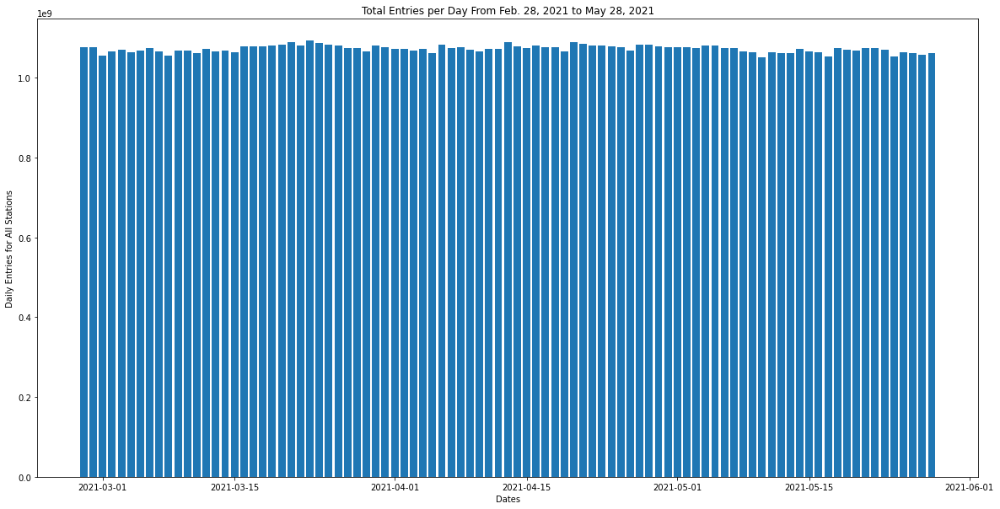

In [62]:
plt.figure(figsize=(20,10))
plt.bar(daily_agg.DATE_TIME, daily_agg.DAILY_ENTRIES)
plt.title('Total Entries per Day From Feb. 28, 2021 to May 28, 2021')
plt.xlabel('Dates')
plt.ylabel('Daily Entries for All Stations')
plt.show()

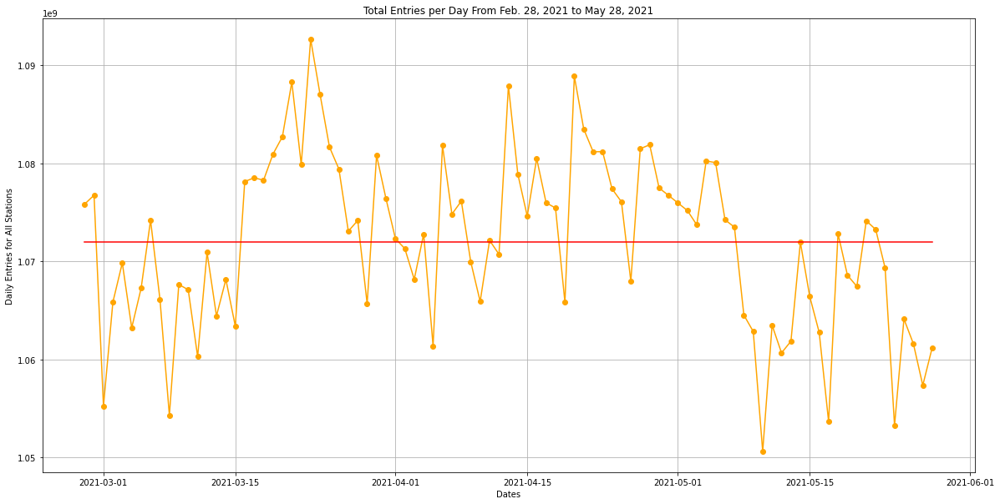

In [63]:
plt.figure(figsize=(20,10))
plt.plot(daily_agg.DATE_TIME, daily_agg.DAILY_ENTRIES, '-o', color='orange')
avg = [1072021411.0329671 for i in daily_agg.DATE_TIME]
plt.plot(daily_agg.DATE_TIME, avg, color='red')
plt.title('Total Entries per Day From Feb. 28, 2021 to May 28, 2021')
plt.xlabel('Dates')
plt.ylabel('Daily Entries for All Stations')
plt.grid()
plt.show()

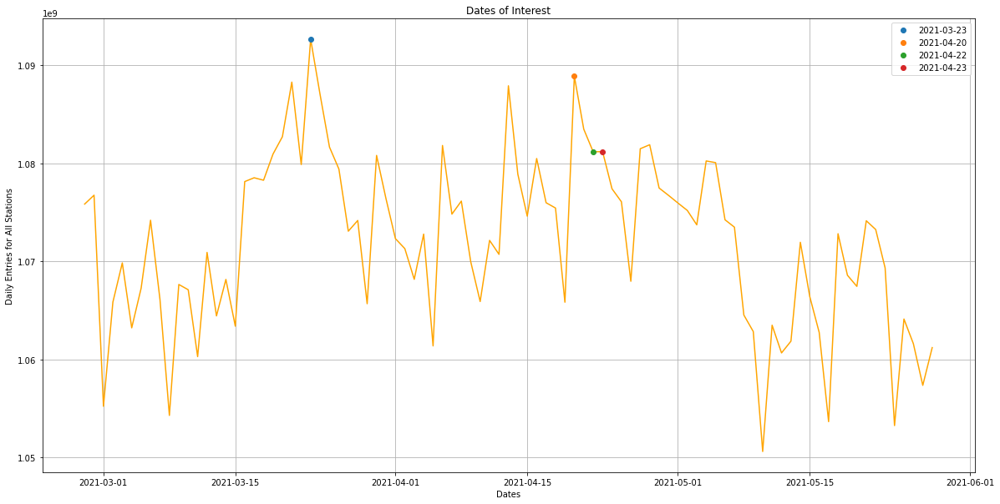

In [64]:
plt.figure(figsize=(20,10))
plt.plot(daily_agg.DATE_TIME, daily_agg.DAILY_ENTRIES, color='orange')
plt.plot(daily_agg.DATE_TIME[daily_agg.DATE_TIME == '2021-03-23'], 
         daily_agg[daily_agg.DATE_TIME == '2021-03-23'].DAILY_ENTRIES, 'o',label='2021-03-23')
plt.plot(daily_agg.DATE_TIME[daily_agg.DATE_TIME == '2021-04-20'], 
         daily_agg[daily_agg.DATE_TIME == '2021-04-20'].DAILY_ENTRIES, 'o',label='2021-04-20')
plt.plot(daily_agg.DATE_TIME[daily_agg.DATE_TIME == '2021-04-22'], 
         daily_agg[daily_agg.DATE_TIME == '2021-04-22'].DAILY_ENTRIES, 'o',label ='2021-04-22')
plt.plot(daily_agg.DATE_TIME[daily_agg.DATE_TIME == '2021-04-23'], 
         daily_agg[daily_agg.DATE_TIME == '2021-04-23'].DAILY_ENTRIES, 'o',label='2021-04-23')

plt.title('Dates of Interest')
plt.xlabel('Dates')
plt.ylabel('Daily Entries for All Stations')
plt.legend()
plt.grid()
plt.show()

Text(0, 0.5, 'Daily Entries')

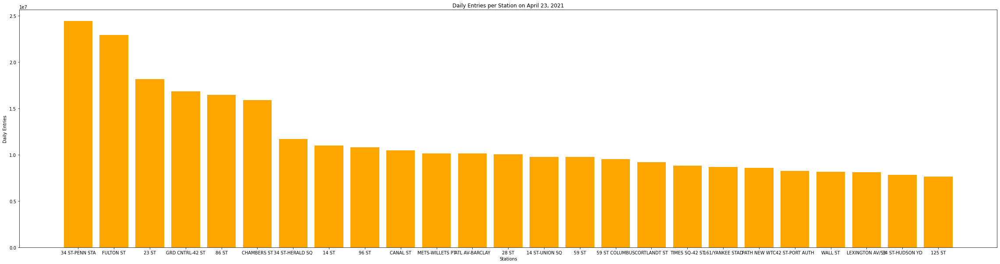

In [53]:
station_daily_agg.sort_values('DAILY_ENTRIES',ascending = False, inplace = True, ignore_index = True)
x = station_daily_agg[station_daily_agg.DATE_TIME == '2021-04-23'].STATION
y = station_daily_agg[station_daily_agg.DATE_TIME == '2021-04-23'].DAILY_ENTRIES

plt.figure(figsize = (40,10))
plt.bar(x[:25],y[:25],color='orange')
plt.title('Daily Entries per Station on April 23, 2021')
plt.xlabel('Stations')
plt.ylabel('Daily Entries')

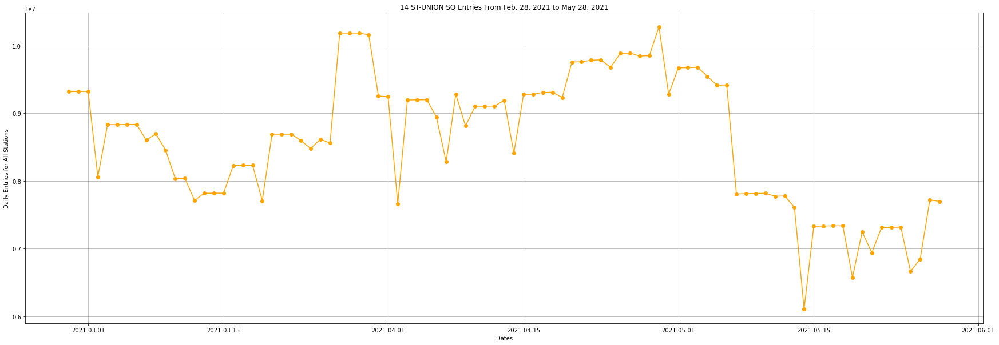

In [77]:
station_daily_agg.sort_values('DATE_TIME',ascending = False,ignore_index = True)
plt.figure(figsize = (30,10))
x = station_daily_agg[station_daily_agg.STATION == '14 ST-UNION SQ'].sort_values('DATE_TIME').DATE_TIME
y = station_daily_agg[station_daily_agg.STATION == '14 ST-UNION SQ'].sort_values('DATE_TIME').DAILY_ENTRIES

plt.plot(x,y,'-o', label = '4 ST-UNION SQ',color='orange')
plt.title('14 ST-UNION SQ Entries From Feb. 28, 2021 to May 28, 2021')
plt.xlabel('Dates')
plt.ylabel('Daily Entries for All Stations')
plt.grid()

In [79]:
def plot_station_daily (stations):
    '''
    Given a stations dataframe creates a line chart with the stations specified in the dataframe.
    Shows Dates logged on the x axis and number of entries on the y axis.
    '''
    plt.figure(figsize = (30,10))
    stations_used = []
    for station in stations['STATION'].unique():
        x = station_daily_agg[station_daily_agg.STATION == station].sort_values('DATE_TIME').DATE_TIME
        y = station_daily_agg[station_daily_agg.STATION == station].sort_values('DATE_TIME').DAILY_ENTRIES
        plt.plot(x,y, '-o', label = station)
        stations_used.append(station)
    plt.legend(stations_used,fontsize=15)
    plt.grid()
    plt.show()

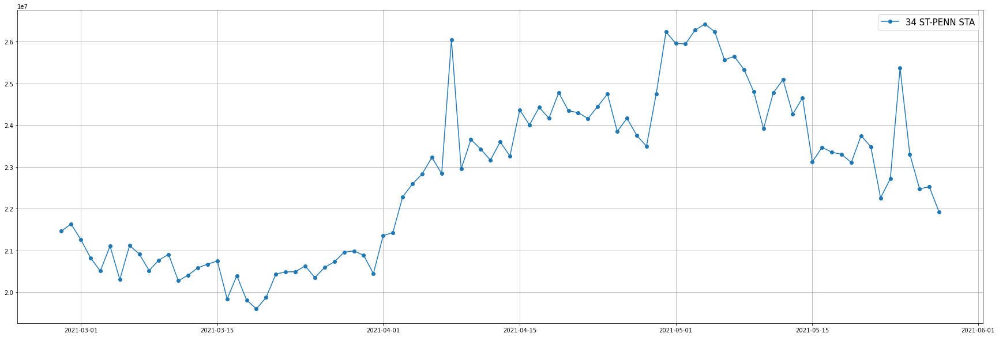

In [80]:
plot_station_daily(station_daily_agg[station_daily_agg.STATION == '34 ST-PENN STA'])

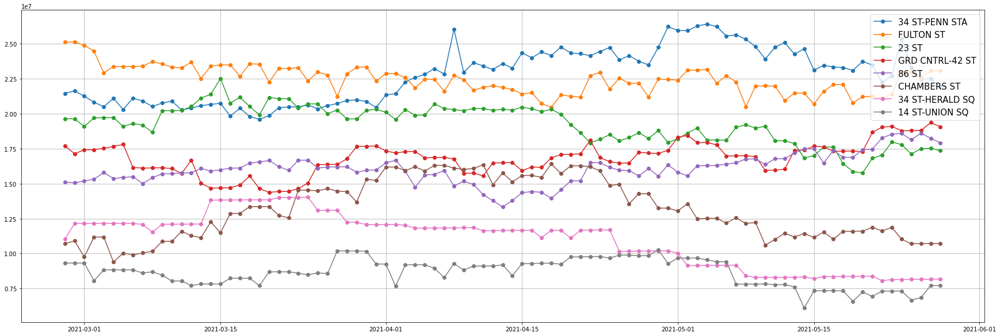

In [81]:
mask = station_daily_agg['STATION'].isin(['34 ST-PENN STA','FULTON ST','GRD CNTRL-42 ST','23 ST',
                                          '86 ST','CHAMBERS ST','34 ST-HERALD SQ',
                                          '14 ST-UNION SQ'])
plot_station_daily(station_daily_agg[mask])

Text(0, 0.5, 'Daily Entries')

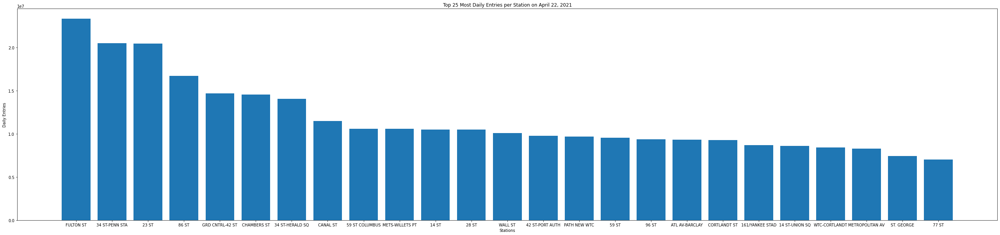

In [49]:
# Shows the 25 most popular stations on March 23, 2021, this is a Tuesday 
station_daily_agg.sort_values('DAILY_ENTRIES',ascending = False, inplace = True, ignore_index = True)
x = station_daily_agg[station_daily_agg.DATE_TIME == '2021-03-23'].STATION
y = station_daily_agg[station_daily_agg.DATE_TIME == '2021-03-23'].DAILY_ENTRIES

plt.figure(figsize = (45,10))
plt.bar(x[:25],y[:25])
plt.title('Top 25 Most Daily Entries per Station on April 22, 2021')
plt.xlabel('Stations')
plt.ylabel('Daily Entries')

Text(0, 0.5, 'Daily Entries')

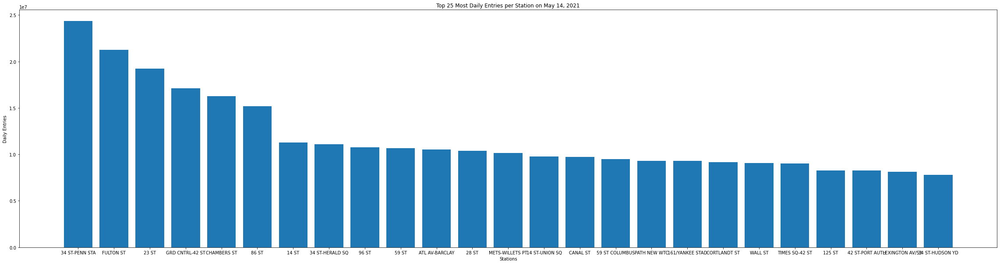

In [50]:
#looks at the second largest amount of daily entries in a day (420 activities in NY?)
station_daily_agg.sort_values('DAILY_ENTRIES',ascending = False, inplace = True, ignore_index = True)
x = station_daily_agg[station_daily_agg.DATE_TIME == '2021-04-20'].STATION
y = station_daily_agg[station_daily_agg.DATE_TIME == '2021-04-20'].DAILY_ENTRIES

plt.figure(figsize = (40,10))
plt.bar(x[:25],y[:25])
plt.title('Top 25 Most Daily Entries per Station on May 14, 2021')
plt.xlabel('Stations')
plt.ylabel('Daily Entries')

Text(0, 0.5, 'Daily Entries')

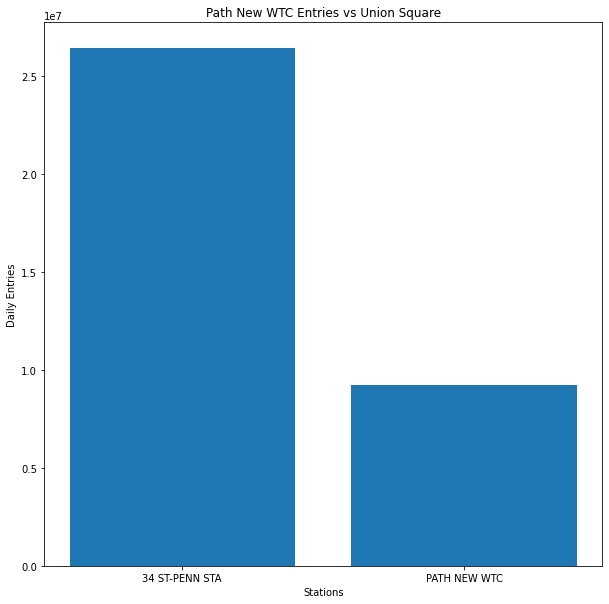

In [51]:
#compares daily entries of 2 stations on a given date
station_daily_agg.sort_values('DAILY_ENTRIES',ascending = False, inplace = True, ignore_index = True)
x = station_daily_agg[(station_daily_agg.DATE_TIME == '2021-04-22')&
                         (station_daily_agg.STATION == 'PATH NEW WTC')|
                         (station_daily_agg.STATION == '34 ST-PENN STA')].STATION
y = station_daily_agg[(station_daily_agg.DATE_TIME == '2021-04-22')&
                         (station_daily_agg.STATION == 'PATH NEW WTC')|
                         (station_daily_agg.STATION == '34 ST-PENN STA')].DAILY_ENTRIES

plt.figure(figsize = (10,10))
plt.bar(x,y)
plt.title('Path New WTC Entries vs Union Square')
plt.xlabel('Stations')
plt.ylabel('Daily Entries')

Text(0, 0.5, 'Daily Entries')

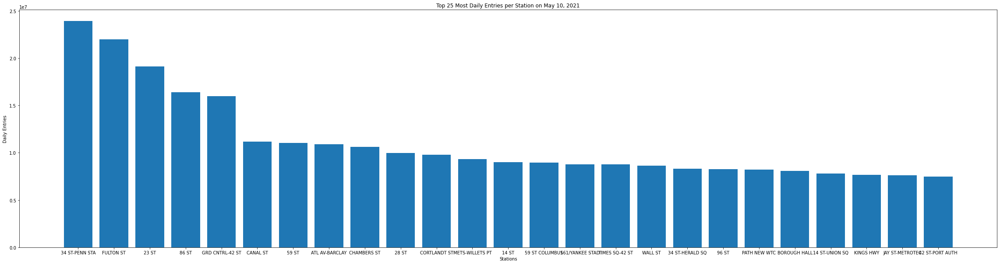

In [52]:
#May 10, 2021 lightest traffic day of the dataset
station_daily_agg.sort_values('DAILY_ENTRIES',ascending = False, inplace = True, ignore_index = True)
x = station_daily_agg[station_daily_agg.DATE_TIME == '2021-05-10'].STATION
y = station_daily_agg[station_daily_agg.DATE_TIME == '2021-05-10'].DAILY_ENTRIES

plt.figure(figsize = (40,10))
plt.bar(x[:25],y[:25])
plt.title('Top 25 Most Daily Entries per Station on May 10, 2021')
plt.xlabel('Stations')
plt.ylabel('Daily Entries')

## Citi Bike

In [82]:
citi_bike_df = pd.read_sql_table('cb', 'sqlite:///G:\My Drive\Coding\Metis\EDA\Project\Data\citi_bike.db')
citi_bike_march = pd.read_sql_table('202103-citibike-tripdata', 'sqlite:///G:\My Drive\Coding\Metis\EDA\Project\Data\citi_bike.db')
citi_bike_may = pd.read_sql_table('202105-citibike-tripdata', 'sqlite:///G:\My Drive\Coding\Metis\EDA\Project\Data\citi_bike.db')

In [83]:
citi_bike_df=pd.concat([citi_bike_df,citi_bike_march,citi_bike_may], ignore_index=True)

In [84]:
citi_bike_df['started_at'] = pd.to_datetime(citi_bike_df.started_at)
citi_bike_df['ended_at'] = pd.to_datetime(citi_bike_df.ended_at)

In [85]:
citi_bike_df['started_at'] = citi_bike_df['started_at'].dt.date
citi_bike_df['ended_at'] = citi_bike_df['ended_at'].dt.date

In [86]:
citi_bike_df.sort_values(["started_at", "ended_at"], 
                          inplace=True, ascending=False)
citi_bike_df.drop_duplicates(inplace=True)

In [87]:
bike_daily = (citi_bike_df
              .groupby(["started_at"])['ride_id']
              .agg('count').reset_index())

In [88]:
bike_daily.rename(columns = {"started_at":'date','ride_id':'rides_total'},inplace = True)
bike_daily

,date,rides_total
0,2021-03-01,34575
1,2021-03-02,32100
2,2021-03-03,50122
3,2021-03-04,40247
4,2021-03-05,36338
...,...,...
87,2021-05-27,112627
88,2021-05-28,62800
89,2021-05-29,30059
90,2021-05-30,17684


In [89]:
bike_daily.date=pd.to_datetime(bike_daily.date)

In [94]:
bike_daily.describe()

,rides_total
count,92.000000
mean,68727.478261
std,25785.428887
min,17684.000000
25%,49140.250000
50%,68290.500000
75%,89257.000000
max,118947.000000


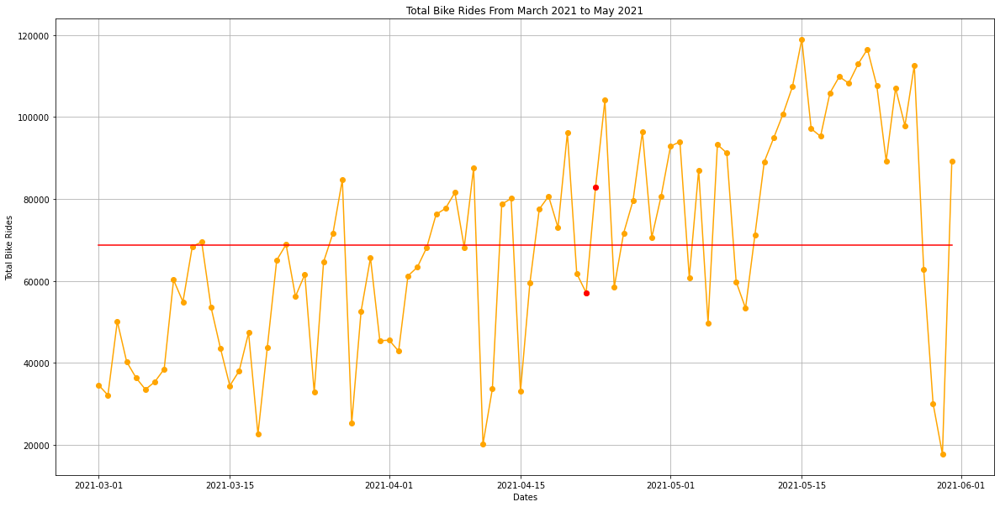

In [91]:
plt.figure(figsize=(20,10))
plt.plot(bike_daily.date, bike_daily.rides_total,'-o', color = 'orange')
avg = [68727.47826086957 for i in bike_daily.date]
plt.plot(bike_daily.date, avg, color='red')
plt.plot(bike_daily.date[bike_daily.date == '2021-04-22'], 
         bike_daily[bike_daily.date == '2021-04-22'].rides_total, 'o',label ='2021-04-22',color = 'red')
plt.plot(bike_daily.date[bike_daily.date == '2021-04-23'], 
         bike_daily[bike_daily.date == '2021-04-23'].rides_total, 'o',label='2021-04-23',color = 'red')
plt.title('Total Bike Rides From March 2021 to May 2021')
plt.xlabel('Dates')
plt.ylabel('Total Bike Rides')
plt.grid()
plt.show()

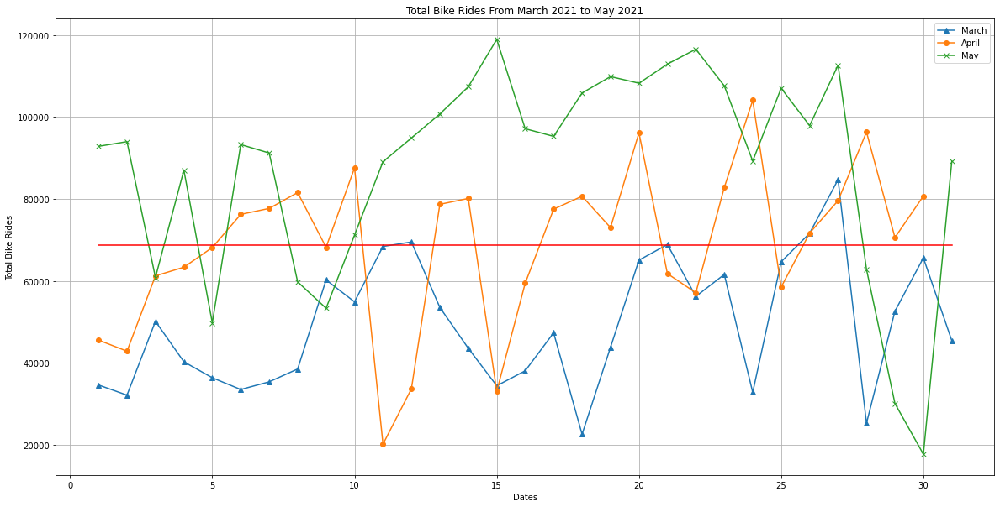

In [92]:
may = bike_daily['date'].dt.month==5
march = bike_daily['date'].dt.month==3
april = bike_daily['date'].dt.month==4
plt.figure(figsize=(20,10))
plt.plot(bike_daily.date[march].dt.day, bike_daily.rides_total[march],'-^',label='March')
plt.plot(bike_daily.date[april].dt.day, bike_daily.rides_total[april],'-o',label='April')
plt.plot(bike_daily.date[may].dt.day, bike_daily.rides_total[may],'-x',label='May')
avg = [68727.47826086957 for i in bike_daily.date[may].dt.day]
plt.plot(bike_daily.date[may].dt.day, avg, color='red')
plt.title('Total Bike Rides From March 2021 to May 2021')
plt.xlabel('Dates')
plt.ylabel('Total Bike Rides')
plt.legend()
plt.grid()
plt.show()